In [67]:
import json
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import seaborn as sns
import plotly.graph_objs as go
%run DataBaseTraitement.ipynb
# from DataBaseTraitement import persisetDB as db

All existing tables: ()
l_recipe_ingredient user was found


In [68]:
def readJson(file):
    json_file = open(file, encoding='utf-8')
    data = json_file.read()
    recipes = json.loads(data)
    json_file.close()
    return recipes

In [69]:
def getListIngredient(recipesList):
    listIngre = []
    cpt_ingredient = {}
    frequence = 5
    for index, recipe in enumerate(recipesList):
        for i, ingredient in enumerate(recipe['ingredients']):
            if ingredient['nom_ingre'] not in listIngre:
                listIngre.append(ingredient['nom_ingre'])
                cpt_ingredient[ingredient['nom_ingre']] = 1
            else:
                  cpt_ingredient[ingredient['nom_ingre']] += 1

    d = sorted(cpt_ingredient.items(), key=lambda x: x[1], reverse=True)
#     print("counter:",d)
    for k,v in cpt_ingredient.items():
        if v < frequence or v > 400:
            listIngre.remove(k)
    tmp = recipesList   
    for index, recipe in enumerate(recipesList):
        listIngreTmp = []
        for k, ingredient in enumerate(recipe['ingredients']):
            listIngreTmp.append(ingredient['nom_ingre'])
        if  any(x in listIngreTmp for x in listIngre) == False:
            del tmp[index]
            
    done = set() 
    newRecipes = []
    for key, value in enumerate(tmp):
        nom = value['nom'].lower()
        if nom not in done:
            done.add(nom)  # note it down for further iterations
            newRecipes.append(value)
    for key, value in enumerate(newRecipes):
        value['id_cluster'] = key

    print("Recettes après traitement:",len(newRecipes))
    return  listIngre,newRecipes

In [70]:
def createVector(listIngredient, ListRecette):
    dataset = []
    listProvisoire = []
    vectorSize = len(listIngredient)
    recetteSize = len(ListRecette)
    for i, recette in enumerate(ListRecette):
        vector = np.zeros(vectorSize)
        for index, ingredient in enumerate(recette['ingredients']):
            listProvisoire.append(ingredient['nom_ingre'])
            for k,listIngre in enumerate(listIngredient):
                if listIngre in listProvisoire:
                    vector[k]= 1
            listProvisoire = []
        dataset.append(vector)
#         print(dataset)
    return np.array(dataset)

In [71]:
#Inertia measures how well a dataset was clustered by K-Means
# It is calculated by measuring the distance between each data point and its centroid, 
#squaring this distance, and summing these squares across one cluster.
def chooseOptimalCluster(dataset):
    sse = []
    k_list = range(1, 15)
    for k in k_list:
        km = KMeans(n_clusters=k)
        km.fit(dataset)
        sse.append([k, km.inertia_])
    oca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
    plt.figure(figsize=(12,6))
    plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
    plt.title('Optimal Number of Clusters using Elbow Method (Scaled Data)')
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia')
    plt.show()

In [72]:
def kmeans(dataset, n_clusters):
    pca = PCA(30)# a changer
    #Transform the data
    dataset = pca.fit_transform(dataset)
#     print("len dataset",len(dataset))
    kmeans = KMeans(n_clusters=n_clusters,init="random", random_state= 10)
    label = kmeans.fit_predict(dataset)
    centroids = kmeans.cluster_centers_
    u_labels = np.unique(label)
    plt.figure(figsize = (8,8))
    for i in u_labels:
        plt.scatter(dataset[label == i , 0] , dataset[label == i , 1] , label = i)
    plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color="black")
    plt.legend()
    plt.show()
    
    dataReturn = []
    for data in dataset:
        #generate an array with strings
        x_arrstr = np.char.mod('%f', data)
        #combine to a string
        x_str = ";".join(x_arrstr)
        dataReturn.append(x_str)
    return kmeans,dataReturn

In [73]:
# Using PCA to reduce the dataset into 3 principal 
def pca(dataset, n_clusters):
    kmeans_scale = KMeans(n_clusters=n_clusters, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(dataset)
    labels_scale = kmeans_scale.labels_
    pca2 = PCA(n_components=50).fit(dataset)
    pca2d = pca2.transform(dataset)
    plt.figure(figsize = (10,10))
    sns.scatterplot(pca2d[:,0], pca2d[:,1], 
                    hue=labels_scale, 
                    palette='Set1',
                    s=100, alpha=0.2).set_title('KMeans Clusters (4) Derived from Original Dataset', fontsize=15)
    plt.legend()
    plt.ylabel('PC2')
    plt.xlabel('PC1')
    plt.show()
    
    Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))
    labels = labels_scale
    trace = go.Scatter3d(x=pca2d[:,0], y=pca2d[:,1], z=pca2d[:,2], 
            mode='markers',marker=dict(color = labels, colorscale='Viridis', 
            size = 10, line = dict(color = 'gray',width = 5)))
    layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
    data = [trace]
    fig = go.Figure(data = data, layout = layout)
    fig.show()


In [74]:
#Feature Reduction via PCA
def featureReduce(df_scale):
    n_components = len(dataset[0])
    pca = PCA(n_components=n_components)
    pca_scale = pca.fit(df_scale)
    print(pca_scale)
    variance = pca.explained_variance_ratio_
    var = np.cumsum(np.round(variance, 3)*100)
    plt.figure(figsize=(12,6))
    plt.ylabel('% Variance Explained')
    plt.xlabel('# of Features')
    plt.title('PCA Analysis')
    plt.ylim(0,100.5)
    plt.plot(var)
    
    
    #check the variance ratio
    pca = PCA(n_components=6)
    pca_scale = pca.fit_transform(df_scale)
    pca_df_scale = pd.DataFrame(pca_scale, columns=['pc1','pc2','pc3','pc4','pc5','pc6'])
    print("pourcentage of the first PCAs")
    print("we will use 70 features instead of 338")
    print(pca.explained_variance_ratio_)
    return pca_scale

In [75]:
# Applying KMeans to PCA Principal Components
def elbowPCA(pca_df_scale):
    sse = []
    k_list = range(1, 15)
    for k in k_list:
        km = KMeans(n_clusters=k)
        km.fit(pca_df_scale)
        sse.append([k, km.inertia_])

    pca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
    plt.figure(figsize=(12,6))
    plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
    plt.title('Optimal Number of Clusters using Elbow Method (PCA_Scaled Data)')
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia')

In [76]:
# Silhouette analysis can be used to study the separation distance between the resulting clusters
def silhouette(pca_df_scale):
    kmeans_pca_scale = KMeans(n_clusters=4, 
    n_init=100, max_iter=400, init='k-means++', random_state=46).fit(pca_df_scale)
    print('KMeans PCA Scaled Silhouette Score: {}'.format(silhouette_score(pca_df_scale, 
    kmeans_pca_scale.labels_, metric='euclidean')))
    labels_pca_scale = kmeans_pca_scale.labels_

le nombre de recettes raw 2647
Recettes après traitement: 2541
PCA(n_components=494)
pourcentage of the first PCAs
we will use 70 features instead of 338
[0.03467403 0.02381413 0.02235419 0.01898733 0.01783885 0.0162039 ]
KMeans PCA Scaled Silhouette Score: 0.41114113800362473


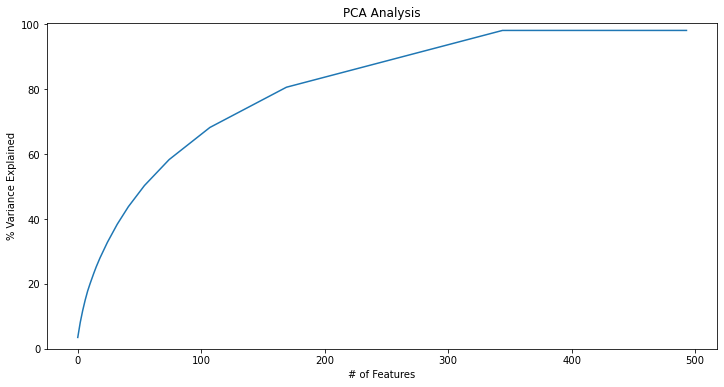

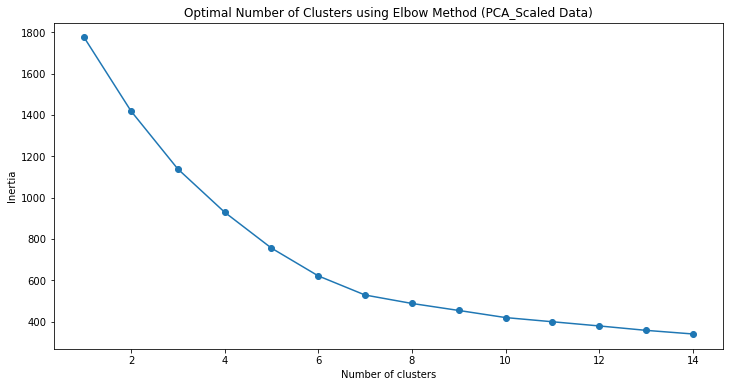

In [77]:
file = "test.json"
ListRecetteRaw = readJson(file)
print("le nombre de recettes raw",len(ListRecetteRaw))
listIngredient,listRecette = getListIngredient(ListRecetteRaw)
dataset = createVector(listIngredient, listRecette)
pca_scale = featureReduce(dataset)
elbowPCA(pca_scale)
silhouette(pca_scale)

In [78]:
def get_ingredients(recipes):
        dict = {}
        for r in recipes:
            for i in r.get('ingredients', []):
                id = i.get('id_ingre')
                if id in dict:
                    dict[id][1] += 1
                else:
                    dict[id] = [i.get('nom_ingre'), 1]
        return dict
def get_ingr_rank(recipes):
    dict = get_ingredients(recipes)
    return sorted(dict.items(), key=lambda i: i[1][1], reverse=True)
#         return {k: v for k, v in sorted(listIngre.items(), key=lambda item: item[1], reverse=True)}

In [79]:
def linkCluster(kmeans,dataset,recipes,n_clusters):
    print(dataset[0])
    recipes_db = []
    for label in range(n_clusters):
        label_index = [i for i, x in enumerate(kmeans.labels_) if x == label]
#         recipes_cluster = [recipes[index] for index in label_index]
        recipes_cluster = []
        for index in label_index:
            for recipe in recipes:
                 if(recipe['id'] == index):
                        recipes_cluster.append(recipe)
        ingredients_ranked = get_ingr_rank(recipes_cluster)
        print("\n\nCluster", label, ":")
        ranking_string = ""
        for index in range(len(ingredients_ranked)):
            ingredient = ingredients_ranked[index]
            if ingredient[1][1] != np.nan and ingredient[1][0] != np.nan:
                ranking_string += ingredient[1][0] + " (" + str(ingredient[1][1]) + "), "
        print(ranking_string + '\n')
        for index_recipe in label_index:
            for recipe in recipes:
                if(recipe['id_cluster'] == index_recipe):
                    recipe['cluster'] = label
                    recipe['coordonnees'] = dataset[index_recipe]
                    recipes_db.append(recipe)
#                     print("Id recette:",recipe['id'],'\n')
#                     print("Nom Recette:",recipe['nom'])
#                     print("List Ingredients:")
                    for ingrediet in recipe['ingredients']:
                        print(ingrediet['nom_ingre'])
    persisetDB(recipes_db)
    print("recipes_db",len(recipes_db))

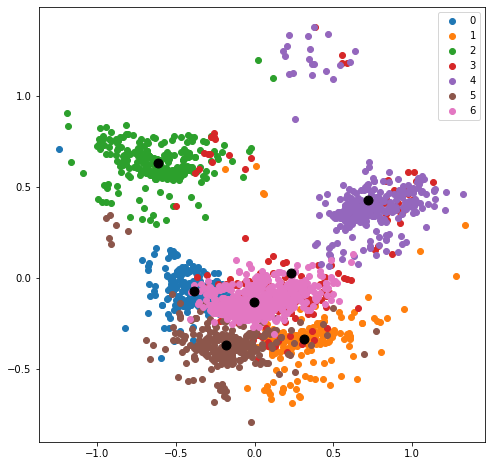

In [80]:
n_clusters = 7
k,d = kmeans(dataset,n_clusters)

In [81]:
linkCluster(k,d,listRecette,n_clusters)

0.028121;-0.152783;-0.046438;-0.093766;-0.084048;-0.097902;-0.071343;0.045205;-0.044492;-0.232557;0.074585;-0.138708;-0.131465;-0.065724;0.166983;0.001414;0.193577;-0.160336;-0.189586;-0.184954;0.000573;0.120189;-0.179516;-0.537642;-0.074694;0.043429;-0.121868;0.028793;0.018632;0.061171


Cluster 0 :
comté (202), beaufort (202), emmental (198), vin blanc sec (191), muscade (181), maïzena (169), liqueur (152), ail (121), poivre (93), oeuf (66), farine de blé (40), eau (23), sel (17), huile (8), farine de sarrasin (2), oeufs (2), 

sucre en poudre
Paille d'Or
gelée
crème fraîche liquide
oeuf
amandes
amandes
pommes
sucre en poudre
pâte feuilletée
compote
nappage
sirop
farine
sucre
sucre vanillé
levure
pruneau
beurre demi-sel
oeufs
jaune d'oeuf
thé
chocolat pâtissier
sucre vanillé
vinaigre de cidre
beurre
sucre en poudre
filo
poire
pommes
beurre
sucre vanillé
riz rond
cannelle
sucre
raisins secs
vergeoise brune
lait entier
chocolat
maïzena
sucre vanillé
pâte sablée
crème
oeuf
poire
poires


poudre d'amandes
oeufs
amandes
chocolat blanc
jus de citron
framboises
sucre glace
sucre glace
eau
cacao
sucre en poudre
blanc d'oeuf
poudre d'amandes
colorant
sucre glace
coulis framboise
mascarpone
crème liquide
sucre en poudre
sucre en poudre
gélatine
coulis framboise
pralin
pralin
chocolat noir
pralinoise
pâte de noisettes
gavotte
farine
farine
sucre glace
sucre en poudre
poudre d'amandes
blanc d'oeuf
beurre
sucre
chocolat noir
sucre vanillé
farine
amandes
oeufs
grand-marnier
sucre glace
noix
cacao
chocolat
blancs d'oeuf
sucre glace
framboises
crème fleurette
blancs d'oeuf
chocolat noir
chocolat noir
beurre doux
sucre
farine
oeufs
flocons d'avoine
banane
farine
purée
sucre
levure chimique
crème liquide
margarine
amandes
farine
sucre vanillé
yaourts
levure chimique
sucre
oeuf
beurre demi-sel
farine
sel
levure de boulanger
sucre
sucre vanillé
vanille
extrait de vanille liquide
beurre
oeufs
crème
chocolat pâtissier
sucre
sucre vanillé
farine
maïzena
oeufs
fruits
sucre en poudre
poudre



Cluster 1 :
beurre (266), vin blanc sec (265), farine (260), persil (251), sel (229), poivre (202), moules (176), échalotes (141), pois chiches (111), pilons de poulet (91), cubes de bouillon (66), navets (52), échalote (34), vin rouge (25), feuilles de laurier (16), thym (11), basilic (8), muscade (4), fromage râpé (3), Parmesan (3), sel (3), poivre (2), boeuf haché (1), 

poireaux
carottes
céleri
oignons
ail
bouquet garni
clous de girofle
gros sel
poivre
viande
boeuf
boeuf
os à moelle
oignons
tomates cerise
ail
jus de citron
bouillon de volaille
feuille de laurier
sel
poivre
poulet
oignons
carottes
bouquet garni
vin rouge
beurre
sel
poivre
bourguignon
oignons
riz
sésame
coriandre
gingembre
huile de sésame
vinaigre de riz
piment de Cayenne
saumon frais
avocats
mangue
sauce teriyaki
tomates
oignons
ail
thym
poivre
sel
curcuma
piment
huile d'olive
saucisses
laurier
poireaux
carottes
oignons
bouillon de volaille
crème fraîche
maïzena
escalopes de dinde
courgettes
aubergine
oignons
toma

cuisses de poulet
nouilles chinoises
courgettes
oignons
gruyère râpé
crème fraîche
beurre
sel
poivre
oeufs
riz
oignons
huile
oeufs
crevettes
jambon
petits pois
oignons
vin blanc
crème fraîche
beurre
huile d'olive
poivre
sel
blanc de poulet
moutarde à l'ancienne
tomates
oignons
farine
eau
poivre
sel
menthe
champignon de Paris
oignons
ail
whisky
vin blanc
crème fraîche
farine
beurre
persil
noix de saint-jacques
crevettes
sel et poivre
oignons
carottes
courgettes
paprika
poivre
sel
huile d'olive
vermicelles de riz
échalotes
champignon frais
crevette rose
noix de saint-jacques
sauce aigre douce
vin rouge
oignons
carottes
bouquet garni
ail
épices
poivre
sel
farine
cognac
joue de porc
lardons fumés
huile
farine
oignons
lard fumé
concentré de tomates
vin rouge
vin rouge
carottes
oignons
thym
feuille de laurier
poivre
sel
croûtons
croûtons
épaule
épaule
champignon de Paris
oignons
ail
whisky
vin blanc
crème fraîche
farine
beurre
persil
noix de saint-jacques
crevettes
sel et poivre
oignons
fari

arôme amande amère
lait
lait
sucre
fécule de maïs
vanille
jaune d'oeuf
lait
lait
pâtes feuilletées
jaune d'oeuf
farine
sucre
sel
levure chimique
beurre
eau de fleur d'oranger
banane
lait
oeufs
oignon
beurre
farine
lait
fromage râpé
lasagnes
cuisses de canard
girolle
farine
sucre
huile
lait
levure chimique
sucre vanillé
chocolat
oeufs
sucre
huile
farine
levure
lait
oeuf
farine
sucre
lait
huile
levure
bananes
oeufs
poudre d'amandes
riz
champignon
curcuma
farine
beurre
lait
citron
poivre
sel
Volaille
jambon
cube de bouillon
lait
sucre
noix de coco
bananes
baguette
oeufs
farine
farine de blé noir
sucre vanillé
lait
sucre de canne
cannelle
huile
oeufs
chorizo
pain de mie
lait
ail
persil
huile d'olive
encornet
oeuf
bouillon de légumes
lait concentré sucré
lait
vanille
lait concentré non sucré
oeufs
caramel
citron vert
lait concentré sucré
lait
vanille
lait concentré non sucré
oeufs
caramel
citron vert
sel
sucre en poudre
farine
beurre
lait
sucre vanillé
oeufs
cerises
crème fraîche
chocolat n



Cluster 3 :
oignons (306), carottes (305), bouquet garni (300), vin rouge (289), beurre (265), sel (232), poivre (192), bourguignon (158), concombre (131), crabe (98), sauce soja (73), échalotes (46), avocat (26), ail en poudre (17), mélange d'épices mexicaines (12), bouillon de légumes (9), maïs (8), sauce soja (4), galettes de blé (3), échalote (2), Graines de moutarde (1), pousses de moutarde verte (1), 

vin blanc sec
crème fraîche
champignon
moutarde
huile d'olive
beurre
filet mignon
bouillon de légumes
emmental
lait
crème fraîche
beurre
ail
persil
cuisses de canard
macaroni
échalotes
beurre
champignon de Paris
ail
romarin
feuille de laurier
porto
crème fraîche
poivre
sel
échalote
Foie gras
farine
oignon
champignons
concentré de tomates
moutarde
crème fraîche
escalopes de poulet
cube de bouillon
riz
crème fraîche
tomate
poivre
sel
huile d'olive
escalopes de poulet
roquefort
champignon
pommes
citron
calvados
crème fraîche
beurre
thym
poivre
sel
pintade
échalotes
lait concentré su

cube de bouillon
sucre
crème fraîche
pommes
cassonade
oeufs
crème fraîche
sucre en poudre
orange
liqueur
sucre
oeufs
sucre
crème fraîche
lait
gélatine
framboises
oeufs
lait demi-écrémé
crème fraîche
sucre vanillé
sucre
vanille
chocolat
oeufs
lait concentré
chocolat noir
beurre de cacahuètes
crème fraîche
sel
sucre
crème fraîche
fruits
vin blanc sec
eau
champignon
crème fraîche
poivre
sel
pâtes feuilletées
échalote
coquilles saint-jacques
crevettes
poisson
crème fraîche
vinaigre
Magret de Canard
mangues
bananes
beurre
miel
citron
crème fraîche
crème fraîche
beurre
escalopes de poulet
gnocchi
brique
mozzarella
cubes de bouillon
endives
sel
coriandre en grains
feuilles de laurier
crème fraîche
huile d'olive
pâtissons
fonds d'artichaut
panais
baies roses
farine
sucre
crème fraîche
sel
levure de boulanger
beurre
oeufs
pommes de terre
eau
bouillon de volaille
origan
poivre
sel
beurre
crème fraîche
chou-fleur
ail
oignon
crème fraîche
jus de citron
ketchup
avocats
ciboulette
pomme de terre
ail

coriandre
oignon
sel
avocats
citron vert
oignon
huile d'olive
poivre
ail
sel
mozzarella
olives noires
basilic frais
bagel
purée de tomate en bouteille
oignon
ail
tomate
tabasco
sel
avocats
citron vert
lardons
oignon
reblochon
crozet
jambon blanc
beaufort
vin blanc sec
bouillon de poule
oignon
huile d'olive
crozet
aubergine
courgette
poivron
oignon
tomate
ail
huile d'olive
thym
feuille de laurier
poivre
sel
tomates
oignon
citron
fleur de sel
lait
poisson
concombre
ciboulette
oignon
gruyère râpé
pâte feuilletée
oeufs
feta
épinards
Brioch’Burger Sésame La Fournée Dorée
mayonnaise
mayonnaise
laitue
avocat
huile d'olive
saumon
saumon
oignon
chapelure
oeuf
persil
mayonnaise
jus de citron
sel
poivre
huile
oignon
piments
tomate
poivre
sel
oeufs
courgettes
oignon
gruyère râpé
huile d'olive
sel
origan
poivron rouge
crème liquide
oeufs
chèvre
riz pour risotto
oignon
asperge
huile d'olive
saumon fumé
poivron rouge
cubes de bouillon
courgettes
oignon
gruyère râpé
beurre
saumon
échalote
crème liquid

oignon
ail
huile d'olive
cumin
poivre
sel
lentilles vertes de nos agriculteurs Vivien Paille
lait de coco
coulis de tomate
oignon
curry
citron vert
coriandre
huile
riz basmati Vivien Paille
lardons
carottes
oignon
ail
vin blanc
farine
pommes de terre
jarret de porc
saucisses
lentilles
concentré de tomates
oignon
ail
sauce Worcester
parmesan râpé
huile d'olive
poivre
sel
spaghetti
boeuf haché
ail
oignon
huile d'olive
poivre
sel
thym
lentilles vertes
saucisses
lardons
gruyère râpé
oignon
ail
poivre
sel
macaroni
viande hachée
purée de tomate en bouteille
carotte
fond de veau
ail
huile de colza
oignon
poivre blanc
gros sel
quatre-épices
saucisses
lentilles vertes
Mayonnaise de Dijon Amora
tomates
poivron jaune
courgette
oignon
ail
quinoa
haché de veau
basilic
huile d'olive
sel
poivre
oignon
pois chiches
huile d'olive
concentré de tomates
piment
ail
poivre
sel
viande
piment vert
persil
persil
fromage râpé
ail
poivre
sel
chou-fleur
oeufs
oignon
ail
poivron
quinoa
citron
paprika
piment
basili

oignon
clous de girofle
ail
bouquet garni
poivre
sel
boeuf
os à moelle
rave
carottes
pomme de terre
poireaux
oignon
ail
bouquet garni
gros sel
viande
navets
chou
bière
lard fumé
beurre
oignon
poivre
sel
ail
origan
thym
fécule de maïs
raisins secs
genièvre
poulet entier
laurier
vergeoise
cube de bouillon
pois chiches
pommes de terre
carottes
oignon
ail
chorizo
boeuf
lard
travers de porc
carottes
poireaux
oignon
clous de girofle
ail
bouquet garni
boeuf
os à moelle
rave
céleri branche
sel et poivre
carottes
poireaux
oignon
clous de girofle
ail
bouquet garni
boeuf
os à moelle
rave
céleri branche
sel et poivre
carottes
poireaux
pommes de terre
céleri
bouillon de volaille
bouquet garni
oignon
lardons
cuisses de dinde
oignon
miel
blancs de poulet
échalote
sauce soja
vin blanc
carottes
oignon
bouquet garni
céleri
piment
sucre de canne
beurre
poivre
sel
jambon
blanc de poireau
ananas
jus d'ananas
rhum vieux
bière
moutarde
huile d'olive
vinaigre balsamique
oignon
ail
thym
poivre
sel
sanglier
gui

farine
eau
poivre
sel
huile d'olive
Fleurs
oeuf
bananes
pommes
rhum
fleur d'oranger
eau
sucre
fraises
sucre
vanille
citron
vin
gingembre
cognac
orange
citron
cannelle
sucre
porto rouge
triple sec (cointreau, grand marnier)
fruits de saison
kéfir
sucre
orange
eau
citrons
sucre
eau
Alcool
eau
citron
mélisse
menthe
eau
sucre
menthe
vin blanc
eau
orange
aperol
glaçons
vin rouge
eau
citrons
orange
cannelle
sucre en poudre
citron
eau
sucre
triple sec
vin rouge
sucre roux
citron
orange
cannelle
étoiles de badiane
clous de girofle
gingembre
orange
couteau
eau
miel
fleur d'oranger
eau
sucre
café
fromage frais à la framboise Isigny Sainte-Mère
fruits rouges
eau
sucre
eau
sucre de canne
café
rhum vieux
eau
sucre
café instantané lyophilisé
glaçons
sucre
eau
cerises
orange
eau
sucre en poudre
Alcool
sucre semoule
eau
mûres
Alcool
fraises
sucre
eau
cannelle
quatre-épices
jus de citron
basilic
eau
sucre
citron
huile
huile
farine
sucre
levure chimique
oeufs
yaourt nature
semoule fine
sucre
citron
melo



Cluster 6 :
tomates (871), oignon (871), citron (863), thym (835), huile d'olive (777), vin blanc sec (702), sel (593), poivre (461), bar (347), laurier (259), oranges (188), vanille (131), ananas (84), citrons verts (59), sirop de canne (46), sirop de canne (37), sucre vanillé (17), rhum vieux (14), citron vert (11), lait de coco (8), sirop de canne (6), sirop de canne (6), rhum (4), citron vert (3), glace pilée (1), rhum (1), rhum (1), fruits (1), sirop de canne (1), sirop de canne (1), rhum (1), citron vert (1), 

vin blanc
mont d'or
beurre
vin blanc sec
farine
persil
sel
poivre
moules
échalotes
pomme de terre
pommes de terre
sauce barbecue
gouda
comté
beaufort
emmental
vin blanc sec
muscade
maïzena
liqueur
ail
poivre
oeuf
curcuma
cannelle
gingembre
lait de soja
poivre
huile de coco
gruyère râpé
beurre
sel
poivre
macaroni
cube de bouillon
jambon fumé
crème liquide
blanc de poulet
chapelure
oeufs
farine
persil
menthe
basilic
poudre d'amandes
asperges vertes
courgette
huile d'olive


beurre
huile d'olive
poivre
sel
oeufs
échalotes
cantal
crème fraîche liquide
huile d'olive
moutarde
vinaigre de vin
câpres
poivre
sel
herbes
bouillon
tomate
poivron
ail
céleri
vinaigre
huile d'olive
poivre
sel
concombre
pain
Pâte Sablée HERTA® Trésor de Grand Mère
poires
crème de marron
noisettes
cassonade
menthe
miel
aneth
gros sel
poivre
beurre
saumon
pâtes feuilletées
carré frais
olives noires
olives vertes
pomme de terre
gruyère râpé
poivre
muscade
bûche de chèvre
coppa
oeufs
crème liquide
poivre
saumon fumé
oeufs
crème fraîche épaisse
ail
huile d'olive
vinaigre balsamique
sucre
tabasco
tomates pelées
poivron vert
concombre
échalote
sel et poivre
surimi
maïzena
feuilles de coriandre
curry
coeur de palmier
gouda
crème liquide
poivre
pâte feuilletée
Fromage Saint Agur
herbes
crème liquide
ail
basilic
huile
fleur de sel
farine
huile d'olive
pâte feuilletée
lardons
oeufs
crème épaisse
fèves
pomme de terre
ail
concentré de tomates
thym
huile d'olive
poivre
sel
saucisse
fèves
oignons bla

persil
ail
huile d'olive
calamar
estragon
chocolat blanc
crème fraîche liquide
brownie
fraises
miel
jus de citron
skyr
riz rond
sucre
lait entier
oeuf
pâte de pistache
mascarpone
piment
sauce tomate
huile
olives
épices
anchois
aubergine
tomate
beurre
vin blanc
anchois
figues
laurier
échalotes
aubergines
tapenade noire
moutarde
huile d'olive
emmental
romarin
herbes de Provence
pâte feuilletée
fromage de chèvre
anchois
pain de mie
aubergine
gruyère râpé
Vache qui rit®
anchois
tomates
courgette
tomate
persil
coriandre
muscade
ail
poivre
sel
Parmesan
huile d'olive
penne
lait concentré non sucré
aubergines
câpres
ail
persil
huile d'olive
poivre
sel
poivrons verts
anchois
chapelure
gélatine
poivre
sel
fond
saumon fumé
truite
crème liquide
oeuf de lump
courgette
bouillon de volaille
ail
bouquet garni
huile d'olive
beurre
poivre
sel
filet mignon
raisins secs
tomate
huile d'olive
ail
basilic
poivre
sel
lieu noir
oeufs
beurre
chocolat
sucre
farine
oeufs
extrait de vanille
framboises
chocolat bla

noix de coco rapée
farine
sucre
blancs d'oeuf
yaourt aux fruits
vanille
sucre
maïzena
lait de riz
tofu soyeux
poireaux
huile d'olive
jus de citron
parmesan râpé
poivre
sel
spaghetti
bacon
petits pois
crème fraîche épaisse
romarin
saucisse
échalote
tomates pelées
maïs
pâte grecque
lardons
coude
petits pois
tomates
courgettes
herbes de Provence
persil
thym
romarin
poivre
sel
gruyère râpé
huile d'olive
rôti de porc
boursin
chapelure
fond de veau
champignon
côtes de porc
ail
poivre
sel
foie
béchamel
oeufs
noix
dattes
lait concentré sucré
vanille
cannelle
muscade
oeufs
caramel
chocolat noir
beurre de cacahuètes
sel
cacahuètes
dattes
huile de coco
pâtes
lardons
petits pois
crème fraîche liquide
fromage blanc
vinaigre balsamique
persil
penne
petits pois
jambon blanc
ciboulette
carotte
bouquet garni
poivre
saucisses
lentilles vertes
lardons fumés
oignon blanc
carotte
bouquet garni
poivre
saucisses
lentilles vertes
lardons fumés
oignon blanc
pâtes
sauce bolognaise
gruyère râpé
sel
crème liquide

prosecco
litchis
litchi
jus de fruits rouges
limonade
cointreau
sirop de sucre de canne
citrons verts
glaçons
champagne
sucre
citrons
téquila
cointreau
glace pilée
grenadine
jus de citron
téquila
jus d'orange
vanille
chocolat
lait entier
glace vanille
crème chantilly
rhum
sucre de canne
bananes
jus d'orange
jus d'ananas
mangue
jus d'abricot
téquila
jus de citrons
triple sec (cointreau, grand marnier)
banane
lait concentré non sucré
glaçons
aspartame
rhum
sucre de canne
cannelle
jus d'orange
girofle
citron vert
fromage blanc
miel
melon
glaçons
sirop
orange
cannelle
étoiles de badiane
clous de girofle
vanille
jus de cranberries
jus d'orange
rhum blanc
aneth
brick
fromage de chèvre
oeuf
liqueur
rhum
muscadet
sirop
framboises
sucre de canne
café
sirop
glaçons
chocolat blanc
beurre
crème liquide
glace à la pistache
pistaches
vodka
orange
vanille
clous de girofle
cannelle
muscade
miel liquide
oranges
eau de fleur d'oranger
sucre
cannelle
menthe
rhum
jus de framboise
jus de fraise
jus de frui

pignons
ricotta
poivrons
tomates
poivre
sel
thym
torsades
échalotes
petits piments
mayonnaise
ciboulette
tomates
aubergine
courgette
huile d'olive
épices
gruyère râpé
pâte feuilletée
jambon
crème fraîche liquide
tomates
basilic
huile d'olive
poivre
pain aux céréales
mozzarella
salade
pain de mie
beurre
fromage râpé
ananas
jambon cru
toastinette
courgettes
huile d'olive
sel
poivre
noix de veau
échalotes
aubergine
sauce bolognaise
parmesan râpé
pain de mie
tomate
fromage blanc
moutarde de Dijon
jambon blanc
toastinette
ciboulette
aubergines
sauce tomate
sel
Parmesan
huile
mozzarella
huile d'olive
jus de citron
ail
tagliatelles
tagliatelles
ail
saumon
herbes
crème liquide
carotte
champignon de Paris
persil
huile d'olive
bouillon de boeuf
sel et poivre
lardons fumés
sauté de porc
échalotes
tomate
ail
huile d'olive
whisky
feuille de laurier
vin blanc
poivre
crevette rose
échalote
crème liquide
tomates
pesto
miel
ricotta
pâte à pizza
mozzarella
saumon
roquette
parmesan râpé
beurre
huile d'ol

tagliatelles fraîches
poivre
sel
quenelles
brique
Fines herbes
huile d'olive
herbes de Provence
poivre
sel
baguette
mozzarella
saucisson
fromage blanc
farine
poivre
sel
persil
oeufs
poivre
cheddar
bière brune
pain de campagne
jambon blanc
oeufs
moutarde à l'ancienne
farine
sucre semoule
beurre
sel
oeuf
miel
pommes
fleur de sel
poivre
Magrets de Canard
sauce soja
huile d'olive
vin blanc sec
filet mignon
lardons fumés
crème liquide
échalotes
figues
ficelle
filet mignon de porc Picard®
échalotes coupées Picard®
miel
vinaigre de cidre
Mirabelles de Lorraine Picard®
fond de volaille
graines de couscous bio Picard®️
graines de couscous bio Picard®️
amandes
persil coupé Picard®
farine
beurre
persil
ail
poivre
sel
poulets
ail
gingembre
huile de sésame
vermouth
miel
ailerons de poulet
soja
citrons
ail
piments
huile de friture
poivre
sel
poulets
oeufs
chapelure
huile d'olive
moutarde
ail
persil
poivre
sel
filet mignon
pâte feuilletée
crème épaisse
jaune d'oeuf
champignons de Paris
fond de veau
h

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("guignes","365","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("feuilles\ de\ guigne","366","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("fruits\ de\ saison","367","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("porto\ rouge","368","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("Coulis\ de\ fraise","369","https://assets\.afcdn\.com/recipe/20200708/112552_w96h96c1cx1085cy691cxb2170cyb1382\.jpg");
INGREDIENT :  insert into ingredient
     

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("lait\ de\ riz","652","https://assets\.afcdn\.com/recipe/20210308/118438_w96h96c1cx315cy276cxb631cyb553\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("tofu\ soyeux","653","https://assets\.afcdn\.com/recipe/20171110/74687_w96h96c1cx2651cy2442cxb5302cyb4884\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("pâte\ grecque","654","https://assets\.afcdn\.com/recipe/20210119/117433_w96h96c1cx866cy866cxb1732cyb1732\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("coude","655","https://assets\.afcdn\.com/recipe/20171227/76302_w96h96c1cx2000cy1500cxb4000cyb3000\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("rôti\ de\ porc","656","https://assets\.afcdn\.com/recipe/20190110/85795_w96h96c1cx150cy150cxb300cyb300\.jpg");
INGREDIENT :  in

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("escalopes\ de\ dinde","1031","https://assets\.afcdn\.com/recipe/20170607/67495_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("concombre","1032","https://assets\.afcdn\.com/recipe/20170607/67693_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("escalope\ de\ poulet","1033","https://assets\.afcdn\.com/recipe/20180315/77989_w96h96c1cx2550cy2550cxb5100cyb5100\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("camemberts","1034","https://assets\.afcdn\.com/recipe/20170607/67633_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("margarine","1035","https://assets\.afcdn\.com/recipe/20170607/67587_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,i

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("navets","1162","https://assets\.afcdn\.com/recipe/20170607/67703_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("chou","1163","https://assets\.afcdn\.com/recipe/20170607/67685_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("laurier","1164","https://assets\.afcdn\.com/recipe/20170607/67707_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("saumon","1165","https://assets\.afcdn\.com/recipe/20170607/67605_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("lard\ fumé","1166","https://assets\.afcdn\.com/recipe/20170607/67756_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("moutarde\ de\ Dijon",

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("11","Gâteau de fête au chocolat","Dessert;Gâteau;Gâteau au chocolat","https://assets.afcdn.com/recipe/20140510/39179_w1000h1000.jpg","0","NO VALUES","45 min","25 min","-","moyenne","moyen","1","-1.243069;0.705880;0.084093;-0.092879;0.052325;-0.121857;-0.150571;0.378070;-0.915375;0.151270;-1.064565;0.043514;0.047938;0.136557;0.138238;0.148721;-0.133932;-0.096127;-0.088786;0.039053;0.764589;0.054018;0.025141;0.261261;-0.213326;0.482600;-0.189327;0.192057;0.167861;-0.567573");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("12","Gâteau de fête glacé au citron","Dessert;Gâteau;Gâte

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("288","Crevettes aux mangues","Plat principal;Fruits de mer;Crevettes","https://assets.afcdn.com/recipe/20131024/6100_w1000h1000.jpg","1","NO VALUES","15 min","30 min","-","très facile","moyen","1","0.179573;-0.378435;-0.055086;0.483131;-0.295239;-0.178674;-0.090886;0.363463;-0.133759;-0.041822;0.086448;-0.026842;0.038133;0.028826;0.030963;-0.085810;-0.108303;-0.391158;-0.213539;-0.258744;0.086991;0.331121;-0.257768;-0.655399;-0.079433;-0.071273;0.113429;-0.022433;-0.050367;0.077557");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("289","Chili con carne facile","Plat principal;

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("504","Cheesecake au Carré Frais","Dessert;Cheesecake","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w1000h1000.jpg","2","NO VALUES","20 min","35 min","-","facile","bon marché","1","-0.602951;0.470327;-0.052953;0.058367;0.154372;0.727304;0.371194;0.352092;0.258997;0.387577;0.248502;-0.557681;0.290765;-0.382232;-0.333211;-0.250012;-0.011851;0.063394;-0.132179;0.020686;-0.109499;0.190352;-0.187980;0.025463;0.026873;0.064561;-0.125729;-0.058986;0.194150;-0.003892");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("505","Bûche au chocolat et crème de marron

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("831","Bûche de Noël Chocolat - Poires","Dessert;Bûche de noël;Bûche au chocolat","https://assets.afcdn.com/recipe/20131118/38181_w1000h1000.jpg","3","NO VALUES","1 h 30 min","12 min","3 h 15 min","difficile","bon marché","1","-0.035451;-0.128654;-0.770954;-0.037090;0.353861;-0.192639;-0.239130;-0.111483;-0.197305;-0.041217;-0.218016;0.080216;-0.092789;-0.063999;-0.140409;-0.044022;-0.086109;0.325424;-0.043633;-0.215740;-0.279226;0.165463;0.015040;0.092368;-0.065204;-0.026819;-0.135666;-0.066554;-0.111014;-0.295182");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("832","Verrine

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1112","Oeufs à la Mexicaine","Recettes","https://assets.afcdn.com/recipe/20150814/2840_w1000h1000.jpg","4","NO VALUES","10 min","5 min","-","facile","bon marché","1","0.626028;0.366946;0.533454;0.014876;0.126285;0.321935;-0.596668;-0.408109;0.178466;-0.161896;-0.168515;0.055149;-0.030605;-0.031186;-0.009792;-0.066542;-0.169108;0.031001;0.438683;-0.027379;0.229116;0.246611;-0.153540;0.096844;0.060504;-0.200984;-0.014187;-0.050054;0.020633;0.058488");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1113","Flan de courgettes au chèvre","Entrée;Entrée froide;Flan salé","https://ass

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1390","Tiramisu","Dessert;Tiramisu","https://assets.afcdn.com/recipe/20211028/123218_w1000h1000.jpg","5","NO VALUES","15 min","-","3 h","facile","bon marché","1","-0.384706;-0.388622;0.497255;-0.058547;0.614399;-0.445544;0.300778;0.006115;-0.111893;-0.054107;-0.544878;0.111291;0.265500;-0.172817;0.151044;-0.033466;0.031450;-0.188451;0.197855;-0.097724;-0.097821;-0.107565;0.083320;-0.004512;-0.019425;-0.031649;-0.018788;-0.035457;0.102213;-0.037939");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1391","Saumon aux confits de tomates et d'aubergines","Recettes","https://assets.

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1627","Pomme de terre au four","Accompagnement;Pommes de terre;Pommes au four","https://assets.afcdn.com/recipe/20180628/80000_w1000h1000.jpg","6","NO VALUES","10 min","45 min","-","très facile","bon marché","1","-0.038870;-0.113633;-0.034252;-0.101586;-0.174702;-0.091419;-0.060871;-0.052829;0.046064;-0.156138;0.082615;-0.059978;0.042648;-0.022669;-0.079324;0.065658;-0.051601;-0.015876;-0.039354;-0.224352;-0.090929;-0.128068;-0.026586;0.220590;-0.112006;0.014233;-0.268259;-0.035209;-0.016601;0.051075");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1628","Poutine typiquement 

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1830","Salade de mandarine et coco râpée","Recettes","https://assets.afcdn.com/recipe/20180207/77396_w1000h1000.jpg","6","NO VALUES","15 min","-","-","très facile","bon marché","1","-0.048177;-0.170688;0.032634;-0.145041;-0.147089;-0.050426;-0.123359;0.090814;0.021946;-0.113343;0.172303;0.053161;-0.092575;-0.173381;-0.078419;-0.100161;-0.016982;-0.002485;-0.138946;-0.033952;-0.039002;-0.109529;0.336271;-0.008373;0.159747;0.271362;-0.203694;-0.191847;-0.351675;0.018659");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1831","Poulet à l'ananas ","Recettes","https://assets.afcdn.

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("2134","Brioches aux escargots","Recettes","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w1000h1000.jpg","6","NO VALUES","15 min","20 min","-","très facile","moyen","1","0.164249;-0.060728;-0.041588;-0.025044;-0.279153;0.122141;0.589817;-0.313802;-0.452408;-0.142982;0.095852;0.082606;-0.039686;0.164906;0.070348;-0.161653;-0.073203;0.073279;0.001769;-0.132179;-0.079649;-0.086848;-0.005069;0.072826;0.002502;0.031626;-0.095660;0.013567;-0.070615;-0.037860");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("2135","Entremet chocolat-poivre","Dessert;Entremet

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("2395","Moussaka végétarienne rapide","Plat principal;Plat unique;Moussaka","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w1000h1000.jpg","6","NO VALUES","30 min","25 min","-","moyenne","moyen","1","0.078834;0.006574;0.202988;0.230755;-0.151163;0.278716;-0.353803;-0.906937;0.370333;0.638417;-0.066654;-0.423340;0.272961;-0.318309;0.048119;-0.183249;0.491931;0.209797;0.523134;-0.252190;0.372432;0.490945;-0.130309;-0.180909;-0.108537;0.156274;-0.172057;0.237527;-0.020051;-0.393175");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("2396","Lasagnes ricotta-

CLE PRIMAIRE RECIPE : 3
TITRE RECIPE ::::: Galette aux pruneaux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  793
Title Ingredient =  pruneau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("3","793","750g");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ demi\-sel";
GET ID RECIPE : select id_recipe from recipe where name= "Galette aux pruneaux";
CLE PRIMAIRE RECIPE : 3
TITRE RECIPE ::::: Galette aux pruneaux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  794
Title Ingredient =  beurre\ demi\-sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("3","794","250g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Galette aux pruneaux";
CLE PRIMAIRE RECIPE : 3
TITRE RECIPE ::::: Galette aux pruneaux
+++++++++++++++

CLE PRIMAIRE ING =  1039
Title Ingredient =  rhum
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("9","1039","1petit verre");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Saucisson sucré (dessert typique piémontais)";
CLE PRIMAIRE RECIPE : 9
TITRE RECIPE ::::: Saucisson sucré (dessert typique piémontais)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  495
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("9","495","1sachet");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "petit\ beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Saucisson sucré (dessert typique piémontais)";
CLE PRIMAIRE RECIPE : 9
TITRE RECIPE ::::: Saucisson sucré (dessert typi

CLE PRIMAIRE RECIPE : 12
TITRE RECIPE ::::: Gâteau de fête glacé au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  664
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("12","664","3g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de fête glacé au citron";
CLE PRIMAIRE RECIPE : 12
TITRE RECIPE ::::: Gâteau de fête glacé au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("12","1268","2");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à l'orange d'avant fêtes";
CLE PRIMAIRE RECIPE : 13
TITRE RECIPE ::::: Gâteau 

CLE PRIMAIRE ING =  1185
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1185","1");
450g30cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ au\ lait";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au chocolat au lait et aux noisettes sans gluten";
CLE PRIMAIRE ING =  8
Title Ingredient =  chocolat\ au\ lait
CLE PRIMAIRE ING =  1036
Title Ingredient =  chocolat\ au\ lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1036","450g30cl");
450g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ au\ lait";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au chocolat au lait et aux noisettes sans gluten";
CLE PRIMAIRE ING =  8
Title Ingredient =  chocolat\ au\ lait
CLE PRIMAIRE ING =  1036
Title Ingredient =

CLE PRIMAIRE RECIPE : 24
TITRE RECIPE ::::: Clafoutis aux fraises, ananas et pistaches
++++++++++++++++++++++++
CLE PRIMAIRE ING =  821
Title Ingredient =  pistaches
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("24","821","50g");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "Amour de crumble aux pommes";
CLE PRIMAIRE RECIPE : 25
TITRE RECIPE ::::: Amour de crumble aux pommes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1186
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("25","1186","6");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Amour de crumble aux pommes";
CLE PRIMAIRE RECIPE : 25
TITRE RECIPE ::::: Amour de 

CLE PRIMAIRE RECIPE : 31
TITRE RECIPE ::::: Moelleux chocolat au micro-onde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("31","1304","125g");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Moelleux chocolat au micro-onde";
CLE PRIMAIRE RECIPE : 31
TITRE RECIPE ::::: Moelleux chocolat au micro-onde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  571
Title Ingredient =  chocolat
CLE PRIMAIRE ING =  790
Title Ingredient =  chocolat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("31","790","125g");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Moelleux chocolat au micro-

CLE PRIMAIRE RECIPE : 36
TITRE RECIPE ::::: Pizza chocolat caramel et cacahuètes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1123
Title Ingredient =  glace\ vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("36","1123","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "glace\ vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza chocolat caramel et cacahuètes";
CLE PRIMAIRE RECIPE : 36
TITRE RECIPE ::::: Pizza chocolat caramel et cacahuètes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1123
Title Ingredient =  glace\ vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("36","1123","");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ roux";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble aux poires et Grand Marnier sur lit de s

CLE PRIMAIRE RECIPE : 40
TITRE RECIPE ::::: Gâteau chocolat caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1185
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("40","1185","1");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau chocolat caramel";
CLE PRIMAIRE RECIPE : 40
TITRE RECIPE ::::: Gâteau chocolat caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  crème
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("40","1263","60g");
24
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bonbons\ caramel";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau chocolat caramel";
CLE PRIMAIRE RECIPE : 40
TITRE RECIPE ::::: Gâteau chocolat caramel
+++++++++++

CLE PRIMAIRE ING =  17
Title Ingredient =  biscuit\ anglais
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("43","17","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "arôme\ vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau choco-sprits";
CLE PRIMAIRE RECIPE : 43
TITRE RECIPE ::::: Gâteau choco-sprits
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1007
Title Ingredient =  arôme\ vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("43","1007","1");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie Choco Noisette Croustillant";
CLE PRIMAIRE RECIPE : 44
TITRE RECIPE ::::: Brownie Choco Noisette Croustillant
++++++++++++++++++++++++
CLE PRIMAIRE ING =  571
Title Ingredient =  cho

CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("47","1304","120g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ de\ cacahuètes";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines au beurre de cacahuètes";
CLE PRIMAIRE RECIPE : 47
TITRE RECIPE ::::: Madeleines au beurre de cacahuètes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  814
Title Ingredient =  beurre\ de\ cacahuètes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("47","814","2");
⁄sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines au beurre de cacahuètes";
CLE PRIMAIRE RECIPE : 47
TITRE RECIPE ::::: Madeleines au beurre de cacahuètes
++++++++++++++++++++++

TITRE RECIPE ::::: bûche de Noël à la vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("51","396","20g");
4g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "extrait\ de\ vanille";
GET ID RECIPE : select id_recipe from recipe where name= "bûche de Noël à la vanille";
CLE PRIMAIRE RECIPE : 51
TITRE RECIPE ::::: bûche de Noël à la vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  796
Title Ingredient =  extrait\ de\ vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("51","796","4g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "bûche de Noël à la vanille";
CLE PRIMAIRE RECIPE : 51
TITRE R

CLE PRIMAIRE RECIPE : 57
TITRE RECIPE ::::: Cake chocolat praliné
++++++++++++++++++++++++
CLE PRIMAIRE ING =  674
Title Ingredient =  chocolat\ praliné
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("57","674","150g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cake chocolat praliné";
CLE PRIMAIRE RECIPE : 57
TITRE RECIPE ::::: Cake chocolat praliné
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("57","1304","100g");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Cake chocolat praliné";
CLE PRIMAIRE RECIPE : 57
TITRE RECIPE ::::: Cake chocolat praliné
+

CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("59","1306","100g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes au chocolat praliné";
CLE PRIMAIRE RECIPE : 59
TITRE RECIPE ::::: Cupcakes au chocolat praliné
++++++++++++++++++++++++
CLE PRIMAIRE ING =  664
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("59","664","1sachet");
80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes au chocolat praliné";
CLE PRIMAIRE RECIPE : 59
TITRE RECIPE ::::: Cupcakes au chocolat praliné
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingre

Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("64","358","1sachet");
⁄sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "BROWNIES AU CHOCOLAT ET AUX NOISETTES";
CLE PRIMAIRE RECIPE : 64
TITRE RECIPE ::::: BROWNIES AU CHOCOLAT ET AUX NOISETTES
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1114
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("64","1114","⁄sachet");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "BROWNIES AU CHOCOLAT ET AUX NOISETTES";
CLE PRIMAIRE RECIPE : 64
TITRE RECIPE ::::: BROWNIES AU CHOCOLAT ET AUX NOISETTES
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title 

100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ tendre";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes au caramel au beurre salé";
CLE PRIMAIRE RECIPE : 68
TITRE RECIPE ::::: Cupcakes au caramel au beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1040
Title Ingredient =  beurre\ tendre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("68","1040","100g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes au caramel au beurre salé";
CLE PRIMAIRE RECIPE : 68
TITRE RECIPE ::::: Cupcakes au caramel au beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  381
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("68","381","150g");
⁄
SQL GE

CLE PRIMAIRE RECIPE : 73
TITRE RECIPE ::::: Délice pommes-épices des cousines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1101
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("73","1101","1");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Délice pommes-épices des cousines";
CLE PRIMAIRE RECIPE : 73
TITRE RECIPE ::::: Délice pommes-épices des cousines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1201
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("73","1201","⁄");
2pincées
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "clou\ de\ girofle";
GET ID RECIPE : select id_recipe from recipe where name= "Délice pommes-épices des cousines";
CLE PRIMAIRE RECIPE : 73

5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la noix de coco / Crème chantilly";
CLE PRIMAIRE RECIPE : 76
TITRE RECIPE ::::: Gâteau à la noix de coco / Crème chantilly
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("76","1268","5");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Glace vanille sur coulis de framboises et son biscuit";
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1304","60g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ fin";
GET

CLE PRIMAIRE RECIPE : 82
TITRE RECIPE ::::: Duo mousse chocolat banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1216
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("82","1216","1filet");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Duo mousse chocolat banane";
CLE PRIMAIRE RECIPE : 82
TITRE RECIPE ::::: Duo mousse chocolat banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("82","1289","1pincée");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "café\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Duo mousse chocolat banane";
CLE PRIMAIRE RECIPE : 82
TITRE RECIPE ::::: Duo 

CLE PRIMAIRE RECIPE : 87
TITRE RECIPE ::::: Duo de mousses: chocolat et macarons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("87","1268","4");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "macaron";
GET ID RECIPE : select id_recipe from recipe where name= "Duo de mousses: chocolat et macarons";
CLE PRIMAIRE RECIPE : 87
TITRE RECIPE ::::: Duo de mousses: chocolat et macarons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  133
Title Ingredient =  macaron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("87","133","200g");
40cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Duo de mousses: chocolat et macarons";
CLE PRIMAIRE 

250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noisettes";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons aux noisettes";
CLE PRIMAIRE RECIPE : 90
TITRE RECIPE ::::: Macarons aux noisettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1150
Title Ingredient =  noisettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("90","1150","250g");
350g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons au Nutella";
CLE PRIMAIRE RECIPE : 91
TITRE RECIPE ::::: Macarons au Nutella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  381
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("91","381","350g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
  

CLE PRIMAIRE RECIPE : 94
TITRE RECIPE ::::: Macarons au chocolat facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1199
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("94","1199","140g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons au chocolat facile";
CLE PRIMAIRE RECIPE : 94
TITRE RECIPE ::::: Macarons au chocolat facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  388
Title Ingredient =  semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("94","388","1");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Génoise sans gluten";
CLE PRIMAIRE RECIPE : 95
TITRE RECIPE ::::: Génoise sans gluten


400g50g200g250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons chocolat blanc – crème de marrons";
CLE PRIMAIRE RECIPE : 97
TITRE RECIPE ::::: Macarons chocolat blanc – crème de marrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  381
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("97","381","400g50g200g250g");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons chocolat blanc – crème de marrons";
CLE PRIMAIRE RECIPE : 97
TITRE RECIPE ::::: Macarons chocolat blanc – crème de marrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  381
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredien

CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("102","1268","3");
90g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ salé";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleine marbrées";
CLE PRIMAIRE RECIPE : 102
TITRE RECIPE ::::: Madeleine marbrées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1092
Title Ingredient =  beurre\ salé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("102","1092","90g");
85g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Délicieux cookies coeur nutella";
CLE PRIMAIRE RECIPE : 103
TITRE RECIPE ::::: Délicieux cookies coeur nutella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGRE

CLE PRIMAIRE RECIPE : 107
TITRE RECIPE ::::: Minis madeleines apéritives ricotta-tomate-basilic
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("107","1258","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "basilic";
GET ID RECIPE : select id_recipe from recipe where name= "Minis madeleines apéritives ricotta-tomate-basilic";
CLE PRIMAIRE RECIPE : 107
TITRE RECIPE ::::: Minis madeleines apéritives ricotta-tomate-basilic
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1220
Title Ingredient =  basilic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("107","1220","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Minis madeleines apéritiv

CLE PRIMAIRE RECIPE : 113
TITRE RECIPE ::::: Suprême de poire chocolat et sa gelée de cerise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  800
Title Ingredient =  kirsch
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("113","800","");
2g25g425g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "agar\-agar";
GET ID RECIPE : select id_recipe from recipe where name= "Suprême de poire chocolat et sa gelée de cerise";
CLE PRIMAIRE RECIPE : 113
TITRE RECIPE ::::: Suprême de poire chocolat et sa gelée de cerise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  427
Title Ingredient =  agar\-agar
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("113","427","2g25g425g");
2g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "agar\-agar";
GET ID RECIPE : select id_recipe from recipe where name= "Suprême de poire

CLE PRIMAIRE ING =  526
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1301
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("117","1301","300g");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat très facile !";
CLE PRIMAIRE RECIPE : 117
TITRE RECIPE ::::: Gâteau au chocolat très facile !
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("117","1305","250g");
1verre
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat très facile !";
CLE PRIMAIRE RECIPE : 117
TITRE RECIPE ::::: Gâteau au chocolat très facile

3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau ultra moelleux sans gluten, sans lactose, au chocolat";
CLE PRIMAIRE ING =  1250
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1250","3");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau ultra moelleux sans gluten, sans lactose, au chocolat";
CLE PRIMAIRE ING =  495
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","495","100g");
1plaque
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir\ corsé";
GET ID RECIPE : select id_recipe from recipe where nam

3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaunes\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Bayadère de crèmes pâtissières sans gluten";
CLE PRIMAIRE RECIPE : 124
TITRE RECIPE ::::: Bayadère de crèmes pâtissières sans gluten
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1109
Title Ingredient =  jaunes\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("124","1109","3");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Bayadère de crèmes pâtissières sans gluten";
CLE PRIMAIRE RECIPE : 124
TITRE RECIPE ::::: Bayadère de crèmes pâtissières sans gluten
++++++++++++++++++++++++
CLE PRIMAIRE ING =  495
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantit

CLE PRIMAIRE RECIPE : 128
TITRE RECIPE ::::: Pancakes healthy
++++++++++++++++++++++++
CLE PRIMAIRE ING =  867
Title Ingredient =  boisson\ aux\ amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("128","867","2");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat fondant rapide";
CLE PRIMAIRE RECIPE : 129
TITRE RECIPE ::::: Gâteau au chocolat fondant rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1038
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("129","1038","200g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat fondant rapide";
CLE PRIMAIRE RE

CLE PRIMAIRE ING =  381
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("133","381","80g");
125g125g125g2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes natures";
CLE PRIMAIRE RECIPE : 133
TITRE RECIPE ::::: Cupcakes natures
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("133","1306","125g125g125g2");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes natures";
CLE PRIMAIRE RECIPE : 133
TITRE RECIPE ::::: Cupcakes natures
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert 

CLE PRIMAIRE ING =  381
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("140","381","125g");
170g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "corn\ flakes";
GET ID RECIPE : select id_recipe from recipe where name= "Rose des sables";
CLE PRIMAIRE RECIPE : 140
TITRE RECIPE ::::: Rose des sables
++++++++++++++++++++++++
CLE PRIMAIRE ING =  35
Title Ingredient =  corn\ flakes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("140","35","170g");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Biscuits sablés au chocolat (façon Canestrelli italien)";
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,qua

200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Sablés maison";
CLE PRIMAIRE RECIPE : 145
TITRE RECIPE ::::: Sablés maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("145","1306","200g");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Sablés maison";
CLE PRIMAIRE RECIPE : 145
TITRE RECIPE ::::: Sablés maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("145","1305","125g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé

CLE PRIMAIRE ING =  1038
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("150","1038","250g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Roses des sables au chocolat";
CLE PRIMAIRE RECIPE : 150
TITRE RECIPE ::::: Roses des sables au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  381
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("150","381","200g");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "végétaline";
GET ID RECIPE : select id_recipe from recipe where name= "Roses des sables au chocolat";
CLE PRIMAIRE RECIPE : 150
TITRE RECIPE ::::: Roses des sables au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  36
Titl

250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux pépites de chocolat";
CLE PRIMAIRE RECIPE : 154
TITRE RECIPE ::::: Cake aux pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  571
Title Ingredient =  chocolat
CLE PRIMAIRE ING =  790
Title Ingredient =  chocolat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("154","790","250g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux pépites de chocolat";
CLE PRIMAIRE RECIPE : 154
TITRE RECIPE ::::: Cake aux pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("154","1268","3");
150g
SQ

CLE PRIMAIRE RECIPE : 157
TITRE RECIPE ::::: Cookies aux pépites de Toblerone
++++++++++++++++++++++++
CLE PRIMAIRE ING =  854
Title Ingredient =  sucre\ roux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("157","854","50g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies aux pépites de Toblerone";
CLE PRIMAIRE RECIPE : 157
TITRE RECIPE ::::: Cookies aux pépites de Toblerone
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("157","1304","100g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies aux pépites de Toblerone";
CLE PRIMAIRE RECIPE : 157

⁄pot
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau moelleux au yaourt et pépites de chocolat";
CLE PRIMAIRE RECIPE : 160
TITRE RECIPE ::::: Gâteau moelleux au yaourt et pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("160","1250","⁄pot");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau moelleux au yaourt et pépites de chocolat";
CLE PRIMAIRE RECIPE : 160
TITRE RECIPE ::::: Gâteau moelleux au yaourt et pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  571
Title Ingredient =  chocolat
CLE PRIMAIRE ING =  790
Title Ingredient =  chocolat
LIAISON INGREDIENT :  insert into contain_rec

CLE PRIMAIRE RECIPE : 163
TITRE RECIPE ::::: Mon Paris-Brest revisité ( le Marseille-Aubenas )
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("163","396","⁄l75g2130g1pincée4");
⁄l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Mon Paris-Brest revisité ( le Marseille-Aubenas )";
CLE PRIMAIRE RECIPE : 163
TITRE RECIPE ::::: Mon Paris-Brest revisité ( le Marseille-Aubenas )
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("163","396","⁄l");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name

CLE PRIMAIRE ING =  1307
Title Ingredient =  cacao
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("165","1307","50g");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons Chocolat Framboise";
CLE PRIMAIRE RECIPE : 165
TITRE RECIPE ::::: Macarons Chocolat Framboise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  495
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("165","495","300g");
220g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blanc\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons Chocolat Framboise";
CLE PRIMAIRE RECIPE : 165
TITRE RECIPE ::::: Macarons Chocolat Framboise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  491
Title Ing

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fleurette";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau glacé chocolat-framboise";
CLE PRIMAIRE RECIPE : 169
TITRE RECIPE ::::: Gâteau glacé chocolat-framboise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1078
Title Ingredient =  crème\ fleurette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("169","1078","20cl");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau glacé chocolat-framboise";
CLE PRIMAIRE RECIPE : 169
TITRE RECIPE ::::: Gâteau glacé chocolat-framboise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1006
Title Ingredient =  blancs\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("169","1006","3");
75g100g40g30g2
SQ

CLE PRIMAIRE RECIPE : 175
TITRE RECIPE ::::: Gâteau glacé à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1150
Title Ingredient =  noisettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("175","1150","125g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau glacé à l'orange";
CLE PRIMAIRE RECIPE : 175
TITRE RECIPE ::::: Gâteau glacé à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("175","1268","4");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine mousse aux 2 chocolats et framboises";
CLE PRIMAIRE RECIPE : 176
TITRE RECIPE ::::: Verri

CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("184","1268","3");
270g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Brioches tressées à la cannelle et au Nutella®";
CLE PRIMAIRE RECIPE : 184
TITRE RECIPE ::::: Brioches tressées à la cannelle et au Nutella®
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("184","1306","270g");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Brioches tressées à la cannelle et au Nutella®";
CLE PRIMAIRE RECIPE : 184
TITRE RECIPE ::::: Brioches tressées à la cannelle et au Nutella®


CLE PRIMAIRE RECIPE : 190
TITRE RECIPE ::::: muffins aux poires légers
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1297
Title Ingredient =  poires
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("190","1297","2");
1demi
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "son\ de\ blé";
GET ID RECIPE : select id_recipe from recipe where name= "muffins aux poires légers";
CLE PRIMAIRE RECIPE : 190
TITRE RECIPE ::::: muffins aux poires légers
++++++++++++++++++++++++
CLE PRIMAIRE ING =  47
Title Ingredient =  son\ de\ blé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("190","47","1demi");
1demi
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "avoine";
GET ID RECIPE : select id_recipe from recipe where name= "muffins aux poires légers";
CLE PRIMAIRE RECIPE : 190
TITRE RECIPE ::::: muffins aux p

CLE PRIMAIRE RECIPE : 197
TITRE RECIPE ::::: Tarte aux mirabelles et à la confiture d'abricots
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1291
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("197","1291","1");
750g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mirabelle";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux mirabelles et à la confiture d'abricots";
CLE PRIMAIRE RECIPE : 197
TITRE RECIPE ::::: Tarte aux mirabelles et à la confiture d'abricots
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1308
Title Ingredient =  mirabelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("197","1308","750g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "confiture\ d'abricot";
GET ID RECIPE : select id_recipe from recipe where name=

CLE PRIMAIRE RECIPE : 203
TITRE RECIPE ::::: Soufflé citron et amande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("203","1304","30g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé citron et amande";
CLE PRIMAIRE RECIPE : 203
TITRE RECIPE ::::: Soufflé citron et amande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  381
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("203","381","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé citron et amande";
CLE PRIMAIRE RECIPE : 203
TITRE RECIPE ::::: Soufflé citron et amande
++++++

CLE PRIMAIRE RECIPE : 210
TITRE RECIPE ::::: Gâteau \'la mare aux cochons\'
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("210","1289","1pincée");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau \'la mare aux cochons\'";
CLE PRIMAIRE RECIPE : 210
TITRE RECIPE ::::: Gâteau \'la mare aux cochons\'
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1186
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("210","1186","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourt\ nature";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau \'la mare aux cochons\'";
CLE PRIMAIRE RECIPE : 210
TITRE RECIPE ::::: Gâ

CLE PRIMAIRE RECIPE : 216
TITRE RECIPE ::::: Punch variés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  785
Title Ingredient =  sirop\ de\ sucre\ de\ canne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("216","785","50cl");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "abricots";
GET ID RECIPE : select id_recipe from recipe where name= "Punch variés";
CLE PRIMAIRE RECIPE : 216
TITRE RECIPE ::::: Punch variés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  766
Title Ingredient =  abricots
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("216","766","6");
1l50cl341gousse22
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhum";
GET ID RECIPE : select id_recipe from recipe where name= "Punch variés";
CLE PRIMAIRE RECIPE : 216
TITRE RECIPE ::::: Punch variés
++++++++++++++++++++++++
CLE PRIMA

CLE PRIMAIRE RECIPE : 221
TITRE RECIPE ::::: Tiramusu aux fraises et liqueur d'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  870
Title Ingredient =  fraises
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("221","870","500g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "orange";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramusu aux fraises et liqueur d'orange";
CLE PRIMAIRE RECIPE : 221
TITRE RECIPE ::::: Tiramusu aux fraises et liqueur d'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  869
Title Ingredient =  orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("221","869","1");
24
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "biscuits\ à\ la\ cuillère";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramusu aux fraises et liqueur d'orange"

CLE PRIMAIRE RECIPE : 228
TITRE RECIPE ::::: Cookies au chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  664
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("228","664","⁄");
130g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies au chocolat noir";
CLE PRIMAIRE RECIPE : 228
TITRE RECIPE ::::: Cookies au chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("228","1306","130g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies au chocolat noir";
CLE PRIMAIRE RECIPE : 228
TITRE RECIPE ::::: Cookies au chocolat noir

CLE PRIMAIRE RECIPE : 234
TITRE RECIPE ::::: Gâteau aux bananes et au miel express
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1229
Title Ingredient =  miel\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("234","1229","200g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau facile et rapide à la mangue";
CLE PRIMAIRE RECIPE : 235
TITRE RECIPE ::::: Gâteau facile et rapide à la mangue
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("235","1305","150g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau facile et rapide à la mangue";
CLE PRIMAIRE RECIPE

CLE PRIMAIRE ING =  1307
Title Ingredient =  cacao
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("244","1307","15g300g125g1sachet20g3");
15g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cacao";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au chocolat";
CLE PRIMAIRE RECIPE : 244
TITRE RECIPE ::::: Pizza au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1307
Title Ingredient =  cacao
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("244","1307","15g");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au chocolat";
CLE PRIMAIRE RECIPE : 244
TITRE RECIPE ::::: Pizza au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into

CLE PRIMAIRE ING =  1150
Title Ingredient =  noisettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("251","1150","150g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "raisins\ secs";
GET ID RECIPE : select id_recipe from recipe where name= "muffins variés";
CLE PRIMAIRE RECIPE : 251
TITRE RECIPE ::::: muffins variés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1064
Title Ingredient =  raisins\ secs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("251","1064","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fruits";
GET ID RECIPE : select id_recipe from recipe where name= "muffins variés";
CLE PRIMAIRE RECIPE : 251
TITRE RECIPE ::::: muffins variés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  886
Title Ingredient =  fruits
LIAISON INGREDIENT :  insert into contain_recipe_ingre

CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1304","75g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes fondantes chocolat & caramel à la Fleur de Sel";
CLE PRIMAIRE ING =  381
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","381","50g");
15g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poudre\ d'amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes fondantes chocolat & caramel à la Fleur de Sel";
CLE PRIMAIRE ING =  809
Title Ingredient =  poudre\ d'amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","809","15g

CLE PRIMAIRE RECIPE : 263
TITRE RECIPE ::::: Banana bread healthy à la compote
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("263","1305","50g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Banana bread healthy à la compote";
CLE PRIMAIRE RECIPE : 263
TITRE RECIPE ::::: Banana bread healthy à la compote
++++++++++++++++++++++++
CLE PRIMAIRE ING =  664
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("263","664","1sachet");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cacao\ amer";
GET ID RECIPE : select id_recipe from recipe where name= "Banana bread healthy à la compote";
CLE PRIMAI

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curcuma";
GET ID RECIPE : select id_recipe from recipe where name= "Rougail saucisse";
CLE PRIMAIRE RECIPE : 268
TITRE RECIPE ::::: Rougail saucisse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1108
Title Ingredient =  curcuma
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("268","1108","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment";
GET ID RECIPE : select id_recipe from recipe where name= "Rougail saucisse";
CLE PRIMAIRE RECIPE : 268
TITRE RECIPE ::::: Rougail saucisse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1239
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("268","1239","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";



SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée de foies de volaille";
CLE PRIMAIRE RECIPE : 273
TITRE RECIPE ::::: Poêlée de foies de volaille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("273","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée de foies de volaille";
CLE PRIMAIRE RECIPE : 273
TITRE RECIPE ::::: Poêlée de foies de volaille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("273","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
              

CLE PRIMAIRE RECIPE : 278
TITRE RECIPE ::::: Tourte au poulet, oignon et allumettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  63
Title Ingredient =  Fond\ de\ Veau\ Dégraissé\ MAGGI®
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("278","63","2");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte au poulet, oignon et allumettes";
CLE PRIMAIRE RECIPE : 278
TITRE RECIPE ::::: Tourte au poulet, oignon et allumettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  303
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("278","303","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cumin";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte au poulet, oignon et allumettes";
CLE 

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vermicelles\ de\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Nems-bricks au poulet et aux oignons";
CLE PRIMAIRE RECIPE : 284
TITRE RECIPE ::::: Nems-bricks au poulet et aux oignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  64
Title Ingredient =  vermicelles\ de\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("284","64","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Nems-bricks au poulet et aux oignons";
CLE PRIMAIRE RECIPE : 284
TITRE RECIPE ::::: Nems-bricks au poulet et aux oignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1241
Title Ingredient =  sauce\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("284","1241","");


CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","308","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Saice (viande hachée épicée) : plat typique bolivien (Tarija)";
CLE PRIMAIRE ING =  1255
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1255","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Saice (viande hachée épicée) : plat typique bolivien (Tarija)";
CLE PRIMAIRE ING =  1266
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1266","");
500g341gousse231⁄2tasses300g150g1

CLE PRIMAIRE RECIPE : 295
TITRE RECIPE ::::: Boeuf Bourguignon Normand
++++++++++++++++++++++++
CLE PRIMAIRE ING =  68
Title Ingredient =  Fond\ de\ Veau\ MAGGI®
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("295","68","3");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ de\ tournesol";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf Bourguignon Normand";
CLE PRIMAIRE RECIPE : 295
TITRE RECIPE ::::: Boeuf Bourguignon Normand
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1274
Title Ingredient =  huile\ de\ tournesol
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("295","1274","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de choux à la viande hachée";
CLE PRIMAIRE RECIP

CLE PRIMAIRE RECIPE : 299
TITRE RECIPE ::::: Quiche complète tomates-chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1167
Title Ingredient =  moutarde\ de\ Dijon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("299","1167","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche complète tomates-chèvre";
CLE PRIMAIRE RECIPE : 299
TITRE RECIPE ::::: Quiche complète tomates-chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1255
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("299","1255","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche complète tomates-chèvre";
CLE PRIMAIRE RECIPE : 299
TITRE RECIPE :::

CLE PRIMAIRE RECIPE : 304
TITRE RECIPE ::::: Carbonade flamande façon grand-mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  laurier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("304","1164","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche de pomme de terre";
CLE PRIMAIRE RECIPE : 305
TITRE RECIPE ::::: Quiche de pomme de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1100
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("305","1100","1");
8
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche de pomme de terre";
CLE PRIMAIRE RECIPE : 305
TITRE RECIPE ::::: Qui

1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Carbonade flamande traditionnelle au Monsieur Cuisine";
CLE PRIMAIRE ING =  1160
Title Ingredient =  boeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1160","1kg");
1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bière\ brune";
GET ID RECIPE : select id_recipe from recipe where name= "Carbonade flamande traditionnelle au Monsieur Cuisine";
CLE PRIMAIRE ING =  1181
Title Ingredient =  bière\ brune
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1181","1l");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel\ et\ poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Carbonade flamande traditionnel

CLE PRIMAIRE RECIPE : 315
TITRE RECIPE ::::: Tournedos de biche, sauce chasseur
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1043
Title Ingredient =  concentré\ de\ tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("315","1043","1");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Tournedos de biche, sauce chasseur";
CLE PRIMAIRE RECIPE : 315
TITRE RECIPE ::::: Tournedos de biche, sauce chasseur
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("315","1304","4");
1branche
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Tournedos de biche, sauce chasseur";
CLE PRIMAIRE RECIPE :

CLE PRIMAIRE ING =  926
Title Ingredient =  bacon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("321","926","3tranches");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine d'agneau aux fèves";
CLE PRIMAIRE RECIPE : 322
TITRE RECIPE ::::: Tajine d'agneau aux fèves
++++++++++++++++++++++++
CLE PRIMAIRE ING =  303
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("322","303","3");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine d'agneau aux fèves";
CLE PRIMAIRE RECIPE : 322
TITRE RECIPE ::::: Tajine d'agneau aux fèves
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT : 

CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("328","323","50g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poulet";
GET ID RECIPE : select id_recipe from recipe where name= "poulet au pineau";
CLE PRIMAIRE RECIPE : 328
TITRE RECIPE ::::: poulet au pineau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1045
Title Ingredient =  poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("328","1045","1");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pineau\ des\ charentes";
GET ID RECIPE : select id_recipe from recipe where name= "poulet au pineau";
CLE PRIMAIRE RECIPE : 328
TITRE RECIPE ::::: poulet au pineau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  516
Title Ingredient =  pineau\ des\ charentes
LIAISON INGREDIENT :

⁄bouquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Bricks (entrée)";
CLE PRIMAIRE RECIPE : 334
TITRE RECIPE ::::: Bricks (entrée)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1266
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("334","1266","⁄bouquet");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Bricks (entrée)";
CLE PRIMAIRE RECIPE : 334
TITRE RECIPE ::::: Bricks (entrée)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  303
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("334","303","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ de

CLE PRIMAIRE RECIPE : 338
TITRE RECIPE ::::: Poêlée d'aubergines à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1220
Title Ingredient =  basilic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("338","1220","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gros\ sel";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée d'aubergines à la provençale";
CLE PRIMAIRE RECIPE : 338
TITRE RECIPE ::::: Poêlée d'aubergines à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1152
Title Ingredient =  gros\ sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("338","1152","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Coeur de porc au vin blanc et oignons";
CLE PRIMAIRE RECIPE : 339
TITRE

CLE PRIMAIRE ING =  420
Title Ingredient =  porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("344","420","4");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc fondant en cocotte";
CLE PRIMAIRE RECIPE : 345
TITRE RECIPE ::::: Filet mignon de porc fondant en cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  303
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("345","303","3");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc fondant en cocotte";
CLE PRIMAIRE RECIPE : 345
TITRE RECIPE ::::: Filet mignon de porc fondant en cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  11

CLE PRIMAIRE RECIPE : 350
TITRE RECIPE ::::: Escalope de poulet aux champignons et au riesling
++++++++++++++++++++++++
CLE PRIMAIRE ING =  165
Title Ingredient =  escalopes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("350","165","6");
30cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riesling";
GET ID RECIPE : select id_recipe from recipe where name= "Escalope de poulet aux champignons et au riesling";
CLE PRIMAIRE RECIPE : 350
TITRE RECIPE ::::: Escalope de poulet aux champignons et au riesling
++++++++++++++++++++++++
CLE PRIMAIRE ING =  217
Title Ingredient =  riesling
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("350","217","30cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaune\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Escalope de poulet

CLE PRIMAIRE RECIPE : 357
TITRE RECIPE ::::: Cassoulet  espagnol
++++++++++++++++++++++++
CLE PRIMAIRE ING =  303
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("357","303","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tabasco";
GET ID RECIPE : select id_recipe from recipe where name= "Cassoulet  espagnol";
CLE PRIMAIRE RECIPE : 357
TITRE RECIPE ::::: Cassoulet  espagnol
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1004
Title Ingredient =  tabasco
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("357","1004","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Cassoulet  espagnol";
CLE PRIMAIRE RECIPE : 357
TITRE RECIPE ::::: Cassoulet  espagnol
++++++++++++++++++++++++
CLE PR

4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto aux champignons facile";
CLE PRIMAIRE RECIPE : 363
TITRE RECIPE ::::: Risotto aux champignons facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1132
Title Ingredient =  Parmesan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("363","1132","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto aux champignons facile";
CLE PRIMAIRE RECIPE : 363
TITRE RECIPE ::::: Risotto aux champignons facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("363","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from in

CLE PRIMAIRE RECIPE : 368
TITRE RECIPE ::::: Choucroute de la mer en cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1023
Title Ingredient =  genièvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("368","1023","1");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Choucroute de la mer en cocotte";
CLE PRIMAIRE RECIPE : 368
TITRE RECIPE ::::: Choucroute de la mer en cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("368","1269","200g");
12
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "langoustines";
GET ID RECIPE : select id_recipe from recipe where name= "Choucroute de la mer en cocotte";
CLE P

CLE PRIMAIRE ING =  1251
Title Ingredient =  blancs\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1251","3");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Wok de poulet à la pâte de curry jaune, graines de sésame et petits légumes";
CLE PRIMAIRE ING =  1241
Title Ingredient =  sauce\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1241","");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "petits\ pois";
GET ID RECIPE : select id_recipe from recipe where name= "Wok de poulet à la pâte de curry jaune, graines de sésame et petits légumes";
CLE PRIMAIRE ING =  1218
Title Ingredient =  petits\ pois
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,qu


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Dinde et légumes au four à ma façon";
CLE PRIMAIRE RECIPE : 378
TITRE RECIPE ::::: Dinde et légumes au four à ma façon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("378","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Dinde et légumes au four à ma façon";
CLE PRIMAIRE RECIPE : 378
TITRE RECIPE ::::: Dinde et légumes au four à ma façon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("378","1288","");
4
SQL GET ID INGRE ::::::::: select id_ingredien

CLE PRIMAIRE RECIPE : 384
TITRE RECIPE ::::: Rôti de porc aux olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  303
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("384","303","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de porc aux olives";
CLE PRIMAIRE RECIPE : 384
TITRE RECIPE ::::: Rôti de porc aux olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("384","1257","1");
2branches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de porc aux olives";
CLE PRIMAIRE RECIPE : 384
TITRE RECIPE ::::: Rôti de porc aux olives
++++++++++++++++++

CLE PRIMAIRE RECIPE : 388
TITRE RECIPE ::::: Gratin du dimanche soir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  541
Title Ingredient =  fromage\ à\ raclette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("388","541","10tranches");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin du dimanche soir";
CLE PRIMAIRE RECIPE : 388
TITRE RECIPE ::::: Gratin du dimanche soir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("388","1268","3");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin du dimanche soir";
CLE PRIMAIRE RECIPE : 388
TITRE RECIPE ::::: Gratin du dimanche 

CLE PRIMAIRE ING =  984
Title Ingredient =  chair\ à\ saucisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("393","984","300g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "viande";
GET ID RECIPE : select id_recipe from recipe where name= "Poivrons farcis à la chair à saucisse";
CLE PRIMAIRE RECIPE : 393
TITRE RECIPE ::::: Poivrons farcis à la chair à saucisse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  631
Title Ingredient =  viande
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("393","631","200g");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouillon";
GET ID RECIPE : select id_recipe from recipe where name= "Poivrons farcis à la chair à saucisse";
CLE PRIMAIRE RECIPE : 393
TITRE RECIPE ::::: Poivrons farcis à la chair à saucisse
++++++++++++++++++++++++
CLE PRIM

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "ezme (turquie)";
CLE PRIMAIRE RECIPE : 399
TITRE RECIPE ::::: ezme (turquie)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  303
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("399","303","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "ezme (turquie)";
CLE PRIMAIRE RECIPE : 399
TITRE RECIPE ::::: ezme (turquie)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("399","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select 

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Oreilles de cochon grillées";
CLE PRIMAIRE RECIPE : 404
TITRE RECIPE ::::: Oreilles de cochon grillées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("404","1289","1");
12
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oreilles";
GET ID RECIPE : select id_recipe from recipe where name= "Oreilles de cochon grillées";
CLE PRIMAIRE RECIPE : 404
TITRE RECIPE ::::: Oreilles de cochon grillées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  88
Title Ingredient =  oreilles
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("404","88","12");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
       

CLE PRIMAIRE RECIPE : 410
TITRE RECIPE ::::: Courgettes à la féta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("410","1289","");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "feta";
GET ID RECIPE : select id_recipe from recipe where name= "Courgettes à la féta";
CLE PRIMAIRE RECIPE : 410
TITRE RECIPE ::::: Courgettes à la féta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1061
Title Ingredient =  feta
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("410","1061","250g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Tortillas au boeuf";
CLE PRIMAIRE RECIPE : 411
TITRE RECIPE ::::: Tortillas au boeuf
++++++++++++++++++++++++
CLE PRIMAIRE

CLE PRIMAIRE RECIPE : 415
TITRE RECIPE ::::: Salade-repas aux couleurs et saveurs d'Espagne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1228
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("415","1228","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Salade-repas aux couleurs et saveurs d'Espagne";
CLE PRIMAIRE RECIPE : 415
TITRE RECIPE ::::: Salade-repas aux couleurs et saveurs d'Espagne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("415","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Salade-repas aux couleurs et saveurs d'Espagne"

CLE PRIMAIRE RECIPE : 420
TITRE RECIPE ::::: Tourte de légumes 'Mamine'
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1265
Title Ingredient =  poireaux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("420","1265","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte de légumes 'Mamine'";
CLE PRIMAIRE RECIPE : 420
TITRE RECIPE ::::: Tourte de légumes 'Mamine'
++++++++++++++++++++++++
CLE PRIMAIRE ING =  303
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("420","303","2");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte de légumes 'Mamine'";
CLE PRIMAIRE RECIPE : 420
TITRE RECIPE ::::: Tourte de légumes


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Moules à la grecque";
CLE PRIMAIRE RECIPE : 426
TITRE RECIPE ::::: Moules à la grecque
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("426","1289","");
2kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moules";
GET ID RECIPE : select id_recipe from recipe where name= "Moules à la grecque";
CLE PRIMAIRE RECIPE : 426
TITRE RECIPE ::::: Moules à la grecque
++++++++++++++++++++++++
CLE PRIMAIRE ING =  633
Title Ingredient =  moules
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("426","633","2kg");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";


CLE PRIMAIRE ING =  1079
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1079","3");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "paprika";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de crevettes et st jacques aux petits légumes";
CLE PRIMAIRE ING =  1057
Title Ingredient =  paprika
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1057","1pincée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de crevettes et st jacques aux petits légumes";
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1288","");

SQL GET ID INGRE ::::::::: select

CLE PRIMAIRE RECIPE : 438
TITRE RECIPE ::::: Sauté de boeuf aux légumes croquants
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("438","1258","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de boeuf aux légumes croquants";
CLE PRIMAIRE RECIPE : 438
TITRE RECIPE ::::: Sauté de boeuf aux légumes croquants
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("438","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de boeuf aux légumes croquants";
CLE PRIMAIRE RECIPE : 438
TITRE REC

CLE PRIMAIRE ING =  1250
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("443","1250","6cl");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Coeur de boeuf en ragoût";
CLE PRIMAIRE RECIPE : 443
TITRE RECIPE ::::: Coeur de boeuf en ragoût
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("443","1304","20g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Coeur de boeuf en ragoût";
CLE PRIMAIRE RECIPE : 443
TITRE RECIPE ::::: Coeur de boeuf en ragoût
++++++++++++++++++++++++
CLE PRIMAIRE ING =  303
Title Ingredient =  oignons
LIAISON INGREDIENT :  in

CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("446","396","");
2kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échine\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût de porc (Plat du Réveillon Antillais)";
CLE PRIMAIRE RECIPE : 446
TITRE RECIPE ::::: Ragoût de porc (Plat du Réveillon Antillais)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1129
Title Ingredient =  échine\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("446","1129","2kg");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cive";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût de porc (Plat du Réveillon Antillais)";
CLE PRIMAIRE RECIPE : 446
TITRE RECIPE ::::: Ragoût d

25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc aux oignons";
CLE PRIMAIRE RECIPE : 450
TITRE RECIPE ::::: Filet mignon de porc aux oignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1232
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("450","1232","25cl");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc aux oignons";
CLE PRIMAIRE RECIPE : 450
TITRE RECIPE ::::: Filet mignon de porc aux oignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("450","396"

CLE PRIMAIRE RECIPE : 454
TITRE RECIPE ::::: Terrine de foie de sanglier
++++++++++++++++++++++++
CLE PRIMAIRE ING =  634
Title Ingredient =  poitrine\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("454","634","400g");
1tasse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de foie de sanglier";
CLE PRIMAIRE RECIPE : 454
TITRE RECIPE ::::: Terrine de foie de sanglier
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  crème
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("454","1263","1tasse");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "couenne";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de foie de sanglier";
CLE PRIMAIRE RECIPE : 454
TITRE RECIPE ::::: Terr

CLE PRIMAIRE RECIPE : 459
TITRE RECIPE ::::: Sanglier à l'étouffée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  729
Title Ingredient =  navet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("459","729","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Sanglier à l'étouffée";
CLE PRIMAIRE RECIPE : 459
TITRE RECIPE ::::: Sanglier à l'étouffée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  échalote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("459","1276","1");
2kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "endive";
GET ID RECIPE : select id_recipe from recipe where name= "Endives au jambon";
CLE PRIMAIRE RECIPE : 460
TITRE RECIPE ::::: Endives au jambon
++++++++++++++++++++++++
CLE PRI

CLE PRIMAIRE ING =  1101
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("466","1101","⁄");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins aux pommes façon crumble";
CLE PRIMAIRE RECIPE : 466
TITRE RECIPE ::::: Muffins aux pommes façon crumble
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("466","1289","1pincée");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins aux pommes façon crumble";
CLE PRIMAIRE RECIPE : 466
TITRE RECIPE ::::: Muffins aux pommes façon crumble
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1127
Title Ingredien


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sirop\ d'érable";
GET ID RECIPE : select id_recipe from recipe where name= "Pancake de pain perdu";
CLE PRIMAIRE RECIPE : 472
TITRE RECIPE ::::: Pancake de pain perdu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  868
Title Ingredient =  sirop\ d'érable
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("472","868","");
4tranches fines
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain";
GET ID RECIPE : select id_recipe from recipe where name= "Pancake de pain perdu";
CLE PRIMAIRE RECIPE : 472
TITRE RECIPE ::::: Pancake de pain perdu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1020
Title Ingredient =  pain
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("472","1020","4tranches fines");
1
SQL GET ID INGRE ::::::::: select id_ingredient from i

CLE PRIMAIRE RECIPE : 479
TITRE RECIPE ::::: Gâteau aux pommes et aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("479","1268","2");
1.5kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin Dauphinois";
CLE PRIMAIRE RECIPE : 480
TITRE RECIPE ::::: Gratin Dauphinois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1138
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("480","1138","1.5kg");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin Dauphinois";
CLE PRIMAIRE RECIPE : 480
TITRE RECIPE ::::: Gratin Dauphinois
++++

CLE PRIMAIRE RECIPE : 484
TITRE RECIPE ::::: Blinis au maïs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1213
Title Ingredient =  maïs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("484","1213","1petite boîte");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "La meilleure recette de pâte à crêpes";
CLE PRIMAIRE RECIPE : 485
TITRE RECIPE ::::: La meilleure recette de pâte à crêpes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("485","1306","300g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "La meilleure recette de pâte à crêpes";
CLE PRIMAIRE RECIPE : 485
TITRE RECIPE

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte thon et courgettes";
CLE PRIMAIRE RECIPE : 491
TITRE RECIPE ::::: Tarte thon et courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1079
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("491","1079","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte thon et courgettes";
CLE PRIMAIRE RECIPE : 491
TITRE RECIPE ::::: Tarte thon et courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1262
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("491","1262","2");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
      

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Apfelkiechle (crêpe aux pommes alsacienne)";
CLE PRIMAIRE RECIPE : 496
TITRE RECIPE ::::: Apfelkiechle (crêpe aux pommes alsacienne)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("496","1305","2");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Apfelkiechle (crêpe aux pommes alsacienne)";
CLE PRIMAIRE RECIPE : 496
TITRE RECIPE ::::: Apfelkiechle (crêpe aux pommes alsacienne)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("496","1289","1pincée");
1verre

CLE PRIMAIRE RECIPE : 499
TITRE RECIPE ::::: Roulade de crêpes aux pommes et chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("499","1289","1pincée");
130ml
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fleurette";
GET ID RECIPE : select id_recipe from recipe where name= "Roulade de crêpes aux pommes et chocolat noir";
CLE PRIMAIRE RECIPE : 499
TITRE RECIPE ::::: Roulade de crêpes aux pommes et chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1078
Title Ingredient =  crème\ fleurette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("499","1078","130ml");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Roulade de crêpe

CLE PRIMAIRE RECIPE : 503
TITRE RECIPE ::::: Gratin de pomme de terre à la compote de tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("503","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pomme de terre à la compote de tomate";
CLE PRIMAIRE RECIPE : 503
TITRE RECIPE ::::: Gratin de pomme de terre à la compote de tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("503","1289","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pomme de terre à la compote de tomate";
C

1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à crêpes ultra ultra simple";
CLE PRIMAIRE RECIPE : 508
TITRE RECIPE ::::: Pâte à crêpes ultra ultra simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1284
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("508","1284","1gousse");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à crêpes ultra ultra simple";
CLE PRIMAIRE RECIPE : 508
TITRE RECIPE ::::: Pâte à crêpes ultra ultra simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("508","1304","50g");
2
SQL GET ID INGRE ::::::::: sel

CLE PRIMAIRE ING =  1185
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("513","1185","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Mugcake aux pépites de chocolat (recette au micro-ondes)";
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1306","2");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Mugcake aux pépites de chocolat (recette au micro-ondes)";
CLE PRIMAIRE ING =  1114
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1114","⁄");
2
SQL GET ID INGRE ::::::::: select id_i

CLE PRIMAIRE ING =  1238
Title Ingredient =  lard
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("521","1238","150g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Pâté à tartiner";
CLE PRIMAIRE RECIPE : 521
TITRE RECIPE ::::: Pâté à tartiner
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  échalote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("521","1276","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "girofle";
GET ID RECIPE : select id_recipe from recipe where name= "Pâté à tartiner";
CLE PRIMAIRE RECIPE : 521
TITRE RECIPE ::::: Pâté à tartiner
++++++++++++++++++++++++
CLE PRIMAIRE ING =  777
Title Ingredient =  girofle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient 

CLE PRIMAIRE RECIPE : 526
TITRE RECIPE ::::: Soupe de racines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("526","391","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "navets";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de racines";
CLE PRIMAIRE RECIPE : 526
TITRE RECIPE ::::: Soupe de racines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1162
Title Ingredient =  navets
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("526","1162","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rutabaga";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de racines";
CLE PRIMAIRE RECIPE : 526
TITRE RECIPE ::::: Soupe de racines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  112
Title 

CLE PRIMAIRE RECIPE : 530
TITRE RECIPE ::::: Coeur aux fraises pour mon valentin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  870
Title Ingredient =  fraises
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("530","870","300g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Coeur aux fraises pour mon valentin";
CLE PRIMAIRE RECIPE : 530
TITRE RECIPE ::::: Coeur aux fraises pour mon valentin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1184
Title Ingredient =  sucre\ semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("530","1184","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "Coeur aux fraises pour mon valentin";
CLE PRIMAI

50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au chocolat et au pralin";
CLE PRIMAIRE RECIPE : 536
TITRE RECIPE ::::: Tarte au chocolat et au pralin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("536","391","50g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pralin";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au chocolat et au pralin";
CLE PRIMAIRE RECIPE : 536
TITRE RECIPE ::::: Tarte au chocolat et au pralin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  pralin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("536","684","100g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient fro

CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("541","1305","100g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes au chocolat pour Halloween";
CLE PRIMAIRE RECIPE : 541
TITRE RECIPE ::::: Cupcakes au chocolat pour Halloween
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("541","1304","100g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes au chocolat pour Halloween";
CLE PRIMAIRE RECIPE : 541
TITRE RECIPE ::::: Cupcakes au chocolat pour Halloween
++++++++++++++++++++++++
CLE PRIMAIRE ING =  32

CLE PRIMAIRE RECIPE : 547
TITRE RECIPE ::::: Far breton aux pruneaux au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  793
Title Ingredient =  pruneau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("547","793","350g");
160g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Far breton aux pruneaux au Cookeo";
CLE PRIMAIRE RECIPE : 547
TITRE RECIPE ::::: Far breton aux pruneaux au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("547","1306","160g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Far breton aux pruneaux au Cookeo";
CLE PRIMAIRE RECIPE : 547
T


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Quenelles à la semoule";
CLE PRIMAIRE RECIPE : 555
TITRE RECIPE ::::: Quenelles à la semoule
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("555","1289","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Quenelles à la semoule";
CLE PRIMAIRE RECIPE : 555
TITRE RECIPE ::::: Quenelles à la semoule
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("555","1268","2");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "f

CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("564","391","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhum";
GET ID RECIPE : select id_recipe from recipe where name= "Cake moelleux rapide";
CLE PRIMAIRE RECIPE : 564
TITRE RECIPE ::::: Cake moelleux rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1039
Title Ingredient =  rhum
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("564","1039","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix";
GET ID RECIPE : select id_recipe from recipe where name= "Cake moelleux rapide";
CLE PRIMAIRE RECIPE : 564
TITRE RECIPE ::::: Cake moelleux rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1111
Title Ingredient =  noix
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (i

CLE PRIMAIRE RECIPE : 569
TITRE RECIPE ::::: Lasagnes au confit de canard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("569","308","1");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes au confit de canard";
CLE PRIMAIRE RECIPE : 569
TITRE RECIPE ::::: Lasagnes au confit de canard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("569","1304","50g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes au confit de canard";
CLE PRIMAIRE RECIPE : 569
TITRE RECIPE ::::: Lasagnes au confi

CLE PRIMAIRE ING =  1266
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("576","1266","⁄botte");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Encornets farcis au chorizo";
CLE PRIMAIRE RECIPE : 576
TITRE RECIPE ::::: Encornets farcis au chorizo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("576","1258","2");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "encornet";
GET ID RECIPE : select id_recipe from recipe where name= "Encornets farcis au chorizo";
CLE PRIMAIRE RECIPE : 576
TITRE RECIPE ::::: Encornets farcis au chorizo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  616
Title Ingredient =  enc

CLE PRIMAIRE RECIPE : 581
TITRE RECIPE ::::: Crème caramel à la mexicaine au Companion
++++++++++++++++++++++++
CLE PRIMAIRE ING =  795
Title Ingredient =  caramel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("581","795","6");
2zestes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron\ vert";
GET ID RECIPE : select id_recipe from recipe where name= "Crème caramel à la mexicaine au Companion";
CLE PRIMAIRE RECIPE : 581
TITRE RECIPE ::::: Crème caramel à la mexicaine au Companion
++++++++++++++++++++++++
CLE PRIMAIRE ING =  875
Title Ingredient =  citron\ vert
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("581","875","2zestes");
2boîtes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ concentré\ sucré";
GET ID RECIPE : select id_recipe from recipe where name= "Crème caramel à

CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("587","1305","150g");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Clafoutis aux cerises (type flan)";
CLE PRIMAIRE RECIPE : 587
TITRE RECIPE ::::: Clafoutis aux cerises (type flan)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("587","1306","60g");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Clafoutis aux cerises (type flan)";
CLE PRIMAIRE RECIPE : 587
TITRE RECIPE ::::: Clafoutis aux cerises (type flan)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredi

CLE PRIMAIRE ING =  664
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("590","664","1sachet");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ de\ tournesol";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux dattes";
CLE PRIMAIRE RECIPE : 590
TITRE RECIPE ::::: Cake aux dattes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1274
Title Ingredient =  huile\ de\ tournesol
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("590","1274","10cl");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux dattes";
CLE PRIMAIRE RECIPE : 590
TITRE RECIPE ::::: Cake aux dattes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :

CLE PRIMAIRE RECIPE : 593
TITRE RECIPE ::::: Gâteau au chocolat sans oeuf au micro-ondes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("593","1304","250g");
15cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat sans oeuf au micro-ondes";
CLE PRIMAIRE RECIPE : 593
TITRE RECIPE ::::: Gâteau au chocolat sans oeuf au micro-ondes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("593","391","15cl");
2verres
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pâtes du fainéant";
CLE PRIMAIRE RE

LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("598","391","50cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhum";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à crêpes légère   ; -)";
CLE PRIMAIRE RECIPE : 598
TITRE RECIPE ::::: Pâte à crêpes légère   ; -)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1039
Title Ingredient =  rhum
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("598","1039","");
170g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à crêpes légère   ; -)";
CLE PRIMAIRE RECIPE : 598
TITRE RECIPE ::::: Pâte à crêpes légère   ; -)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,

CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("602","1305","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "purée";
GET ID RECIPE : select id_recipe from recipe where name= "Bowl cake moelleux chocolat noisettes";
CLE PRIMAIRE RECIPE : 602
TITRE RECIPE ::::: Bowl cake moelleux chocolat noisettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1062
Title Ingredient =  purée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("602","1062","2");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Bowl cake moelleux chocolat noisettes";
CLE PRIMAIRE RECIPE : 602
TITRE RECIPE ::::: Bowl cake moelleux chocolat noisettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1114
Title In

CLE PRIMAIRE RECIPE : 605
TITRE RECIPE ::::: Crêpes façon crumble aux framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  117
Title Ingredient =  Fleur\ de\ Maïs\ Maïzena®
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("605","117","120g");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes façon crumble aux framboises";
CLE PRIMAIRE RECIPE : 605
TITRE RECIPE ::::: Crêpes façon crumble aux framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("605","1268","5");
60cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes façon crumble aux framboises";
CLE PRIMAIRE RECIPE

CLE PRIMAIRE RECIPE : 608
TITRE RECIPE ::::: Brioches suisses aux pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1114
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("608","1114","1sachet");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Brioches suisses aux pépites de chocolat";
CLE PRIMAIRE RECIPE : 608
TITRE RECIPE ::::: Brioches suisses aux pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("608","391","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "extrait\ d'amande\ amère";
GET ID RECIPE : select id_recipe from recipe where name= "Brioches suisses aux pépites de chocolat";
CLE

CLE PRIMAIRE ING =  571
Title Ingredient =  chocolat
CLE PRIMAIRE ING =  790
Title Ingredient =  chocolat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","790","50g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ de\ cacahuètes\ SKIPPY®";
GET ID RECIPE : select id_recipe from recipe where name= "Profiteroles au chocolat et beurre de cacahuètes SKIPPY ";
CLE PRIMAIRE ING =  121
Title Ingredient =  beurre\ de\ cacahuètes\ SKIPPY®
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","121","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Profiteroles au chocolat et beurre de cacahuètes SKIPPY ";
CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (i

CLE PRIMAIRE RECIPE : 618
TITRE RECIPE ::::: brioche au fromage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("618","1304","80g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "brioche au fromage";
CLE PRIMAIRE RECIPE : 618
TITRE RECIPE ::::: brioche au fromage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("618","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "brioche au fromage";
CLE PRIMAIRE RECIPE : 618
TITRE RECIPE ::::: brioche au fromage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1

CLE PRIMAIRE RECIPE : 622
TITRE RECIPE ::::: Brioche à la vanille et à la coco (MAP)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("622","1304","70g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche à la vanille et à la coco (MAP)";
CLE PRIMAIRE RECIPE : 622
TITRE RECIPE ::::: Brioche à la vanille et à la coco (MAP)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("622","1289","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche à la vanille et à la coco (MAP)";
CLE PRIMAIRE RECIPE

CLE PRIMAIRE RECIPE : 628
TITRE RECIPE ::::: Brioche tressée rhum vanille chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("628","1306","500g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche tressée rhum vanille chocolat";
CLE PRIMAIRE RECIPE : 628
TITRE RECIPE ::::: Brioche tressée rhum vanille chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("628","1305","100g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche tressée rhum vanille chocolat";
CLE PRIMAIRE RECIPE : 628

CLE PRIMAIRE ING =  1185
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1185","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises et aux kiwis sur une crème diplomate";
CLE PRIMAIRE ING =  1263
Title Ingredient =  crème
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1263","");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaunes\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises et aux kiwis sur une crème diplomate";
CLE PRIMAIRE ING =  1109
Title Ingredient =  jaunes\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1109","5");
5
SQL GET ID INGRE ::::::::: selec


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Cône à l'orange, à la cannelle et au Nutella ®";
CLE PRIMAIRE RECIPE : 635
TITRE RECIPE ::::: Cône à l'orange, à la cannelle et au Nutella ®
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1101
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("635","1101","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pralin";
GET ID RECIPE : select id_recipe from recipe where name= "Cône à l'orange, à la cannelle et au Nutella ®";
CLE PRIMAIRE RECIPE : 635
TITRE RECIPE ::::: Cône à l'orange, à la cannelle et au Nutella ®
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  pralin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("635","684","

LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("637","129","");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ de\ boulanger\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Bugnes ou  beignets à la map (machine à pain)";
CLE PRIMAIRE RECIPE : 638
TITRE RECIPE ::::: Bugnes ou  beignets à la map (machine à pain)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  855
Title Ingredient =  levure\ de\ boulanger\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("638","855","20g");
7cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Bugnes ou  beignets à la map (machine à pain)";
CLE PRIMAIRE RECIPE : 638
TITRE RECIPE ::::: Bugnes ou  beignets à la map (machine à pain)
++++++++++++++++++++++++
CL

CLE PRIMAIRE RECIPE : 640
TITRE RECIPE ::::: Saint Jacques à l'orange et à la cannelle
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1113
Title Ingredient =  noix\ de\ saint\-jacques
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("640","1113","10");
110g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau caramélisé à l'ananas";
CLE PRIMAIRE RECIPE : 641
TITRE RECIPE ::::: Gâteau caramélisé à l'ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("641","1304","110g");
380g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau caramélisé à l'ananas";
CLE PRIMAIRE R

CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("646","1306","108641paquet1paquet22");
10
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux pommes caramélisé";
CLE PRIMAIRE RECIPE : 646
TITRE RECIPE ::::: Gâteau aux pommes caramélisé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("646","1306","10");
8
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux pommes caramélisé";
CLE PRIMAIRE RECIPE : 646
TITRE RECIPE ::::: Gâteau aux pommes caramélisé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  

CLE PRIMAIRE RECIPE : 653
TITRE RECIPE ::::: Riz au lait au four (turquie)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("653","391","⁄l");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riz";
GET ID RECIPE : select id_recipe from recipe where name= "Riz au lait au four (turquie)";
CLE PRIMAIRE RECIPE : 653
TITRE RECIPE ::::: Riz au lait au four (turquie)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1230
Title Ingredient =  riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("653","1230","3");
80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Riz au lait au four (turquie)";
CLE PRIMAIRE RECIPE : 653
TITRE RECIPE ::::: Riz au lait au four (turq

CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("661","1305","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte normande facile";
CLE PRIMAIRE RECIPE : 661
TITRE RECIPE ::::: Tarte normande facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1185
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("661","1185","1");
1010461pincée132
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte normande facile";
CLE PRIMAIRE RECIPE : 661
TITRE RECIPE ::::: Tarte normande facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert int

CLE PRIMAIRE RECIPE : 663
TITRE RECIPE ::::: Clafoutis aux nectarines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  358
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("663","358","1sachet");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Clafoutis aux nectarines";
CLE PRIMAIRE RECIPE : 663
TITRE RECIPE ::::: Clafoutis aux nectarines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("663","1268","3");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "nectarines";
GET ID RECIPE : select id_recipe from recipe where name= "Clafoutis aux nectarines";
CLE PRIMAIRE RECIPE : 663
TITRE RECIPE ::::: Clafoutis aux nectarine

CLE PRIMAIRE RECIPE : 669
TITRE RECIPE ::::: cake andouille camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("669","1268","3");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "andouille";
GET ID RECIPE : select id_recipe from recipe where name= "cake andouille camembert";
CLE PRIMAIRE RECIPE : 669
TITRE RECIPE ::::: cake andouille camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  759
Title Ingredient =  andouille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("669","759","200g");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "camembert";
GET ID RECIPE : select id_recipe from recipe where name= "cake andouille camembert";
CLE PRIMAIRE RECIPE : 669
TITRE RECIPE ::::: cake andouille camembe

CLE PRIMAIRE ING =  693
Title Ingredient =  glace\ au\ chocolat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("678","693","2boules");
⁄l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Milk-shake aux cookies";
CLE PRIMAIRE RECIPE : 679
TITRE RECIPE ::::: Milk-shake aux cookies
++++++++++++++++++++++++
CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("679","391","⁄l");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "banane";
GET ID RECIPE : select id_recipe from recipe where name= "Milk-shake aux cookies";
CLE PRIMAIRE RECIPE : 679
TITRE RECIPE ::::: Milk-shake aux cookies
++++++++++++++++++++++++
CLE PRIMAIRE ING =  953
Title Ingredient =  banane
LIAISON INGREDIENT :  inse

CLE PRIMAIRE ING =  1114
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("687","1114","1sachet");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ doux";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins salés aux lardons et au fromage râpé";
CLE PRIMAIRE RECIPE : 687
TITRE RECIPE ::::: Muffins salés aux lardons et au fromage râpé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  670
Title Ingredient =  beurre\ doux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("687","670","100g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins salés aux lardons et au fromage râpé";
CLE PRIMAIRE RECIPE : 687
TITRE RECIPE ::::: Muffins salés aux lardons et au fromage r

CLE PRIMAIRE ING =  476
Title Ingredient =  boudoir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","476","200g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu sans café et avec boudoirs nappés de chocolat fondu";
CLE PRIMAIRE ING =  1038
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1038","200g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu sans café et avec boudoirs nappés de chocolat fondu";
CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","391","2");
2
SQ

CLE PRIMAIRE ING =  1039
Title Ingredient =  rhum
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("704","1039","⁄");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "whisky";
GET ID RECIPE : select id_recipe from recipe where name= "Eggnog (2 versions)";
CLE PRIMAIRE RECIPE : 704
TITRE RECIPE ::::: Eggnog (2 versions)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1091
Title Ingredient =  whisky
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("704","1091","⁄");
⁄cuillère
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Eggnog (2 versions)";
CLE PRIMAIRE RECIPE : 704
TITRE RECIPE ::::: Eggnog (2 versions)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  495
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  i

160g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche aux pépites de chocolat";
CLE PRIMAIRE RECIPE : 712
TITRE RECIPE ::::: Brioche aux pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("712","1304","160g");
1.5sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ de\ boulanger";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche aux pépites de chocolat";
CLE PRIMAIRE RECIPE : 712
TITRE RECIPE ::::: Brioche aux pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  903
Title Ingredient =  levure\ de\ boulanger
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("712","903","1.5sachet");
12cl

CLE PRIMAIRE RECIPE : 718
TITRE RECIPE ::::: Tarte à la bisque de homard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("718","391","⁄l");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la bisque de homard";
CLE PRIMAIRE RECIPE : 718
TITRE RECIPE ::::: Tarte à la bisque de homard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("718","1306","50g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la bisque de homard";
CLE PRIMAIRE RECIPE : 718
TITRE RECIPE ::::: Tarte à la bisque de h

CLE PRIMAIRE ING =  1250
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("723","1250","1");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Cake au thon et surimi";
CLE PRIMAIRE RECIPE : 723
TITRE RECIPE ::::: Cake au thon et surimi
++++++++++++++++++++++++
CLE PRIMAIRE ING =  664
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("723","664","1sachet");
10batonnets
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "surimi";
GET ID RECIPE : select id_recipe from recipe where name= "Cake au thon et surimi";
CLE PRIMAIRE RECIPE : 723
TITRE RECIPE ::::: Cake au thon et surimi
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1055
Title Ingredient =  surimi

CLE PRIMAIRE RECIPE : 729
TITRE RECIPE ::::: Gâteau au chocolat et aux noix (micro-ondes)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("729","1268","3");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine\ de\ sarrasin";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat et aux noix (micro-ondes)";
CLE PRIMAIRE RECIPE : 729
TITRE RECIPE ::::: Gâteau au chocolat et aux noix (micro-ondes)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  245
Title Ingredient =  farine\ de\ sarrasin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("729","245","60g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cerneau\ de\ noix";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau 

CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("734","1306","50g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes au saumon et aux courgettes";
CLE PRIMAIRE RECIPE : 734
TITRE RECIPE ::::: Lasagnes au saumon et aux courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1153
Title Ingredient =  fromage\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("734","1153","");
2pavés
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes au saumon et aux courgettes";
CLE PRIMAIRE RECIPE : 734
TITRE RECIPE ::::: Lasagnes au saumon et aux courgettes
++++++++++++++++++++++++
CLE PRIMAIRE IN

CLE PRIMAIRE RECIPE : 741
TITRE RECIPE ::::: Baba Antillais
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("741","396","25cl");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Baba Antillais";
CLE PRIMAIRE RECIPE : 741
TITRE RECIPE ::::: Baba Antillais
++++++++++++++++++++++++
CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("741","391","6");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Baba Antillais";
CLE PRIMAIRE RECIPE : 741
TITRE RECIPE ::::: Baba Antillais
+++++++++++++++++++++++

CLE PRIMAIRE RECIPE : 746
TITRE RECIPE ::::: Gâteau de semoule au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  526
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1301
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("746","1301","100g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule au chocolat";
CLE PRIMAIRE RECIPE : 746
TITRE RECIPE ::::: Gâteau de semoule au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("746","1268","3");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule au c

CLE PRIMAIRE RECIPE : 751
TITRE RECIPE ::::: Filet mignon de porc à la moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  moutarde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("751","1272","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc à la moutarde";
CLE PRIMAIRE RECIPE : 751
TITRE RECIPE ::::: Filet mignon de porc à la moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("751","1258","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc à la moutarde";
CLE PRIMAIRE RECIPE : 751
TI

CLE PRIMAIRE ING =  1005
Title Ingredient =  lait\ concentré\ sucré
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("757","1005","400g");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au citron vert";
CLE PRIMAIRE RECIPE : 757
TITRE RECIPE ::::: Tarte au citron vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("757","323","125g");
12.5cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au citron vert";
CLE PRIMAIRE RECIPE : 757
TITRE RECIPE ::::: Tarte au citron vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1216
Title Ingredient =  

75cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cidre";
GET ID RECIPE : select id_recipe from recipe where name= "Pintade aux pommes et au cidre";
CLE PRIMAIRE RECIPE : 762
TITRE RECIPE ::::: Pintade aux pommes et au cidre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1169
Title Ingredient =  cidre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("762","1169","75cl");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "concentré\ de\ tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte au saumon facile";
CLE PRIMAIRE RECIPE : 763
TITRE RECIPE ::::: Tourte au saumon facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1043
Title Ingredient =  concentré\ de\ tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("763","1043","1boîte");
300g
SQL GET ID INGRE ::::

CLE PRIMAIRE RECIPE : 768
TITRE RECIPE ::::: Ris de veau à la crème et au porto
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("768","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Ris de veau à la crème et au porto";
CLE PRIMAIRE RECIPE : 768
TITRE RECIPE ::::: Ris de veau à la crème et au porto
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("768","1289","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ris\ de\ veau";
GET ID RECIPE : select id_recipe from recipe where name= "Ris de veau à la crème et au porto";
CLE PRIMAIRE RECIPE : 768
TITRE RECIPE :::::

CLE PRIMAIRE RECIPE : 776
TITRE RECIPE ::::: croustade de champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1096
Title Ingredient =  champignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("776","1096","500g");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "croustade de champignons";
CLE PRIMAIRE RECIPE : 776
TITRE RECIPE ::::: croustade de champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("776","323","20cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sésame";
GET ID RECIPE : select id_recipe from recipe where name= "croustade de champignons";
CLE PRIMAIRE RECIPE : 776
TITRE RECIPE ::::: croustade d

GET ID RECIPE : select id_recipe from recipe where name= "Filets de sole à la crème safranée";
CLE PRIMAIRE RECIPE : 781
TITRE RECIPE ::::: Filets de sole à la crème safranée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1294
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("781","1294","2");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tagliatelles";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes à la carbonara façon indienne";
CLE PRIMAIRE RECIPE : 782
TITRE RECIPE ::::: Pâtes à la carbonara façon indienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1086
Title Ingredient =  tagliatelles
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("782","1086","500g");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE :

CLE PRIMAIRE RECIPE : 786
TITRE RECIPE ::::: Roulés de filets de soles au safran
++++++++++++++++++++++++
CLE PRIMAIRE ING =  515
Title Ingredient =  safran
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("786","515","2dosettes");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Roulés de filets de soles au safran";
CLE PRIMAIRE RECIPE : 786
TITRE RECIPE ::::: Roulés de filets de soles au safran
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("786","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Roulés de filets de soles au safran";
CLE PRIMAIRE RECIPE : 786
TITRE RECIPE

CLE PRIMAIRE RECIPE : 792
TITRE RECIPE ::::: Tartiflette (d'une vraie savoyarde)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1189
Title Ingredient =  lardons\ fumés
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("792","1189","300g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Tartiflette (d'une vraie savoyarde)";
CLE PRIMAIRE RECIPE : 792
TITRE RECIPE ::::: Tartiflette (d'une vraie savoyarde)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1294
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("792","1294","4");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza tartiflette";
CLE PRIMAIRE RECIPE : 793
TI

CLE PRIMAIRE RECIPE : 799
TITRE RECIPE ::::: Quiche aux courgettes de mon jardin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("799","1258","2");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgette";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche aux courgettes de mon jardin";
CLE PRIMAIRE RECIPE : 799
TITRE RECIPE ::::: Quiche aux courgettes de mon jardin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1072
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("799","1072","1kg");
30cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche aux courgettes de mon jardin";
CLE PRIMA

CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("804","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Saucisse de Morteau dans son gratin dauphinois";
CLE PRIMAIRE RECIPE : 804
TITRE RECIPE ::::: Saucisse de Morteau dans son gratin dauphinois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1290
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("804","1290","");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Saucisse de Morteau dans son gratin dauphinois";
CLE PRIMAIRE RECIPE : 804
TITRE RECIPE ::::: Saucisse de Morteau dans son gratin dauphinois
+++++++++++++

CLE PRIMAIRE ING =  1216
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("812","1216","1");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs durs au thon";
CLE PRIMAIRE RECIPE : 812
TITRE RECIPE ::::: Oeufs durs au thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("812","323","10cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs durs au thon";
CLE PRIMAIRE RECIPE : 812
TITRE RECIPE ::::: Oeufs durs au thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  inse

CLE PRIMAIRE RECIPE : 819
TITRE RECIPE ::::: Filet mignon de porc à la moutarde au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("819","1304","10g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "filet\ mignon";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc à la moutarde au Cookeo";
CLE PRIMAIRE RECIPE : 819
TITRE RECIPE ::::: Filet mignon de porc à la moutarde au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1207
Title Ingredient =  filet\ mignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("819","1207","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde\ à\ l'ancienne";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de 

CLE PRIMAIRE RECIPE : 825
TITRE RECIPE ::::: Blanquette de coquilles Saint Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1228
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("825","1228","");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de coquilles Saint Jacques";
CLE PRIMAIRE RECIPE : 825
TITRE RECIPE ::::: Blanquette de coquilles Saint Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("825","1304","200g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de coquilles Saint Jacques";
CLE PRIMAIRE RECIPE : 8

CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("831","323","8cl");
125g10cl4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël Chocolat - Poires";
CLE PRIMAIRE RECIPE : 831
TITRE RECIPE ::::: Bûche de Noël Chocolat - Poires
++++++++++++++++++++++++
CLE PRIMAIRE ING =  526
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1301
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("831","1301","125g10cl4");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël Chocolat - Poires";
CLE PRIMAIRE RECIPE : 831
TITRE RECIPE ::::: B

CLE PRIMAIRE ING =  501
Title Ingredient =  blanc\ de\ poireau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","501","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Poelée de de Saint-jacques et crevettes, julienne de légumes";
CLE PRIMAIRE ING =  1276
Title Ingredient =  échalote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1276","1");
40cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ semi\-épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Poelée de de Saint-jacques et crevettes, julienne de légumes";
CLE PRIMAIRE ING =  1139
Title Ingredient =  crème\ semi\-épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0",

CLE PRIMAIRE ING =  516
Title Ingredient =  pineau\ des\ charentes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","516","1petit verre");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beaufort";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de crozets savoyard";
CLE PRIMAIRE RECIPE : 843
TITRE RECIPE ::::: Gratin de crozets savoyard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  401
Title Ingredient =  beaufort
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("843","401","300g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de crozets savoyard";
CLE PRIMAIRE RECIPE : 843
TITRE RECIPE ::::: Gratin de crozets savoyard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient = 

CLE PRIMAIRE RECIPE : 850
TITRE RECIPE ::::: Gratiné de thon au Beaufort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  401
Title Ingredient =  beaufort
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("850","401","100g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratiné de thon au Beaufort";
CLE PRIMAIRE RECIPE : 850
TITRE RECIPE ::::: Gratiné de thon au Beaufort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("850","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gratiné de thon au Beaufort";
CLE PRIMAIRE RECIPE : 850
TITRE RECIPE ::::: Gratiné de thon au Beaufort


CLE PRIMAIRE RECIPE : 856
TITRE RECIPE ::::: Parmentier de chicons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1057
Title Ingredient =  paprika
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("856","1057","");
15cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Parmentier de chicons";
CLE PRIMAIRE RECIPE : 856
TITRE RECIPE ::::: Parmentier de chicons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("856","323","15cl");
1boîte de 400 g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ concassées";
GET ID RECIPE : select id_recipe from recipe where name= "Parmentier de chicons";
CLE PRIMAIRE RECIPE : 856
TITRE RECIPE ::::: Pa

CLE PRIMAIRE ING =  1153
Title Ingredient =  fromage\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("861","1153","100g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte saumon épinards";
CLE PRIMAIRE RECIPE : 861
TITRE RECIPE ::::: Tarte saumon épinards
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("861","323","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte saumon épinards";
CLE PRIMAIRE RECIPE : 861
TITRE RECIPE ::::: Tarte saumon épinards
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT 

CLE PRIMAIRE RECIPE : 868
TITRE RECIPE ::::: Filets de poisson au four aux petits légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("868","323","5cl");
80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Filets de poisson au four aux petits légumes";
CLE PRIMAIRE RECIPE : 868
TITRE RECIPE ::::: Filets de poisson au four aux petits légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("868","1304","80g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Filets de poisson au four aux petits 

CLE PRIMAIRE RECIPE : 872
TITRE RECIPE ::::: Terrine de poisson et sa sauce au whisky
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1043
Title Ingredient =  concentré\ de\ tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("872","1043","1petite boîte");
15cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de poisson et sa sauce au whisky";
CLE PRIMAIRE RECIPE : 872
TITRE RECIPE ::::: Terrine de poisson et sa sauce au whisky
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("872","323","15cl");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de

CLE PRIMAIRE ING =  998
Title Ingredient =  épinards\ frais
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","998","25g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cube\ de\ bouillon";
GET ID RECIPE : select id_recipe from recipe where name= "Bavarois de Poisson et sa sauce Vincent aux épinards";
CLE PRIMAIRE ING =  1142
Title Ingredient =  cube\ de\ bouillon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1142","1");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mayonnaise";
GET ID RECIPE : select id_recipe from recipe where name= "Bavarois de Poisson et sa sauce Vincent aux épinards";
CLE PRIMAIRE ING =  990
Title Ingredient =  mayonnaise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","990","20cl");

SQ

CLE PRIMAIRE RECIPE : 880
TITRE RECIPE ::::: Crème chantilly légère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  856
Title Ingredient =  crème\ chantilly
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("880","856","2sachets");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "édulcorant";
GET ID RECIPE : select id_recipe from recipe where name= "Crème chantilly légère";
CLE PRIMAIRE RECIPE : 880
TITRE RECIPE ::::: Crème chantilly légère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  737
Title Ingredient =  édulcorant
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("880","737","");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon";
GET ID RECIPE : select id_recipe from recipe where name= "Penne au poulet, champignons et comté";
CLE PRIMAIRE RECIPE : 881
TITRE RECIPE ::::: Penn

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine aux deux saumons et sa sauce crèmeuse";
CLE PRIMAIRE RECIPE : 884
TITRE RECIPE ::::: Terrine aux deux saumons et sa sauce crèmeuse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("884","1268","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine aux deux saumons et sa sauce crèmeuse";
CLE PRIMAIRE RECIPE : 884
TITRE RECIPE ::::: Terrine aux deux saumons et sa sauce crèmeuse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1299
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("884","1299",

CLE PRIMAIRE RECIPE : 892
TITRE RECIPE ::::: Tourte au confit de canard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("892","1289","");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "confit\ de\ canard";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte au confit de canard";
CLE PRIMAIRE RECIPE : 892
TITRE RECIPE ::::: Tourte au confit de canard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  604
Title Ingredient =  confit\ de\ canard
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("892","604","200g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte au confit de canard";
CLE PRIMAIRE RECIPE : 892
TITRE RECIPE ::::: Tourte 


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet forestier aux échalotes et tagliatelles";
CLE PRIMAIRE RECIPE : 896
TITRE RECIPE ::::: Poulet forestier aux échalotes et tagliatelles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("896","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet forestier aux échalotes et tagliatelles";
CLE PRIMAIRE RECIPE : 896
TITRE RECIPE ::::: Poulet forestier aux échalotes et tagliatelles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("896","1289","");
40g


1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin aux poireaux et au bacon";
CLE PRIMAIRE RECIPE : 902
TITRE RECIPE ::::: Gratin aux poireaux et au bacon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  moutarde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("902","1272","1");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin aux poireaux et au bacon";
CLE PRIMAIRE RECIPE : 902
TITRE RECIPE ::::: Gratin aux poireaux et au bacon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("902","323","20cl");

SQL GET ID INGRE ::::::::: se

CLE PRIMAIRE RECIPE : 906
TITRE RECIPE ::::: Crème de lentilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1166
Title Ingredient =  lard\ fumé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("906","1166","50g");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Crème de lentilles";
CLE PRIMAIRE RECIPE : 906
TITRE RECIPE ::::: Crème de lentilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("906","323","20cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Crème de lentilles";
CLE PRIMAIRE RECIPE : 906
TITRE RECIPE ::::: Crème de lentilles
+++++++++++++++++

CLE PRIMAIRE RECIPE : 911
TITRE RECIPE ::::: Mousseline de céleri
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("911","323","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourts";
GET ID RECIPE : select id_recipe from recipe where name= "Mousseline de céleri";
CLE PRIMAIRE RECIPE : 911
TITRE RECIPE ::::: Mousseline de céleri
++++++++++++++++++++++++
CLE PRIMAIRE ING =  642
Title Ingredient =  yaourts
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("911","642","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Mousseline de céleri";
CLE PRIMAIRE RECIPE : 911
TITRE RECIPE ::::: Mousseline de céleri
++++++++++++++++++++++++
CLE

CLE PRIMAIRE ING =  322
Title Ingredient =  myrtilles
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("916","322","1kg");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine de mousse à la myrtille";
CLE PRIMAIRE RECIPE : 916
TITRE RECIPE ::::: Verrine de mousse à la myrtille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("916","1268","6");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "spéculoos";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au speculoos, fromage blanc et coulis de framboise";
CLE PRIMAIRE ING =  894
Title Ingredient =  spéculoos
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recip

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilleté au roquefort et aux noix";
CLE PRIMAIRE RECIPE : 924
TITRE RECIPE ::::: Feuilleté au roquefort et aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("924","323","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourt";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilleté au roquefort et aux noix";
CLE PRIMAIRE RECIPE : 924
TITRE RECIPE ::::: Feuilleté au roquefort et aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1084
Title Ingredient =  yaourt
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("924","1084","1");

SQL GET ID INGRE ::::::::: 

CLE PRIMAIRE RECIPE : 929
TITRE RECIPE ::::: Blinis aux raisins secs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1064
Title Ingredient =  raisins\ secs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("929","1064","200g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Blinis aux raisins secs";
CLE PRIMAIRE RECIPE : 929
TITRE RECIPE ::::: Blinis aux raisins secs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("929","1268","3");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé de butternut";
CLE PRIMAIRE RECIPE : 930
TITRE RECIPE ::::: Soufflé de butternut
+++++++

CLE PRIMAIRE RECIPE : 935
TITRE RECIPE ::::: Soupe au potiron et pommes de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("935","1289","");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe au potiron et pommes de terre";
CLE PRIMAIRE RECIPE : 935
TITRE RECIPE ::::: Soupe au potiron et pommes de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("935","323","10cl");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "potiron";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe au potiron et pommes de terre";
CLE PRIMAIRE RECIP

CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("942","1268","2");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ concentré";
GET ID RECIPE : select id_recipe from recipe where name= "Confiture de lait au chocolat et beurre de cacahuète";
CLE PRIMAIRE ING =  383
Title Ingredient =  lait\ concentré
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","383","1boîte");
45g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Confiture de lait au chocolat et beurre de cacahuète";
CLE PRIMAIRE ING =  526
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1301
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_

1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche lorraine";
CLE PRIMAIRE RECIPE : 950
TITRE RECIPE ::::: Brioche lorraine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("950","1289","1pincée");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ de\ boulanger";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche lorraine";
CLE PRIMAIRE RECIPE : 950
TITRE RECIPE ::::: Brioche lorraine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  903
Title Ingredient =  levure\ de\ boulanger
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("950","903","20g");
100
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
       

CLE PRIMAIRE RECIPE : 956
TITRE RECIPE ::::: Tarte saumon brocolis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1089
Title Ingredient =  saumon\ fumé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("956","1089","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brocoli";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte saumon brocolis";
CLE PRIMAIRE RECIPE : 956
TITRE RECIPE ::::: Tarte saumon brocolis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1077
Title Ingredient =  brocoli
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("956","1077","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte saumon brocolis";
CLE PRIMAIRE RECIPE : 956
TITRE RECIPE ::::: Tarte saumon brocolis
+++++++++++++++++++++++

12tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain";
GET ID RECIPE : select id_recipe from recipe where name= "Epinards à la crème, oeufs durs et croûtons";
CLE PRIMAIRE RECIPE : 963
TITRE RECIPE ::::: Epinards à la crème, oeufs durs et croûtons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1020
Title Ingredient =  pain
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("963","1020","12tranches");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ salé";
GET ID RECIPE : select id_recipe from recipe where name= "Epinards à la crème, oeufs durs et croûtons";
CLE PRIMAIRE RECIPE : 963
TITRE RECIPE ::::: Epinards à la crème, oeufs durs et croûtons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1092
Title Ingredient =  beurre\ salé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  valu

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de veau facile au Monsieur Cuisine";
CLE PRIMAIRE RECIPE : 970
TITRE RECIPE ::::: Blanquette de veau facile au Monsieur Cuisine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1216
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("970","1216","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de veau facile au Monsieur Cuisine";
CLE PRIMAIRE RECIPE : 970
TITRE RECIPE ::::: Blanquette de veau facile au Monsieur Cuisine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values

CLE PRIMAIRE RECIPE : 976
TITRE RECIPE ::::: Parmentier de canard aux 2 patates
++++++++++++++++++++++++
CLE PRIMAIRE ING =  478
Title Ingredient =  patate\ douce
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("976","478","300g");
1bulbe
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fenouil";
GET ID RECIPE : select id_recipe from recipe where name= "Parmentier de canard aux 2 patates";
CLE PRIMAIRE RECIPE : 976
TITRE RECIPE ::::: Parmentier de canard aux 2 patates
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1106
Title Ingredient =  fenouil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("976","1106","1bulbe");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Parmentier de canard aux 2 patates";
CLE PRIMAIRE RECIPE

CLE PRIMAIRE RECIPE : 981
TITRE RECIPE ::::: coquilles Saint-Jacques gratinées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("981","308","1");
1petit pot
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "coquilles Saint-Jacques gratinées";
CLE PRIMAIRE RECIPE : 981
TITRE RECIPE ::::: coquilles Saint-Jacques gratinées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("981","323","1petit pot");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "coquilles Saint-Jacques gratinées";
CLE PRIMAIRE RECIPE 

CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles Saint-Jacques gratinées avec fondue de carottes et poireaux";
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1289","");
18
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coquilles\ saint\-jacques";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles Saint-Jacques gratinées avec fondue de carottes et poireaux";
CLE PRIMAIRE ING =  1105
Title Ingredient =  coquilles\ saint\-jacques
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("

CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("990","323","25cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût de porc aux lardons et à la crème";
CLE PRIMAIRE RECIPE : 990
TITRE RECIPE ::::: Ragoût de porc aux lardons et à la crème
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("990","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût de porc aux lardons et à la crème";
CLE PRIMAIRE RECIPE : 990
TITRE RECIPE ::::: Ragoût de porc aux lardons et à la crème
++++++++++++++++++++++++
CLE PRIMAIRE IN

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet mariné aux artichauts";
CLE PRIMAIRE RECIPE : 997
TITRE RECIPE ::::: Poulet mariné aux artichauts
++++++++++++++++++++++++
CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("997","308","1");
40cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet mariné aux artichauts";
CLE PRIMAIRE RECIPE : 997
TITRE RECIPE ::::: Poulet mariné aux artichauts
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("997","323","40cl");
1
SQL GET ID INGRE ::::::::: select id_ingredien

CLE PRIMAIRE RECIPE : 1002
TITRE RECIPE ::::: Risotto aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1096
Title Ingredient =  champignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1002","1096","250g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riz";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto aux champignons";
CLE PRIMAIRE RECIPE : 1002
TITRE RECIPE ::::: Risotto aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1230
Title Ingredient =  riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1002","1230","200g");
1filet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto aux champignons";
CLE PRIMAIRE RECIPE : 1002
TITRE RECIPE ::::: Risotto aux cham

CLE PRIMAIRE RECIPE : 1008
TITRE RECIPE ::::: Saumon façon asiatique
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1008","1257","2gousses");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piments";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon façon asiatique";
CLE PRIMAIRE RECIPE : 1008
TITRE RECIPE ::::: Saumon façon asiatique
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1205
Title Ingredient =  piments
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1008","1205","2");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon façon asiatique";
CLE PRIMAIRE RECIPE : 1008
TITRE RECIPE ::::: Saumon façon asiatique
+++++++++++

CLE PRIMAIRE RECIPE : 1013
TITRE RECIPE ::::: Paupiettes de dinde au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1013","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de dinde au curry";
CLE PRIMAIRE RECIPE : 1013
TITRE RECIPE ::::: Paupiettes de dinde au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1262
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1013","1262","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "paupiettes";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de dinde au curry";
CLE PRIMAIRE RECIPE : 1013
TITRE RECIPE ::::: Paupiettes de dinde 

CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1018","391","10");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Boulettes grand-mère";
CLE PRIMAIRE RECIPE : 1018
TITRE RECIPE ::::: Boulettes grand-mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1018","308","1");
⁄bouquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Boulettes grand-mère";
CLE PRIMAIRE RECIPE : 1018
TITRE RECIPE ::::: Boulettes grand-mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1266
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contai

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte au poulet anglaise (chicken pie)";
CLE PRIMAIRE RECIPE : 1023
TITRE RECIPE ::::: Tourte au poulet anglaise (chicken pie)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1159
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1023","1159","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte au poulet anglaise (chicken pie)";
CLE PRIMAIRE RECIPE : 1023
TITRE RECIPE ::::: Tourte au poulet anglaise (chicken pie)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1254
Title Ingredient =  pommes\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1023","1254

CLE PRIMAIRE RECIPE : 1028
TITRE RECIPE ::::: Lapin aux girolles et à l'armagnac
++++++++++++++++++++++++
CLE PRIMAIRE ING =  529
Title Ingredient =  armagnac
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1028","529","10cl");
1bouteille
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Lapin aux girolles et à l'armagnac";
CLE PRIMAIRE RECIPE : 1028
TITRE RECIPE ::::: Lapin aux girolles et à l'armagnac
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1232
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1028","1232","1bouteille");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Lapin aux girolles et à l'armagnac";
CLE PRIMAIRE

CLE PRIMAIRE ING =  1095
Title Ingredient =  vin\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1031","1095","1bouteille");
2kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Daube provençale";
CLE PRIMAIRE RECIPE : 1031
TITRE RECIPE ::::: Daube provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1160
Title Ingredient =  boeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1031","1160","2kg");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "olives\ noires";
GET ID RECIPE : select id_recipe from recipe where name= "Daube provençale";
CLE PRIMAIRE RECIPE : 1031
TITRE RECIPE ::::: Daube provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1259
Title Ingredient =  olives\ noires
LIAISON INGREDIENT :  in

CLE PRIMAIRE RECIPE : 1037
TITRE RECIPE ::::: Daube de boeuf à la provencale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1037","1257","2gousses");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Daube de boeuf à la provencale";
CLE PRIMAIRE RECIPE : 1037
TITRE RECIPE ::::: Daube de boeuf à la provencale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1255
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1037","1255","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Daube de boeuf à la provencale";
CLE PRIMAIRE RECIPE : 1037
TITRE RECIPE ::::: Da

CLE PRIMAIRE ING =  1189
Title Ingredient =  lardons\ fumés
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1040","1189","200g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de volaille courgette-tomate";
CLE PRIMAIRE RECIPE : 1041
TITRE RECIPE ::::: Paupiettes de volaille courgette-tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1041","308","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de volaille courgette-tomate";
CLE PRIMAIRE RECIPE : 1041
TITRE RECIPE ::::: Paupiettes de volaille courgette-tomate
++++++++++++++++++++++++
CLE PR

CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1044","1288","");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons\ fumés";
GET ID RECIPE : select id_recipe from recipe where name= "La vraie Tartiflette";
CLE PRIMAIRE RECIPE : 1044
TITRE RECIPE ::::: La vraie Tartiflette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1189
Title Ingredient =  lardons\ fumés
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1044","1189","200g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "merguez";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux merguez et tomates";
CLE PRIMAIRE RECIPE : 1045
TITRE RECIPE ::::: Poulet aux merguez et tomates
++++++++++++++++++++++++
CLE PRIMAIRE ING =  431
Title Ingredient =  merguez
LI

CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1048","308","1");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "pâtes carbonara allégées";
CLE PRIMAIRE RECIPE : 1048
TITRE RECIPE ::::: pâtes carbonara allégées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1116
Title Ingredient =  lardons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1048","1116","200g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "pâtes carbonara allégées";
CLE PRIMAIRE RECIPE : 1048
TITRE RECIPE ::::: pâtes carbonara allégées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT : 

CLE PRIMAIRE RECIPE : 1054
TITRE RECIPE ::::: Quiche tartiflette revisitée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  446
Title Ingredient =  reblochon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1054","446","⁄");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgette";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche tartiflette revisitée";
CLE PRIMAIRE RECIPE : 1054
TITRE RECIPE ::::: Quiche tartiflette revisitée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1072
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1054","1072","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche tartiflette revisitée";
CLE PRIMAIRE RECIPE : 1054
TITRE RECIPE ::::: Quiche ta

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "panais";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de topinambours et panais";
CLE PRIMAIRE RECIPE : 1060
TITRE RECIPE ::::: Velouté de topinambours et panais
++++++++++++++++++++++++
CLE PRIMAIRE ING =  221
Title Ingredient =  panais
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1060","221","2");
2cuillères
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de topinambours et panais";
CLE PRIMAIRE RECIPE : 1060
TITRE RECIPE ::::: Velouté de topinambours et panais
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1190
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1060","1190","2cuillères");
5
SQL GET 

CLE PRIMAIRE ING =  1124
Title Ingredient =  poireau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1066","1124","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe poireaux - pommes de terre";
CLE PRIMAIRE RECIPE : 1066
TITRE RECIPE ::::: Soupe poireaux - pommes de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1254
Title Ingredient =  pommes\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1066","1254","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe poireaux - pommes de terre";
CLE PRIMAIRE RECIPE : 1066
TITRE RECIPE ::::: Soupe poireaux - pommes de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  308

CLE PRIMAIRE RECIPE : 1070
TITRE RECIPE ::::: Quiche pomme de terre - oignon - courgette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1070","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche pomme de terre - oignon - courgette";
CLE PRIMAIRE RECIPE : 1070
TITRE RECIPE ::::: Quiche pomme de terre - oignon - courgette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1070","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche pomme de terre - oignon - courgette";
CLE PRIMAIRE R

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "queue";
GET ID RECIPE : select id_recipe from recipe where name= "Lotte rapide et facile";
CLE PRIMAIRE RECIPE : 1073
TITRE RECIPE ::::: Lotte rapide et facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  468
Title Ingredient =  queue
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1073","468","1");
1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs durs façon grand mère";
CLE PRIMAIRE RECIPE : 1074
TITRE RECIPE ::::: Oeufs durs façon grand mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  391
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1074","391","1l");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                w

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Confit d'oignon au miel, gingembre et cannelle";
CLE PRIMAIRE RECIPE : 1077
TITRE RECIPE ::::: Confit d'oignon au miel, gingembre et cannelle
++++++++++++++++++++++++
CLE PRIMAIRE ING =  58
Title Ingredient =  miel
CLE PRIMAIRE ING =  334
Title Ingredient =  miel
CLE PRIMAIRE ING =  1248
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1077","1248","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Steak à l'oignon et au miel";
CLE PRIMAIRE RECIPE : 1078
TITRE RECIPE ::::: Steak à l'oignon et au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaune\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "feuilletés aux champignons de Paris";
CLE PRIMAIRE RECIPE : 1081
TITRE RECIPE ::::: feuilletés aux champignons de Paris
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1295
Title Ingredient =  jaune\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1081","1295","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère";
GET ID RECIPE : select id_recipe from recipe where name= "feuilletés aux champignons de Paris";
CLE PRIMAIRE RECIPE : 1081
TITRE RECIPE ::::: feuilletés aux champignons de Paris
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1118
Title Ingredient =  gruyère
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1081","1118","");
1
SQL GET ID INGRE :::


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gaspacho (Andalousie)";
CLE PRIMAIRE RECIPE : 1085
TITRE RECIPE ::::: Gaspacho (Andalousie)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1085","1289","");
1.5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Gaspacho (Andalousie)";
CLE PRIMAIRE RECIPE : 1085
TITRE RECIPE ::::: Gaspacho (Andalousie)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1244
Title Ingredient =  poivron\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1085","1244","1.5");
1.5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
         

CLE PRIMAIRE RECIPE : 1088
TITRE RECIPE ::::: Rôti de porc au miel et ses figues
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1095
Title Ingredient =  vin\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1088","1095","1verre");
1tablette
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouillon";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de porc au miel et ses figues";
CLE PRIMAIRE RECIPE : 1088
TITRE RECIPE ::::: Rôti de porc au miel et ses figues
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1278
Title Ingredient =  bouillon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1088","1278","1tablette");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de porc au miel et ses figues";
CLE PRIMAIRE

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carotte";
GET ID RECIPE : select id_recipe from recipe where name= "Porc au caramel et aux cacahuètes";
CLE PRIMAIRE RECIPE : 1092
TITRE RECIPE ::::: Porc au caramel et aux cacahuètes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1008
Title Ingredient =  carotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1092","1008","1");
15cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Porc au caramel et aux cacahuètes";
CLE PRIMAIRE RECIPE : 1092
TITRE RECIPE ::::: Porc au caramel et aux cacahuètes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1092","396","15

CLE PRIMAIRE ING =  1175
Title Ingredient =  herbes\ de\ Provence
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1094","1175","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Tomates cerises farcies";
CLE PRIMAIRE RECIPE : 1094
TITRE RECIPE ::::: Tomates cerises farcies
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1094","1258","");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chair\ à\ saucisse";
GET ID RECIPE : select id_recipe from recipe where name= "Tomates cerises farcies";
CLE PRIMAIRE RECIPE : 1094
TITRE RECIPE ::::: Tomates cerises farcies
++++++++++++++++++++++++
CLE PRIMAIRE ING =  984
Title Ingredient

CLE PRIMAIRE RECIPE : 1097
TITRE RECIPE ::::: Poulet aux cacahuètes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  199
Title Ingredient =  massala
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1097","199","1");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "arachide";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux cacahuètes";
CLE PRIMAIRE RECIPE : 1097
TITRE RECIPE ::::: Poulet aux cacahuètes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  509
Title Ingredient =  arachide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1097","509","50g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux cacahuètes";
CLE PRIMAIRE RECIPE : 1097
TITRE RECIPE ::::: Poulet aux cacahuètes
++++++++++++

CLE PRIMAIRE ING =  1216
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1101","1216","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Daurade au four";
CLE PRIMAIRE RECIPE : 1101
TITRE RECIPE ::::: Daurade au four
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1101","1258","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Daurade au four";
CLE PRIMAIRE RECIPE : 1101
TITRE RECIPE ::::: Daurade au four
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_rec

CLE PRIMAIRE RECIPE : 1107
TITRE RECIPE ::::: Risotto de crozets au beaufort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1107","1258","10cl");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crozet";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto de crozets au beaufort";
CLE PRIMAIRE RECIPE : 1107
TITRE RECIPE ::::: Risotto de crozets au beaufort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  203
Title Ingredient =  crozet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1107","203","400g");
350g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aubergine";
GET ID RECIPE : select id_recipe from recipe where name= "Ratatouille";
CLE PRIMAIRE RECIPE : 1108
TITRE RECIPE ::::: Ratato

CLE PRIMAIRE RECIPE : 1113
TITRE RECIPE ::::: Flan de courgettes au chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1113","1268","8");
⁄bûchette
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chèvre";
GET ID RECIPE : select id_recipe from recipe where name= "Flan de courgettes au chèvre";
CLE PRIMAIRE RECIPE : 1113
TITRE RECIPE ::::: Flan de courgettes au chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  618
Title Ingredient =  chèvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1113","618","⁄bûchette");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riz\ pour\ risotto";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto au saumon fumé et aux asperges";
CLE PRIMAIRE RECIPE : 11

CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","308","⁄");
1bouquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coriandre";
GET ID RECIPE : select id_recipe from recipe where name= "Croquetas cusqueñas (croquettes de poisson à la péruvienne)";
CLE PRIMAIRE ING =  1275
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1275","1bouquet");
2tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain\ de\ mie";
GET ID RECIPE : select id_recipe from recipe where name= "Croquetas cusqueñas (croquettes de poisson à la péruvienne)";
CLE PRIMAIRE ING =  969
Title Ingredient =  pain\ de\ mie
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","969","2

CLE PRIMAIRE RECIPE : 1120
TITRE RECIPE ::::: Papillottes de poisson pour les nuls
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1120","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Papillottes de poisson pour les nuls";
CLE PRIMAIRE RECIPE : 1120
TITRE RECIPE ::::: Papillottes de poisson pour les nuls
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1120","1258","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poisson";
GET ID RECIPE : select id_recipe from recipe where name= "Papillottes de poisson pour les nuls";
CLE PRIMAIRE RECIPE 

CLE PRIMAIRE RECIPE : 1124
TITRE RECIPE ::::: Pasta pezoti (penne sauce aux tomates et anchois)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1000
Title Ingredient =  origan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1124","1000","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Pasta pezoti (penne sauce aux tomates et anchois)";
CLE PRIMAIRE RECIPE : 1124
TITRE RECIPE ::::: Pasta pezoti (penne sauce aux tomates et anchois)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1124","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Pasta pezoti (penne sauce aux tomate

CLE PRIMAIRE RECIPE : 1127
TITRE RECIPE ::::: Boudin blanc flambé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  753
Title Ingredient =  calvados
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1127","753","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Boudin blanc flambé";
CLE PRIMAIRE RECIPE : 1127
TITRE RECIPE ::::: Boudin blanc flambé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1290
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1127","1290","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Boudin blanc flambé";
CLE PRIMAIRE RECIPE : 1127
TITRE RECIPE ::::: Boudin blanc flambé
++++++++++++++++++++++++
CLE PRIM

CLE PRIMAIRE ING =  1044
Title Ingredient =  bouquet\ garni
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1129","1044","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Tripes à la provençale";
CLE PRIMAIRE RECIPE : 1129
TITRE RECIPE ::::: Tripes à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1129","1257","1gousse");
2cuillères
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "concentré\ de\ tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Tripes à la provençale";
CLE PRIMAIRE RECIPE : 1129
TITRE RECIPE ::::: Tripes à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1043
Title Ingredient =  co

CLE PRIMAIRE RECIPE : 1130
TITRE RECIPE ::::: Moules à l'espagnole
++++++++++++++++++++++++
CLE PRIMAIRE ING =  633
Title Ingredient =  moules
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1130","633","4l");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "laurier";
GET ID RECIPE : select id_recipe from recipe where name= "Moules à l'espagnole";
CLE PRIMAIRE RECIPE : 1130
TITRE RECIPE ::::: Moules à l'espagnole
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  laurier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1130","1164","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc aux abricots secs";
CLE PRIMAIRE RECIPE : 1131
TITRE RECIPE ::::: Filet mignon de porc aux abrico

CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1134","1289","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de tripes de Saint-Jacques";
CLE PRIMAIRE RECIPE : 1134
TITRE RECIPE ::::: Soupe de tripes de Saint-Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1239
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1134","1239","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coquille\ saint\-jacques";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de tripes de Saint-Jacques";
CLE PRIMAIRE RECIPE : 1134
TITRE RECIPE ::::: Soupe de tripes de Saint-Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1087
Title In

CLE PRIMAIRE RECIPE : 1139
TITRE RECIPE ::::: Moules sauce curry poireau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1262
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1139","1262","1");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Moules sauce curry poireau";
CLE PRIMAIRE RECIPE : 1139
TITRE RECIPE ::::: Moules sauce curry poireau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1139","1304","100g");
2kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moules";
GET ID RECIPE : select id_recipe from recipe where name= "Moules sauce curry poireau";
CLE PRIMAIRE RECIPE : 1139
TITRE RECIPE ::::: Moules sauce curr

CLE PRIMAIRE RECIPE : 1142
TITRE RECIPE ::::: Gratin de pommes de terre et épinards 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1261
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1142","1261","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pommes de terre et épinards ";
CLE PRIMAIRE RECIPE : 1142
TITRE RECIPE ::::: Gratin de pommes de terre et épinards 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1290
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1142","1290","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pommes de terre et épinards ";
CLE PRIMAIRE RECIPE : 1142

CLE PRIMAIRE RECIPE : 1147
TITRE RECIPE ::::: Filet mignon de porc à l'anis étoilé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1254
Title Ingredient =  pommes\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1147","1254","8");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc à l'anis étoilé";
CLE PRIMAIRE RECIPE : 1147
TITRE RECIPE ::::: Filet mignon de porc à l'anis étoilé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1147","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc à l'anis étoilé";
CLE PRIMAIRE RECIPE : 1147
T

CLE PRIMAIRE RECIPE : 1151
TITRE RECIPE ::::: Cassoulet au confit de canard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  598
Title Ingredient =  saucisses\ de\ Toulouse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1151","598","6");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cuisses\ de\ canard";
GET ID RECIPE : select id_recipe from recipe where name= "Cassoulet au confit de canard";
CLE PRIMAIRE RECIPE : 1151
TITRE RECIPE ::::: Cassoulet au confit de canard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  210
Title Ingredient =  cuisses\ de\ canard
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1151","210","6");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "laurier";
GET ID RECIPE : select id_recipe from recipe where name= "Cassoulet au confit de canard";
CLE PRIMAIRE RECIPE

CLE PRIMAIRE RECIPE : 1156
TITRE RECIPE ::::: Gratin de poisson facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1156","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de poisson facile";
CLE PRIMAIRE RECIPE : 1156
TITRE RECIPE ::::: Gratin de poisson facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1156","1258","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de poisson facile";
CLE PRIMAIRE RECIPE : 1156
TITRE RECIPE ::::: Gratin de poisson facile


CLE PRIMAIRE RECIPE : 1159
TITRE RECIPE ::::: Soupe chinoise au wok 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1159","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe chinoise au wok ";
CLE PRIMAIRE RECIPE : 1159
TITRE RECIPE ::::: Soupe chinoise au wok 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1159","1305","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron\ vert";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe chinoise au wok ";
CLE PRIMAIRE RECIPE : 1159
TITRE RECIPE ::::: Soupe chinoise au wok 
+++++++++++++++

1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ pelées";
GET ID RECIPE : select id_recipe from recipe where name= "Encornets farcis à la provençale";
CLE PRIMAIRE RECIPE : 1163
TITRE RECIPE ::::: Encornets farcis à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  993
Title Ingredient =  tomates\ pelées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1163","993","1boîte");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "laurier";
GET ID RECIPE : select id_recipe from recipe where name= "Encornets farcis à la provençale";
CLE PRIMAIRE RECIPE : 1163
TITRE RECIPE ::::: Encornets farcis à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  laurier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1163","1164","");
2
SQL GET ID INGRE :

CLE PRIMAIRE ING =  988
Title Ingredient =  graines\ de\ coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1166","988","⁄");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Salsa mexicaine au Cooking Chef";
CLE PRIMAIRE RECIPE : 1166
TITRE RECIPE ::::: Salsa mexicaine au Cooking Chef
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1244
Title Ingredient =  poivron\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1166","1244","⁄");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron\ vert";
GET ID RECIPE : select id_recipe from recipe where name= "Salsa mexicaine au Cooking Chef";
CLE PRIMAIRE RECIPE : 1166
TITRE RECIPE ::::: Salsa mexicaine au Cooking Chef
++++++++++++++++++++++++
CLE PRIMAIRE 

CLE PRIMAIRE RECIPE : 1170
TITRE RECIPE ::::: Empanadas au tofu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1170","1306","200g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Empanadas au tofu";
CLE PRIMAIRE RECIPE : 1170
TITRE RECIPE ::::: Empanadas au tofu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1170","1258","3");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Empanadas au tofu";
CLE PRIMAIRE RECIPE : 1170
TITRE RECIPE ::::: Empanadas au tofu
++++++++++++++++++++++++
CL

CLE PRIMAIRE RECIPE : 1174
TITRE RECIPE ::::: Poulet au curry au wok
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1231
Title Ingredient =  filets\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1174","1231","4");
5cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "TAJINE AU POULET ET AUX LEGUMES";
CLE PRIMAIRE RECIPE : 1175
TITRE RECIPE ::::: TAJINE AU POULET ET AUX LEGUMES
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1175","1258","5cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "TAJINE AU POULET ET AUX LEGUMES";
CLE PRIMAIRE RECIPE : 1175


CLE PRIMAIRE RECIPE : 1178
TITRE RECIPE ::::: Tajine de poulet à la marocaine au Thermomix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1278
Title Ingredient =  bouillon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1178","1278","2cubes");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mélange\ 4\ épices";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de poulet à la marocaine au Thermomix";
CLE PRIMAIRE RECIPE : 1178
TITRE RECIPE ::::: Tajine de poulet à la marocaine au Thermomix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  808
Title Ingredient =  mélange\ 4\ épices
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1178","808","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel\ et\ poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine d

CLE PRIMAIRE RECIPE : 1184
TITRE RECIPE ::::: Rôti de porc au petits légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  323
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1184","323","50cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de porc au petits légumes";
CLE PRIMAIRE RECIPE : 1184
TITRE RECIPE ::::: Rôti de porc au petits légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1184","1250","");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de porc au petits légumes";
CLE PRIMAIRE RECIPE : 1184
TITRE RECIPE ::


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Rouelle de porc à la sauce tomate";
CLE PRIMAIRE RECIPE : 1187
TITRE RECIPE ::::: Rouelle de porc à la sauce tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1187","1258","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "porc";
GET ID RECIPE : select id_recipe from recipe where name= "Rouelle de porc à la sauce tomate";
CLE PRIMAIRE RECIPE : 1187
TITRE RECIPE ::::: Rouelle de porc à la sauce tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  420
Title Ingredient =  porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1187","420","1");
1
SQL GET ID INGRE ::::::::: selec

CLE PRIMAIRE RECIPE : 1191
TITRE RECIPE ::::: Curry de crevettes au yaourt et aux fruits
++++++++++++++++++++++++
CLE PRIMAIRE ING =  939
Title Ingredient =  yaourt\ à\ la\ grecque
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1191","939","2pots");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgette";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes aux petits légumes et lardons, au wok";
CLE PRIMAIRE RECIPE : 1192
TITRE RECIPE ::::: Pâtes aux petits légumes et lardons, au wok
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1072
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1192","1072","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poireau";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes aux petits légumes

CLE PRIMAIRE ING =  1079
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1197","1079","4");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Courgettes rondes farcies au quinoa";
CLE PRIMAIRE RECIPE : 1197
TITRE RECIPE ::::: Courgettes rondes farcies au quinoa
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1159
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1197","1159","2");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "quinoa";
GET ID RECIPE : select id_recipe from recipe where name= "Courgettes rondes farcies au quinoa";
CLE PRIMAIRE RECIPE : 1197
TITRE RECIPE ::::: Courgettes rondes farcies au quinoa
++++++++++++++++++++++++
CLE PRIMAIRE ING =  668

CLE PRIMAIRE RECIPE : 1202
TITRE RECIPE ::::: Gratin de Pâtes Bolognaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1202","1257","1gousse");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de Pâtes Bolognaise";
CLE PRIMAIRE RECIPE : 1202
TITRE RECIPE ::::: Gratin de Pâtes Bolognaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1202","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de Pâtes Bolognaise";
CLE PRIMAIRE RECIPE : 1202
TITRE RECIPE ::::: Gratin de Pâtes Bolognaise


CLE PRIMAIRE ING =  710
Title Ingredient =  haricots\ rouges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1206","710","500g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Burritos vegan";
CLE PRIMAIRE RECIPE : 1206
TITRE RECIPE ::::: Burritos vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1206","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Burritos vegan";
CLE PRIMAIRE RECIPE : 1206
TITRE RECIPE ::::: Burritos vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_

CLE PRIMAIRE ING =  1220
Title Ingredient =  basilic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1210","1220","1");
⁄kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "haricots\ verts";
GET ID RECIPE : select id_recipe from recipe where name= "La vraie soupe au Pistou authentique de Mamichou";
CLE PRIMAIRE RECIPE : 1210
TITRE RECIPE ::::: La vraie soupe au Pistou authentique de Mamichou
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1018
Title Ingredient =  haricots\ verts
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1210","1018","⁄kg");
⁄boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "flageolet";
GET ID RECIPE : select id_recipe from recipe where name= "La vraie soupe au Pistou authentique de Mamichou";
CLE PRIMAIRE RECIPE : 1210
TITRE RECIPE ::::: La vraie soupe au Pistou 

CLE PRIMAIRE ING =  1260
Title Ingredient =  basilic\ frais
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1214","1260","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivrons";
GET ID RECIPE : select id_recipe from recipe where name= "Poivrons farcis à la merguez (facile)";
CLE PRIMAIRE RECIPE : 1215
TITRE RECIPE ::::: Poivrons farcis à la merguez (facile)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  962
Title Ingredient =  poivrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1215","962","4");
10
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "merguez";
GET ID RECIPE : select id_recipe from recipe where name= "Poivrons farcis à la merguez (facile)";
CLE PRIMAIRE RECIPE : 1215
TITRE RECIPE ::::: Poivrons farcis à la merguez (facile)
++++++++++++++++++++++++
CLE PRIMAIRE IN

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Couscous algérien facile";
CLE PRIMAIRE RECIPE : 1221
TITRE RECIPE ::::: Couscous algérien facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1221","308","1");
1kg21kg1kg1paquet221noix1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Couscous algérien facile";
CLE PRIMAIRE RECIPE : 1221
TITRE RECIPE ::::: Couscous algérien facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1215
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1221","1215","1kg21kg1kg1paquet221noix1boîte");
1kg
SQL GET ID INGRE :

CLE PRIMAIRE RECIPE : 1225
TITRE RECIPE ::::: Queue de lotte au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1225","1258","");
700g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "queue";
GET ID RECIPE : select id_recipe from recipe where name= "Queue de lotte au curry";
CLE PRIMAIRE RECIPE : 1225
TITRE RECIPE ::::: Queue de lotte au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  468
Title Ingredient =  queue
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1225","468","700g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourts\ à\ la\ grecque";
GET ID RECIPE : select id_recipe from recipe where name= "Queue de lotte au curry";
CLE PRIMAIRE RECIPE : 1225
TITRE RECIPE ::::: Queue de l

TITRE RECIPE ::::: Haricots rouges Martiniquais
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1101
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1229","1101","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouillon\ de\ volaille";
GET ID RECIPE : select id_recipe from recipe where name= "Haricots rouges Martiniquais";
CLE PRIMAIRE RECIPE : 1229
TITRE RECIPE ::::: Haricots rouges Martiniquais
++++++++++++++++++++++++
CLE PRIMAIRE ING =  644
Title Ingredient =  bouillon\ de\ volaille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1229","644","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Haricots rouges Martiniquais";
CLE PRIMAIRE RECIPE : 1229
TITRE RECIPE ::::: Har

CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1236","308","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Caviar d'aubergines au Monsieur Cuisine";
CLE PRIMAIRE RECIPE : 1236
TITRE RECIPE ::::: Caviar d'aubergines au Monsieur Cuisine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1236","1257","1gousse");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "concentré\ de\ tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Caviar d'aubergines au Monsieur Cuisine";
CLE PRIMAIRE RECIPE : 1236
TITRE RECIPE ::::: Caviar d'aubergines au Monsieur Cuisine
+++++++++++++++++++++++

CLE PRIMAIRE RECIPE : 1241
TITRE RECIPE ::::: Fideua
++++++++++++++++++++++++
CLE PRIMAIRE ING =  247
Title Ingredient =  langoustines
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1241","247","8");
16
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crevettes";
GET ID RECIPE : select id_recipe from recipe where name= "Fideua";
CLE PRIMAIRE RECIPE : 1241
TITRE RECIPE ::::: Fideua
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1090
Title Ingredient =  crevettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1241","1090","16");
16
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moules";
GET ID RECIPE : select id_recipe from recipe where name= "Fideua";
CLE PRIMAIRE RECIPE : 1241
TITRE RECIPE ::::: Fideua
++++++++++++++++++++++++
CLE PRIMAIRE ING =  633
Title Ingredient =  moules
LIAISON 

CLE PRIMAIRE ING =  1255
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1247","1255","2");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Ribs sauce Barbecue maison";
CLE PRIMAIRE RECIPE : 1247
TITRE RECIPE ::::: Ribs sauce Barbecue maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1247","1257","2gousses");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Ribs sauce Barbecue maison";
CLE PRIMAIRE RECIPE : 1247
TITRE RECIPE ::::: Ribs sauce Barbecue maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON IN

1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto au parmesan très rapide";
CLE PRIMAIRE RECIPE : 1252
TITRE RECIPE ::::: Risotto au parmesan très rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1252","396","1l");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouillon\ de\ volaille";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto au parmesan très rapide";
CLE PRIMAIRE RECIPE : 1252
TITRE RECIPE ::::: Risotto au parmesan très rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  644
Title Ingredient =  bouillon\ de\ volaille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  valu

CLE PRIMAIRE ING =  1008
Title Ingredient =  carotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1256","1008","1");
1branche
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "céleri";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes";
CLE PRIMAIRE RECIPE : 1256
TITRE RECIPE ::::: Lasagnes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1058
Title Ingredient =  céleri
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1256","1058","1branche");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes";
CLE PRIMAIRE RECIPE : 1256
TITRE RECIPE ::::: Lasagnes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient 

CLE PRIMAIRE RECIPE : 1260
TITRE RECIPE ::::: Lasagnes de courgettes au Massalé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1152
Title Ingredient =  gros\ sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1260","1152","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "herbes\ de\ Provence";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes de courgettes au Massalé";
CLE PRIMAIRE RECIPE : 1260
TITRE RECIPE ::::: Lasagnes de courgettes au Massalé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1175
Title Ingredient =  herbes\ de\ Provence
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1260","1175","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes de courgettes au Massalé";
CLE PRI

CLE PRIMAIRE RECIPE : 1265
TITRE RECIPE ::::: Riz sauté au crevettes et petits pois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1241
Title Ingredient =  sauce\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1265","1241","");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crevettes";
GET ID RECIPE : select id_recipe from recipe where name= "Riz sauté au crevettes et petits pois";
CLE PRIMAIRE RECIPE : 1265
TITRE RECIPE ::::: Riz sauté au crevettes et petits pois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1090
Title Ingredient =  crevettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1265","1090","100g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "petits\ pois";
GET ID RECIPE : select id_recipe from recipe where name= "Riz sauté au crevettes et petits pois";
CLE P

CLE PRIMAIRE RECIPE : 1271
TITRE RECIPE ::::: Riz sauté végétarien 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  649
Title Ingredient =  fruits\ secs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1271","649","2poignées");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Riz sauté végétarien ";
CLE PRIMAIRE RECIPE : 1271
TITRE RECIPE ::::: Riz sauté végétarien 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1271","308","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "safran";
GET ID RECIPE : select id_recipe from recipe where name= "Riz sauté végétarien ";
CLE PRIMAIRE RECIPE : 1271
TITRE RECIPE ::::: Riz sauté végétarien 
+++++++++++++

5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de porc tomate et petits légumes";
CLE PRIMAIRE RECIPE : 1277
TITRE RECIPE ::::: Sauté de porc tomate et petits légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1159
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1277","1159","5");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de porc tomate et petits légumes";
CLE PRIMAIRE RECIPE : 1277
TITRE RECIPE ::::: Sauté de porc tomate et petits légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1254
Title Ingredient =  pommes\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1277","1254","5

CLE PRIMAIRE RECIPE : 1283
TITRE RECIPE ::::: Gratin de courgettes façon Tapas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1080
Title Ingredient =  tomates\ cerise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1283","1080","6");
1petite boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ concassées";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de courgettes façon Tapas";
CLE PRIMAIRE RECIPE : 1283
TITRE RECIPE ::::: Gratin de courgettes façon Tapas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  979
Title Ingredient =  tomates\ concassées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1283","979","1petite boîte");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de courgettes faç

CLE PRIMAIRE RECIPE : 1287
TITRE RECIPE ::::: Poulet à la bière facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1287","396","25cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet à la bière facile";
CLE PRIMAIRE RECIPE : 1287
TITRE RECIPE ::::: Poulet à la bière facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1287","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet à la bière facile";
CLE PRIMAIRE RECIPE : 1287
TITRE RECIPE :

CLE PRIMAIRE ING =  1159
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1292","1159","4");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poireaux";
GET ID RECIPE : select id_recipe from recipe where name= "Pot-au-feu facile au Monsieur Cuisine";
CLE PRIMAIRE RECIPE : 1292
TITRE RECIPE ::::: Pot-au-feu facile au Monsieur Cuisine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1265
Title Ingredient =  poireaux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1292","1265","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Pot-au-feu facile au Monsieur Cuisine";
CLE PRIMAIRE RECIPE : 1292
TITRE RECIPE ::::: Pot-au-feu facile au Monsieur Cuisine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  

CLE PRIMAIRE ING =  1261
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1297","1261","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de sanglier à la bière";
CLE PRIMAIRE RECIPE : 1297
TITRE RECIPE ::::: Rôti de sanglier à la bière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1297","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de sanglier à la bière";
CLE PRIMAIRE RECIPE : 1297
TITRE RECIPE ::::: Rôti de sanglier à la bière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  inse

CLE PRIMAIRE ING =  984
Title Ingredient =  chair\ à\ saucisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1301","984","⁄kg");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "foie";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de sanglier";
CLE PRIMAIRE RECIPE : 1301
TITRE RECIPE ::::: Terrine de sanglier
++++++++++++++++++++++++
CLE PRIMAIRE ING =  985
Title Ingredient =  foie
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1301","985","300g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crépine";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de sanglier";
CLE PRIMAIRE RECIPE : 1301
TITRE RECIPE ::::: Terrine de sanglier
++++++++++++++++++++++++
CLE PRIMAIRE ING =  270
Title Ingredient =  crépine
LIAISON INGREDIENT :  insert into

CLE PRIMAIRE RECIPE : 1305
TITRE RECIPE ::::: Sanglier au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1305","1306","150g100g100g1.5kg");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Sanglier au chocolat";
CLE PRIMAIRE RECIPE : 1305
TITRE RECIPE ::::: Sanglier au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1305","1306","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Sanglier au chocolat";
CLE PRIMAIRE RECIPE : 1305
TITRE RECIPE ::::: Sanglier au chocolat
++++++++++++++

CLE PRIMAIRE RECIPE : 1311
TITRE RECIPE ::::: Moussaka au sanglier
++++++++++++++++++++++++
CLE PRIMAIRE ING =  308
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1311","308","1");
4gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Moussaka au sanglier";
CLE PRIMAIRE RECIPE : 1311
TITRE RECIPE ::::: Moussaka au sanglier
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1311","1257","4gousses");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon\ de\ Paris";
GET ID RECIPE : select id_recipe from recipe where name= "Moussaka au sanglier";
CLE PRIMAIRE RECIPE : 1311
TITRE RECIPE ::::: Moussaka au sanglier
+++


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fond\ de\ veau";
GET ID RECIPE : select id_recipe from recipe where name= "Osso-buco Milanaise, gremolata, spaghettis";
CLE PRIMAIRE RECIPE : 1315
TITRE RECIPE ::::: Osso-buco Milanaise, gremolata, spaghettis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1210
Title Ingredient =  fond\ de\ veau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1315","1210","");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fondue\ de\ tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Osso-buco Milanaise, gremolata, spaghettis";
CLE PRIMAIRE RECIPE : 1315
TITRE RECIPE ::::: Osso-buco Milanaise, gremolata, spaghettis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  274
Title Ingredient =  fondue\ de\ tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quant

CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1320","396","3l");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fèves";
GET ID RECIPE : select id_recipe from recipe where name= "Fèves au cumin";
CLE PRIMAIRE RECIPE : 1320
TITRE RECIPE ::::: Fèves au cumin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  671
Title Ingredient =  fèves
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1320","671","1kg");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pruneau";
GET ID RECIPE : select id_recipe from recipe where name= "Jus de pruneaux";
CLE PRIMAIRE RECIPE : 1321
TITRE RECIPE ::::: Jus de pruneaux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  793
Title Ingredient =  pruneau
LIAISON INGREDIE

CLE PRIMAIRE ING =  397
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1328","397","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fécule\ de\ pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Flan aux pommes et aux raisins";
CLE PRIMAIRE RECIPE : 1328
TITRE RECIPE ::::: Flan aux pommes et aux raisins
++++++++++++++++++++++++
CLE PRIMAIRE ING =  587
Title Ingredient =  fécule\ de\ pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1328","587","1");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Flan aux pommes et aux raisins";
CLE PRIMAIRE RECIPE : 1328
TITRE RECIPE ::::: Flan aux pommes et aux raisins
++++++++++++++++++++++++
C

CLE PRIMAIRE ING =  1297
Title Ingredient =  poires
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1332","1297","2");
8
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Charlotte aux poires et chocolat";
CLE PRIMAIRE RECIPE : 1332
TITRE RECIPE ::::: Charlotte aux poires et chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1332","1268","8");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Toasts au tartare de crevettes";
CLE PRIMAIRE RECIPE : 1333
TITRE RECIPE ::::: Toasts au tartare de crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail


CLE PRIMAIRE RECIPE : 1341
TITRE RECIPE ::::: Aubergine farcie au houmous, tomates et olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1046
Title Ingredient =  olives\ vertes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1341","1046","150g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de blé";
CLE PRIMAIRE RECIPE : 1342
TITRE RECIPE ::::: Salade de blé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1255
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1342","1255","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "basilic";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de blé";
CLE PRIMAIRE RECIPE : 1342
TITRE RECIPE ::::: Salade de blé
++++++++++++++++

CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1348","1304","50g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de veau miel gingembre et citron vert";
CLE PRIMAIRE RECIPE : 1348
TITRE RECIPE ::::: Rôti de veau miel gingembre et citron vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1201
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1348","1201","150g");
1cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de veau miel gingembre et citron vert";
CLE PRIMAIRE RECIPE : 1348
TITRE RECIPE ::::: Rôti de veau miel gingembre et citron vert
+++++++++++++++++

15carrés
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Pomme d'amour au caramel";
CLE PRIMAIRE RECIPE : 1359
TITRE RECIPE ::::: Pomme d'amour au caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1359","1305","15carrés");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Pomme d'amour au caramel";
CLE PRIMAIRE RECIPE : 1359
TITRE RECIPE ::::: Pomme d'amour au caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1359","396","");
100g
SQL GET ID INGRE ::::::

CLE PRIMAIRE RECIPE : 1367
TITRE RECIPE ::::: Bûche de Noël à la mousse de framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1078
Title Ingredient =  crème\ fleurette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1367","1078","20cl");
150g20g75g75g10cl55cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël à la mousse de framboises";
CLE PRIMAIRE RECIPE : 1367
TITRE RECIPE ::::: Bûche de Noël à la mousse de framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1367","1305","150g20g75g75g10cl55cl");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche d

CLE PRIMAIRE RECIPE : 1371
TITRE RECIPE ::::: Tartare de saumon et de daurade
++++++++++++++++++++++++
CLE PRIMAIRE ING =  763
Title Ingredient =  jeunes\ pousses
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1371","763","100g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Blinis au tartare de saumon";
CLE PRIMAIRE RECIPE : 1372
TITRE RECIPE ::::: Blinis au tartare de saumon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  397
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1372","397","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Blinis au tartare de saumon";
CLE PRIMAIRE RECIPE : 1372
TITRE RECIPE ::::: Blinis au

CLE PRIMAIRE ING =  1142
Title Ingredient =  cube\ de\ bouillon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1378","1142","1");
1bouquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "menthe";
GET ID RECIPE : select id_recipe from recipe where name= "Verrines au saumon";
CLE PRIMAIRE RECIPE : 1378
TITRE RECIPE ::::: Verrines au saumon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1226
Title Ingredient =  menthe
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1378","1226","1bouquet");
1bouquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ciboulette";
GET ID RECIPE : select id_recipe from recipe where name= "Verrines au saumon";
CLE PRIMAIRE RECIPE : 1378
TITRE RECIPE ::::: Verrines au saumon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1271
Title Ingredient =  ciboulette
LIAISON I

CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1385","1305","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "orange";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte croquante au chocolat et à l'orange";
CLE PRIMAIRE RECIPE : 1385
TITRE RECIPE ::::: Tarte croquante au chocolat et à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  869
Title Ingredient =  orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1385","869","");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mascarpone";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte croquante au chocolat et à l'orange";
CLE PRIMAIRE RECIPE : 1385
TITRE RECIPE ::::: Tarte croquante au chocolat et à l'orange
++++++++++++++++++++++++
CLE PRIM

CLE PRIMAIRE RECIPE : 1390
TITRE RECIPE ::::: Tiramisu
++++++++++++++++++++++++
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1390","0","2");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Chocolat\ NESTLÉ\ DESSERT\ Noir";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu";
CLE PRIMAIRE RECIPE : 1390
TITRE RECIPE ::::: Tiramisu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  513
Title Ingredient =  Chocolat\ NESTLÉ\ DESSERT\ Noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1390","513","200g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "NESCAFÉ\ Espresso\ AZERA\ Original";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu";
CLE PRIMAIRE RECIPE : 1390
TITRE RECIPE ::::: Tiramisu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  295
Title Ingre

CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1395","1304","60g");
50g75cl1sachet90g1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cassonade";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule";
CLE PRIMAIRE RECIPE : 1395
TITRE RECIPE ::::: Gâteau de semoule
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1302
Title Ingredient =  cassonade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1395","1302","50g75cl1sachet90g1");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cassonade";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule";
CLE PRIMAIRE RECIPE : 1395
TITRE RECIPE ::::: Gâteau de semoule
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1302
Title Ingredient =  cassonade
LIAI

CLE PRIMAIRE RECIPE : 1398
TITRE RECIPE ::::: Poisson en sauce à l'orientale (hlaïmi)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1398","1250","1verre");
4filets
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poisson";
GET ID RECIPE : select id_recipe from recipe where name= "Poisson en sauce à l'orientale (hlaïmi)";
CLE PRIMAIRE RECIPE : 1398
TITRE RECIPE ::::: Poisson en sauce à l'orientale (hlaïmi)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  956
Title Ingredient =  poisson
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1398","956","4filets");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux pommes et aux noix inratable";


CLE PRIMAIRE ING =  381
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1405","381","50g");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fraises";
GET ID RECIPE : select id_recipe from recipe where name= "Génoise aux fraises et chantilly";
CLE PRIMAIRE RECIPE : 1405
TITRE RECIPE ::::: Génoise aux fraises et chantilly
++++++++++++++++++++++++
CLE PRIMAIRE ING =  870
Title Ingredient =  fraises
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1405","870","500g");
50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Génoise aux fraises et chantilly";
CLE PRIMAIRE RECIPE : 1405
TITRE RECIPE ::::: Génoise aux fraises et chantilly
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingr

CLE PRIMAIRE ING =  986
Title Ingredient =  pignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1408","986","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "menthe";
GET ID RECIPE : select id_recipe from recipe where name= "Riz pilaf aux raisins enrobés de feuilles de vigne";
CLE PRIMAIRE RECIPE : 1408
TITRE RECIPE ::::: Riz pilaf aux raisins enrobés de feuilles de vigne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1226
Title Ingredient =  menthe
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1408","1226","");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riz\ basmati";
GET ID RECIPE : select id_recipe from recipe where name= "Riz pilaf et fondue de poireaux";
CLE PRIMAIRE RECIPE : 1409
TITRE RECIPE ::::: Riz pilaf et fondue de poireaux
++++++++++++++++++++++++
CLE PR

CLE PRIMAIRE RECIPE : 1411
TITRE RECIPE ::::: Fondue chinoise (la vraie)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  930
Title Ingredient =  ketchup
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1411","930","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Fondue chinoise (la vraie)";
CLE PRIMAIRE RECIPE : 1411
TITRE RECIPE ::::: Fondue chinoise (la vraie)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  moutarde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1411","1272","1");
3gouttes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Fondue chinoise (la vraie)";
CLE PRIMAIRE RECIPE : 1411
TITRE RECIPE ::::: Fondue chinoise

CLE PRIMAIRE RECIPE : 1413
TITRE RECIPE ::::: Madeleines rapides
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1413","1306","150g");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines rapides";
CLE PRIMAIRE RECIPE : 1413
TITRE RECIPE ::::: Madeleines rapides
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1413","1304","125g");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines rapides";
CLE PRIMAIRE RECIPE : 1413
TITRE RECIPE ::::: Madeleines rapides
++++++++++++++++++++++++
CLE

1.5l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "soupe chinoise au tofu";
CLE PRIMAIRE RECIPE : 1417
TITRE RECIPE ::::: soupe chinoise au tofu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1417","396","1.5l");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "soupe chinoise au tofu";
CLE PRIMAIRE RECIPE : 1417
TITRE RECIPE ::::: soupe chinoise au tofu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  495
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1417","495","1");
1demi
SQL GET ID ING

1rondelle
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe chinoise super simple";
CLE PRIMAIRE RECIPE : 1420
TITRE RECIPE ::::: Soupe chinoise super simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1201
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1420","1201","1rondelle");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vermicelles";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe chinoise super simple";
CLE PRIMAIRE RECIPE : 1420
TITRE RECIPE ::::: Soupe chinoise super simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1037
Title Ingredient =  vermicelles
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1420","1037","");
12
SQL GET ID INGRE ::::::::: select

CLE PRIMAIRE RECIPE : 1423
TITRE RECIPE ::::: Focaccia aux olives noires
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1423","396","15cl");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "olives\ noires";
GET ID RECIPE : select id_recipe from recipe where name= "Focaccia aux olives noires";
CLE PRIMAIRE RECIPE : 1423
TITRE RECIPE ::::: Focaccia aux olives noires
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1259
Title Ingredient =  olives\ noires
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1423","1259","150g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Wok de saumon ";
CLE PRIMAIRE RE

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de porc au curry et ses légumes";
CLE PRIMAIRE RECIPE : 1430
TITRE RECIPE ::::: Sauté de porc au curry et ses légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  397
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1430","397","1");
30cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de porc au curry et ses légumes";
CLE PRIMAIRE RECIPE : 1430
TITRE RECIPE ::::: Sauté de porc au curry et ses légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("143

CLE PRIMAIRE RECIPE : 1433
TITRE RECIPE ::::: Rôti de porc en sauce légère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1138
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1433","1138","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgette";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de porc en sauce légère";
CLE PRIMAIRE RECIPE : 1433
TITRE RECIPE ::::: Rôti de porc en sauce légère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1072
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1433","1072","");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "purée\ de\ piment";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de porc en sauce légère";
CLE PRIMAIRE RECIPE : 1433
TITRE RECIP

CLE PRIMAIRE RECIPE : 1439
TITRE RECIPE ::::: Tiramisu express au lait concentré sucré
++++++++++++++++++++++++
CLE PRIMAIRE ING =  834
Title Ingredient =  biscuits\ à\ la\ cuillère
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1439","834","1boîte");
250ml
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu express au lait concentré sucré";
CLE PRIMAIRE RECIPE : 1439
TITRE RECIPE ::::: Tiramisu express au lait concentré sucré
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1439","396","250ml");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "café";
GET ID RECIPE : select id_recipe from recipe wh

CLE PRIMAIRE RECIPE : 1445
TITRE RECIPE ::::: Riz au lait (sans beurre)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1445","1305","100g");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Riz au lait (sans beurre)";
CLE PRIMAIRE RECIPE : 1445
TITRE RECIPE ::::: Riz au lait (sans beurre)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1445","1289","1pincée");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Mossli (épaule de mouton rôtie) (Tunisie)";
CLE PRIMAIRE RECIPE : 1446
TITRE RECIPE ::::: Moss

CLE PRIMAIRE RECIPE : 1450
TITRE RECIPE ::::: Biscuits sablés vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1450","1306","250g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ roux";
GET ID RECIPE : select id_recipe from recipe where name= "Biscuits sablés vegan";
CLE PRIMAIRE RECIPE : 1450
TITRE RECIPE ::::: Biscuits sablés vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  854
Title Ingredient =  sucre\ roux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1450","854","50g");
1bonne pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Biscuits sablés vegan";
CLE PRIMAIRE RECIPE : 1450
TITRE RECIPE ::::: Biscuits sablés vega

CLE PRIMAIRE RECIPE : 1452
TITRE RECIPE ::::: Gratin de fruits de mer simplissime
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1452","1289","");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fruit\ de\ mer";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de fruits de mer simplissime";
CLE PRIMAIRE RECIPE : 1452
TITRE RECIPE ::::: Gratin de fruits de mer simplissime
++++++++++++++++++++++++
CLE PRIMAIRE ING =  413
Title Ingredient =  fruit\ de\ mer
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1452","413","1sachet");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "quenelle";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de fruits de mer simplissime";
CLE 

CLE PRIMAIRE RECIPE : 1458
TITRE RECIPE ::::: Cake au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  397
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1458","397","1");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Cake au citron";
CLE PRIMAIRE RECIPE : 1458
TITRE RECIPE ::::: Cake au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1458","1268","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Cake citron  pavot";
CLE PRIMAIRE RECIPE : 1459
TITRE RECIPE ::::: Cake citron  pavot
++++++++++++++++++++++++
CLE PRIMAIRE ING =  397
Title

CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1460","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe au pistou de ma grand-mère";
CLE PRIMAIRE RECIPE : 1460
TITRE RECIPE ::::: Soupe au pistou de ma grand-mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1460","1289","");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "haricot";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe au pistou de ma grand-mère";
CLE PRIMAIRE RECIPE : 1460
TITRE RECIPE ::::: Soupe au pistou de ma grand-mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  765
Title Ingredient =  haricot

CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1463","1305","20g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Entremet vanille coulis de framboise";
CLE PRIMAIRE RECIPE : 1463
TITRE RECIPE ::::: Entremet vanille coulis de framboise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1463","1306","50g");
3g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Entremet vanille coulis de framboise";
CLE PRIMAIRE RECIPE : 1463
TITRE RECIPE ::::: Entremet vanille coulis de framboise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1114

CLE PRIMAIRE ING =  1039
Title Ingredient =  rhum
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1468","1039","1");
2g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "agar\-agar";
GET ID RECIPE : select id_recipe from recipe where name= "Confiture kiwi orange en machine à pain (MAP)";
CLE PRIMAIRE RECIPE : 1468
TITRE RECIPE ::::: Confiture kiwi orange en machine à pain (MAP)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  427
Title Ingredient =  agar\-agar
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1468","427","2g");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Confiture kiwi orange en machine à pain (MAP)";
CLE PRIMAIRE RECIPE : 1468
TITRE RECIPE ::::: Confiture kiwi orange en machine à pain (MAP)
++++++

CLE PRIMAIRE RECIPE : 1473
TITRE RECIPE ::::: Salade de fruits frais extra et rafraîchissante
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1473","396","1l");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ananas";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de fruits frais extra et rafraîchissante";
CLE PRIMAIRE RECIPE : 1473
TITRE RECIPE ::::: Salade de fruits frais extra et rafraîchissante
++++++++++++++++++++++++
CLE PRIMAIRE ING =  966
Title Ingredient =  ananas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1473","966","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mangue";
GET ID RECIPE : select id_recipe from recipe where n

CLE PRIMAIRE ING =  973
Title Ingredient =  pâte\ à\ pizza
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1477","973","1");
6tranches fines
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au saumon";
CLE PRIMAIRE RECIPE : 1477
TITRE RECIPE ::::: Pizza au saumon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1165
Title Ingredient =  saumon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1477","1165","6tranches fines");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au saumon";
CLE PRIMAIRE RECIPE : 1477
TITRE RECIPE ::::: Pizza au saumon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  crème\ fraîche\ épa

CLE PRIMAIRE ING =  1047
Title Ingredient =  gélatine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1485","1047","5feuilles");
1tasse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thé";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake sans cuisson";
CLE PRIMAIRE RECIPE : 1485
TITRE RECIPE ::::: Cheesecake sans cuisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  643
Title Ingredient =  thé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1485","643","1tasse");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake sans cuisson";
CLE PRIMAIRE RECIPE : 1485
TITRE RECIPE ::::: Cheesecake sans cuisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :

CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1491","1289","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé au citron";
CLE PRIMAIRE RECIPE : 1491
TITRE RECIPE ::::: Soufflé au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1491","1268","3");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riz";
GET ID RECIPE : select id_recipe from recipe where name= "Riz soufflé au caramel";
CLE PRIMAIRE RECIPE : 1492
TITRE RECIPE ::::: Riz soufflé au caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1230
Title Ingredient =  riz
LIAISON INGREDIENT :  insert into contain_recipe_ingr

GET ID RECIPE : select id_recipe from recipe where name= "Verrine concombre/saumon";
CLE PRIMAIRE RECIPE : 1497
TITRE RECIPE ::::: Verrine concombre/saumon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1271
Title Ingredient =  ciboulette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1497","1271","5brins");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Fleurs de courgette poêlées";
CLE PRIMAIRE RECIPE : 1498
TITRE RECIPE ::::: Fleurs de courgette poêlées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1498","1306","1");
5cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Fleurs

CLE PRIMAIRE RECIPE : 1507
TITRE RECIPE ::::: Sangria simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1507","396","75cl");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons";
GET ID RECIPE : select id_recipe from recipe where name= "Sangria simple";
CLE PRIMAIRE RECIPE : 1507
TITRE RECIPE ::::: Sangria simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1256
Title Ingredient =  citrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1507","1256","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "orange";
GET ID RECIPE : select id_recipe from recipe where name= "Sangria simple";
CLE PRIMAIRE RECIPE : 1507
TITRE RECIPE ::::: Sangria simple
+++++++++

CLE PRIMAIRE RECIPE : 1518
TITRE RECIPE ::::: Fraises au sirop
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1518","396","20cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Fraises au sirop";
CLE PRIMAIRE RECIPE : 1518
TITRE RECIPE ::::: Fraises au sirop
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1101
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1518","1101","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "quatre\-épices";
GET ID RECIPE : select id_recipe from recipe where name= "Fraises au sirop";
CLE PRIMAIRE RECIPE : 1518
TITRE RECIPE ::::: Fraise

CLE PRIMAIRE RECIPE : 1524
TITRE RECIPE ::::: Gâteau Saint Honoré
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1171
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1524","1171","10g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau Saint Honoré";
CLE PRIMAIRE RECIPE : 1524
TITRE RECIPE ::::: Gâteau Saint Honoré
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1524","1305","150g");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau Saint Honoré";
CLE PRIMAIRE RECIPE : 1524
TITRE RECIPE ::::: Gâteau Saint Honoré
++++++++++++++++++++++++


CLE PRIMAIRE RECIPE : 1529
TITRE RECIPE ::::: Orange glacée maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1529","1305","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Orange glacée maison";
CLE PRIMAIRE RECIPE : 1529
TITRE RECIPE ::::: Orange glacée maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  397
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1529","397","1");
900g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Marrons glacés maison (avec glucose)";
CLE PRIMAIRE RECIPE : 1530
TITRE RECIPE ::::: Marrons glacés maison (avec gluco

CLE PRIMAIRE RECIPE : 1540
TITRE RECIPE ::::: Citronnade, citron, concombre romarin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1256
Title Ingredient =  citrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1540","1256","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "orange";
GET ID RECIPE : select id_recipe from recipe where name= "Citronnade, citron, concombre romarin";
CLE PRIMAIRE RECIPE : 1540
TITRE RECIPE ::::: Citronnade, citron, concombre romarin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  869
Title Ingredient =  orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1540","869","1");
2l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Citronnade, citron, concombre romarin";
CLE PRIMAIRE RECIPE : 1540
TI

CLE PRIMAIRE RECIPE : 1552
TITRE RECIPE ::::: Boisson magique pour la gorge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  eau
CLE PRIMAIRE ING =  396
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1552","396","10cl");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Boisson magique pour la gorge";
CLE PRIMAIRE RECIPE : 1552
TITRE RECIPE ::::: Boisson magique pour la gorge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1552","1305","20g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Boisson magique pour la gorge";
CLE PRIMAI

CLE PRIMAIRE RECIPE : 1560
TITRE RECIPE ::::: Limonade au raisin maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1228
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1560","1228","1");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "raisins\ secs";
GET ID RECIPE : select id_recipe from recipe where name= "Limonade au raisin maison";
CLE PRIMAIRE RECIPE : 1560
TITRE RECIPE ::::: Limonade au raisin maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1064
Title Ingredient =  raisins\ secs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1560","1064","250g");
80cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Limonade ( recette simplifiée )";
CLE PRIMAIRE RECIPE : 1561
TITRE RECIPE ::::: 

CLE PRIMAIRE RECIPE : 1565
TITRE RECIPE ::::: Sangria sans alcool
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1101
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1565","1101","1pincée");
4l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "raisin";
GET ID RECIPE : select id_recipe from recipe where name= "Sangria sans alcool";
CLE PRIMAIRE RECIPE : 1565
TITRE RECIPE ::::: Sangria sans alcool
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1122
Title Ingredient =  raisin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1565","1122","4l");
2l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ d'orange";
GET ID RECIPE : select id_recipe from recipe where name= "Sangria sans alcool";
CLE PRIMAIRE RECIPE : 1565
TITRE RECIPE ::::: Sangria sans alcool
++++++++++++++

2feuilles
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gélatine";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse au citron et au fromage blanc";
CLE PRIMAIRE RECIPE : 1570
TITRE RECIPE ::::: Mousse au citron et au fromage blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1047
Title Ingredient =  gélatine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1570","1047","2feuilles");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maïzena";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse au citron et au fromage blanc";
CLE PRIMAIRE RECIPE : 1570
TITRE RECIPE ::::: Mousse au citron et au fromage blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1171
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1570","1171","1");
2
SQL GE

175g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Sticky toffee pudding (Angleterre)";
CLE PRIMAIRE RECIPE : 1575
TITRE RECIPE ::::: Sticky toffee pudding (Angleterre)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1575","1306","175g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "extrait\ de\ vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Sticky toffee pudding (Angleterre)";
CLE PRIMAIRE RECIPE : 1575
TITRE RECIPE ::::: Sticky toffee pudding (Angleterre)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  796
Title Ingredient =  extrait\ de\ vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1575","796","1");
50g
SQ

LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1580","1013","1");
1petite boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Sandwich au thon";
CLE PRIMAIRE RECIPE : 1580
TITRE RECIPE ::::: Sandwich au thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1270
Title Ingredient =  thon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1580","1270","1petite boîte");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomate\ séchée";
GET ID RECIPE : select id_recipe from recipe where name= "Sandwich au thon";
CLE PRIMAIRE RECIPE : 1580
TITRE RECIPE ::::: Sandwich au thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  995
Title Ingredient =  tomate\ séchée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_in

CLE PRIMAIRE RECIPE : 1585
TITRE RECIPE ::::: spaghetti aux knack
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1585","1257","3gousses");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "spaghetti aux knack";
CLE PRIMAIRE RECIPE : 1585
TITRE RECIPE ::::: spaghetti aux knack
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1585","1304","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "concentré\ de\ tomates";
GET ID RECIPE : select id_recipe from recipe where name= "spaghetti aux knack";
CLE PRIMAIRE RECIPE : 1585
TITRE RECIPE ::::: spaghetti aux knack
++++++++++++++

CLE PRIMAIRE RECIPE : 1590
TITRE RECIPE ::::: Salade de pâtes à la grecque
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1093
Title Ingredient =  pâtes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1590","1093","1kg");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de pâtes à la grecque";
CLE PRIMAIRE RECIPE : 1590
TITRE RECIPE ::::: Salade de pâtes à la grecque
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1255
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1590","1255","5");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de pâtes à la grecque";
CLE PRIMAIRE RECIPE : 1590
TITRE RECIPE ::::: Salade

CLE PRIMAIRE RECIPE : 1594
TITRE RECIPE ::::: Lasagnes aux épinards, saumon fumé et ricotta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1089
Title Ingredient =  saumon\ fumé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1594","1089","400g");
1boule
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mozzarella";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aux épinards, saumon fumé et ricotta";
CLE PRIMAIRE RECIPE : 1594
TITRE RECIPE ::::: Lasagnes aux épinards, saumon fumé et ricotta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1177
Title Ingredient =  mozzarella
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1594","1177","1boule");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ricotta";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes au

CLE PRIMAIRE RECIPE : 1600
TITRE RECIPE ::::: Salade de riz aux poissons et crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  397
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1600","397","");
1bouquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de riz aux poissons et crevettes";
CLE PRIMAIRE RECIPE : 1600
TITRE RECIPE ::::: Salade de riz aux poissons et crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1266
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1600","1266","1bouquet");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de riz aux poissons et crevettes";
CLE PRIM

1zeste
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Brassadeaux de Provence";
CLE PRIMAIRE RECIPE : 1606
TITRE RECIPE ::::: Brassadeaux de Provence
++++++++++++++++++++++++
CLE PRIMAIRE ING =  397
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1606","397","1zeste");
1zeste
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "orange";
GET ID RECIPE : select id_recipe from recipe where name= "Brassadeaux de Provence";
CLE PRIMAIRE RECIPE : 1606
TITRE RECIPE ::::: Brassadeaux de Provence
++++++++++++++++++++++++
CLE PRIMAIRE ING =  869
Title Ingredient =  orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1606","869","1zeste");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 


CLE PRIMAIRE RECIPE : 1613
TITRE RECIPE ::::: Bière maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1302
Title Ingredient =  cassonade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1613","1302","2kg");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre";
GET ID RECIPE : select id_recipe from recipe where name= "Bière maison";
CLE PRIMAIRE RECIPE : 1613
TITRE RECIPE ::::: Bière maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1228
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1613","1228","25cl");
6g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Bière maison";
CLE PRIMAIRE RECIPE : 1613
TITRE RECIPE ::::: Bière maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1114
T

CLE PRIMAIRE RECIPE : 1618
TITRE RECIPE ::::: FILET MIGNON  DE PORC AUX MIRABELLES
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1618","1289","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "filets\ mignons";
GET ID RECIPE : select id_recipe from recipe where name= "FILET MIGNON  DE PORC AUX MIRABELLES";
CLE PRIMAIRE RECIPE : 1618
TITRE RECIPE ::::: FILET MIGNON  DE PORC AUX MIRABELLES
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1211
Title Ingredient =  filets\ mignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1618","1211","2");
750g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mirabelle";
GET ID RECIPE : select id_recipe from recipe where name= "FILET MIGNON  DE PORC AUX MIRABELLES";
CLE PRIMAI

CLE PRIMAIRE ING =  395
Title Ingredient =  jus\ de\ pamplemousse\ rose\ Picard 
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1622","395","10cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Truite grillée, semoule aux herbes et gremolata";
CLE PRIMAIRE RECIPE : 1622
TITRE RECIPE ::::: Truite grillée, semoule aux herbes et gremolata
++++++++++++++++++++++++
CLE PRIMAIRE ING =  397
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1622","397","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Truite grillée, semoule aux herbes et gremolata";
CLE PRIMAIRE RECIPE : 1622
TITRE RECIPE ::::: Truite grillée, semoule

CLE PRIMAIRE ING =  1185
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1629","1185","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curcuma";
GET ID RECIPE : select id_recipe from recipe where name= "Lait d'or";
CLE PRIMAIRE RECIPE : 1630
TITRE RECIPE ::::: Lait d'or
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1108
Title Ingredient =  curcuma
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1630","1108","1");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Lait d'or";
CLE PRIMAIRE RECIPE : 1630
TITRE RECIPE ::::: Lait d'or
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1101
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_in

CLE PRIMAIRE RECIPE : 1635
TITRE RECIPE ::::: Gratin au saumon façon crumble
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1635","1258","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin au saumon façon crumble";
CLE PRIMAIRE RECIPE : 1635
TITRE RECIPE ::::: Gratin au saumon façon crumble
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1635","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin au saumon façon crumble";
CLE PRIMAIRE RECIPE : 1635
TITRE RECIPE ::::: Gratin 

CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1644","1289","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ de\ tournesol";
GET ID RECIPE : select id_recipe from recipe where name= "Truffade de ma grand-mère";
CLE PRIMAIRE RECIPE : 1644
TITRE RECIPE ::::: Truffade de ma grand-mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1274
Title Ingredient =  huile\ de\ tournesol
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1644","1274","3");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Truffade de ma grand-mère";
CLE PRIMAIRE RECIPE : 1644
TITRE RECIPE ::::: Truffade de ma grand-mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1266
Title Ingredient =  persil

CLE PRIMAIRE RECIPE : 1650
TITRE RECIPE ::::: Paupiettes de dinde à la raclette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1650","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de dinde à la raclette";
CLE PRIMAIRE RECIPE : 1650
TITRE RECIPE ::::: Paupiettes de dinde à la raclette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1650","1250","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "escalopes\ de\ dinde";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de dinde à la raclette";
CLE PRIMAIRE RECIPE : 1650
TITRE REC

CLE PRIMAIRE ING =  1023
Title Ingredient =  genièvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1023","1");
6cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de ris veau aux baies de genièvre et jambon de montagne";
CLE PRIMAIRE ING =  1190
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1190","6cl");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carotte";
GET ID RECIPE : select id_recipe from recipe where name= "Pintade aux pruneaux";
CLE PRIMAIRE RECIPE : 1658
TITRE RECIPE ::::: Pintade aux pruneaux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1008
Title Ingredient =  carotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,

CLE PRIMAIRE ING =  955
Title Ingredient =  fromage\ frais
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1663","955","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Tomates à la provençale façon floflo";
CLE PRIMAIRE RECIPE : 1663
TITRE RECIPE ::::: Tomates à la provençale façon floflo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1299
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1663","1299","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons\ jaunes";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte provençale à ma façon";
CLE PRIMAIRE RECIPE : 1664
TITRE RECIPE ::::: Tarte provençale à ma façon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1234
Title

CLE PRIMAIRE ING =  1266
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1266","1botte");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Tomates à la provençale d'une provençale (très facile)";
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1257","1gousse");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tomates à la provençale d'une provençale (très facile)";
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1288","");

SQL GET ID INGRE ::::::::: select 

CLE PRIMAIRE RECIPE : 1675
TITRE RECIPE ::::: Paté de foie à l'armagnac
++++++++++++++++++++++++
CLE PRIMAIRE ING =  416
Title Ingredient =  biscottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1675","416","2");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Ail confit";
CLE PRIMAIRE RECIPE : 1676
TITRE RECIPE ::::: Ail confit
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1676","1257","500g");
1bouquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "herbes\ de\ Provence";
GET ID RECIPE : select id_recipe from recipe where name= "Ail confit";
CLE PRIMAIRE RECIPE : 1676
TITRE RECIPE ::::: Ail confit
++++++++++++++++++++++++
CLE PRIMAIRE IN

CLE PRIMAIRE RECIPE : 1684
TITRE RECIPE ::::: Croustades d'escargots et champignons au parmesan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1011
Title Ingredient =  parmesan\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1684","1011","50g");
1cuillère
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "Croustades d'escargots et champignons au parmesan";
CLE PRIMAIRE RECIPE : 1684
TITRE RECIPE ::::: Croustades d'escargots et champignons au parmesan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1216
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1684","1216","1cuillère");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc\ sec";
GET ID RECIPE : select id_recipe

200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crevette\ rose";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare de crevettes mangue avocats";
CLE PRIMAIRE RECIPE : 1690
TITRE RECIPE ::::: Tartare de crevettes mangue avocats
++++++++++++++++++++++++
CLE PRIMAIRE ING =  972
Title Ingredient =  crevette\ rose
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1690","972","200g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "avocats";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare de crevettes mangue avocats";
CLE PRIMAIRE RECIPE : 1690
TITRE RECIPE ::::: Tartare de crevettes mangue avocats
++++++++++++++++++++++++
CLE PRIMAIRE ING =  945
Title Ingredient =  avocats
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1690","945","2");
1
SQL GET ID I

1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "homard";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux gambas";
CLE PRIMAIRE RECIPE : 1696
TITRE RECIPE ::::: Poulet aux gambas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  933
Title Ingredient =  homard
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1696","933","1boîte");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble aux pommes et aux noix";
CLE PRIMAIRE RECIPE : 1697
TITRE RECIPE ::::: Crumble aux pommes et aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1186
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1697","1186","6");
10g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
   


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Couscous poulet et merguez facile";
CLE PRIMAIRE RECIPE : 1706
TITRE RECIPE ::::: Couscous poulet et merguez facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1706","1258","");
2boîtes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "concentré\ de\ tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Couscous poulet et merguez facile";
CLE PRIMAIRE RECIPE : 1706
TITRE RECIPE ::::: Couscous poulet et merguez facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1043
Title Ingredient =  concentré\ de\ tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1706","10

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Maki à l'italienne";
CLE PRIMAIRE RECIPE : 1711
TITRE RECIPE ::::: Maki à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1199
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1711","1199","2");
4tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain\ de\ mie";
GET ID RECIPE : select id_recipe from recipe where name= "Maki apéritif";
CLE PRIMAIRE RECIPE : 1712
TITRE RECIPE ::::: Maki apéritif
++++++++++++++++++++++++
CLE PRIMAIRE ING =  969
Title Ingredient =  pain\ de\ mie
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1712","969","4tranches");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
               

CLE PRIMAIRE RECIPE : 1720
TITRE RECIPE ::::: Tagliatelles (ou autres pâtes) carbonara de saumon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  937
Title Ingredient =  aneth
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1720","937","2brins");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles (ou autres pâtes) carbonara de saumon";
CLE PRIMAIRE RECIPE : 1720
TITRE RECIPE ::::: Tagliatelles (ou autres pâtes) carbonara de saumon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1720","1257","1gousse");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de riz façon sushi";
CLE PRIMAIRE RECIPE : 1729
TITRE RECIPE ::::: Salade de riz façon sushi
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1729","1305","2");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crevettes";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de riz façon sushi";
CLE PRIMAIRE RECIPE : 1729
TITRE RECIPE ::::: Salade de riz façon sushi
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1090
Title Ingredient =  crevettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1729","1090","6");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
     

CLE PRIMAIRE ING =  930
Title Ingredient =  ketchup
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1736","930","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Cocktail de Crevettes";
CLE PRIMAIRE RECIPE : 1736
TITRE RECIPE ::::: Cocktail de Crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1736","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tabasco";
GET ID RECIPE : select id_recipe from recipe where name= "Cocktail de Crevettes";
CLE PRIMAIRE RECIPE : 1736
TITRE RECIPE ::::: Cocktail de Crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1004
Title Ingredient =  tabasco
LIAISON INGREDIENT :  insert into contain_reci

CLE PRIMAIRE RECIPE : 1744
TITRE RECIPE ::::: Spaghettis aux knackis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  461
Title Ingredient =  knackis
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1744","461","8");
600g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "spaghetti";
GET ID RECIPE : select id_recipe from recipe where name= "Spaghettis aux knackis";
CLE PRIMAIRE RECIPE : 1744
TITRE RECIPE ::::: Spaghettis aux knackis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  816
Title Ingredient =  spaghetti
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1744","816","600g");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "penne";
GET ID RECIPE : select id_recipe from recipe where name= "Penne all'arrabbiata en 20 minutes";
CLE PRIMAIRE RECIPE : 1745
TITRE RECIPE ::::: Penne all'arrabbi

CLE PRIMAIRE RECIPE : 1751
TITRE RECIPE ::::: Tarte au surimi rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1055
Title Ingredient =  surimi
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1751","1055","400g");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au surimi rapide";
CLE PRIMAIRE RECIPE : 1751
TITRE RECIPE ::::: Tarte au surimi rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1146
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1751","1146","300g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au surimi rapide";
CLE PRIMAIRE RECIPE : 1751
TITRE RECIPE ::::: Tarte a

CLE PRIMAIRE RECIPE : 1757
TITRE RECIPE ::::: Tarte au thon aux tomates séchées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1291
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1757","1291","1");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au thon aux tomates séchées";
CLE PRIMAIRE RECIPE : 1757
TITRE RECIPE ::::: Tarte au thon aux tomates séchées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1270
Title Ingredient =  thon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1757","1270","1boîte");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au thon aux tomates séchées";
CLE PRIMAIRE RECIPE : 1757


CLE PRIMAIRE RECIPE : 1762
TITRE RECIPE ::::: Oeufs mimosa en fête (sucrés-salés)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1242
Title Ingredient =  confiture\ d'abricot
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1762","1242","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mayonnaise";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs mimosa en fête (sucrés-salés)";
CLE PRIMAIRE RECIPE : 1762
TITRE RECIPE ::::: Oeufs mimosa en fête (sucrés-salés)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  990
Title Ingredient =  mayonnaise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1762","990","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Wraps au thon";
CLE PRIMAIRE RECIPE : 1763
TITRE R

CLE PRIMAIRE RECIPE : 1770
TITRE RECIPE ::::: Nids de pomme de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1770","1289","1pincée");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Nids de pomme de terre";
CLE PRIMAIRE RECIPE : 1770
TITRE RECIPE ::::: Nids de pomme de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1770","1288","1pincée");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Nids de pomme de terre";
CLE PRIMAIRE RECIPE : 1770
TITRE RECIPE ::::: Nids de pomme de terre
+++


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "caramel";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau glacé à la meringue";
CLE PRIMAIRE RECIPE : 1777
TITRE RECIPE ::::: Gâteau glacé à la meringue
++++++++++++++++++++++++
CLE PRIMAIRE ING =  795
Title Ingredient =  caramel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1777","795","");
2boîtes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Canapé oeufs mimosa et thon";
CLE PRIMAIRE RECIPE : 1778
TITRE RECIPE ::::: Canapé oeufs mimosa et thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1270
Title Ingredient =  thon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1778","1270","2boîtes");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredi

CLE PRIMAIRE RECIPE : 1784
TITRE RECIPE ::::: Gratin de pomme de terre fondant et rôti de porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1784","1289","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rôti\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pomme de terre fondant et rôti de porc";
CLE PRIMAIRE RECIPE : 1784
TITRE RECIPE ::::: Gratin de pomme de terre fondant et rôti de porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  72
Title Ingredient =  rôti\ de\ porc
CLE PRIMAIRE ING =  656
Title Ingredient =  rôti\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1784","656","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carotte";
GET ID RECIPE : select

CLE PRIMAIRE RECIPE : 1792
TITRE RECIPE ::::: Gratin de pomme de terre et foie gras
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1174
Title Ingredient =  brique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1792","1174","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin fondant de pomme de terre et courgette";
CLE PRIMAIRE RECIPE : 1793
TITRE RECIPE ::::: Gratin fondant de pomme de terre et courgette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1079
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1793","1079","3");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin fondant de pomme de terr

CLE PRIMAIRE RECIPE : 1800
TITRE RECIPE ::::: Tarte poire crème de marron noisettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1297
Title Ingredient =  poires
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1800","1297","3");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ de\ marron";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte poire crème de marron noisettes";
CLE PRIMAIRE RECIPE : 1800
TITRE RECIPE ::::: Tarte poire crème de marron noisettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  726
Title Ingredient =  crème\ de\ marron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1800","726","100g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noisettes";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte poire crème de marron noiset

CLE PRIMAIRE RECIPE : 1808
TITRE RECIPE ::::: Palmier au basilic
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1808","1250","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fleur\ de\ sel";
GET ID RECIPE : select id_recipe from recipe where name= "Palmier au basilic";
CLE PRIMAIRE RECIPE : 1808
TITRE RECIPE ::::: Palmier au basilic
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1243
Title Ingredient =  fleur\ de\ sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1808","1243","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Palmier au basilic";
CLE PRIMAIRE RECIPE : 1808
TITRE RECIPE ::::: Palmier au basilic
++++++++++++++++++++++++


CLE PRIMAIRE ING =  487
Title Ingredient =  petit\ suisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1814","487","1");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "feta";
GET ID RECIPE : select id_recipe from recipe where name= "Coeurs de palmiers à la feta";
CLE PRIMAIRE RECIPE : 1814
TITRE RECIPE ::::: Coeurs de palmiers à la feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1061
Title Ingredient =  feta
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1814","1061","100g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigrette";
GET ID RECIPE : select id_recipe from recipe where name= "Coeurs de palmiers à la feta";
CLE PRIMAIRE RECIPE : 1814
TITRE RECIPE ::::: Coeurs de palmiers à la feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1119
Title Ingredient =  vinai

CLE PRIMAIRE ING =  1302
Title Ingredient =  cassonade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1822","1302","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ coco";
GET ID RECIPE : select id_recipe from recipe where name= "Amour d'ananas";
CLE PRIMAIRE RECIPE : 1822
TITRE RECIPE ::::: Amour d'ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  866
Title Ingredient =  noix\ de\ coco
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1822","866","");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ananas";
GET ID RECIPE : select id_recipe from recipe where name= "Amour d'ananas";
CLE PRIMAIRE RECIPE : 1822
TITRE RECIPE ::::: Amour d'ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  966
Title Ingredient =  ananas
LIAISON INGREDIENT :  insert into contain_recipe

4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mandarines";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de mandarine et coco râpée";
CLE PRIMAIRE RECIPE : 1830
TITRE RECIPE ::::: Salade de mandarine et coco râpée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  494
Title Ingredient =  mandarines
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1830","494","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'arachide";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet à l'ananas ";
CLE PRIMAIRE RECIPE : 1831
TITRE RECIPE ::::: Poulet à l'ananas 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1066
Title Ingredient =  huile\ d'arachide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1831","1066","");

SQL GET ID INGRE ::::::::: select id_ingredie

4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ de\ poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Brochette poulet ananas (goût mojito) ";
CLE PRIMAIRE RECIPE : 1837
TITRE RECIPE ::::: Brochette poulet ananas (goût mojito) 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1251
Title Ingredient =  blancs\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1837","1251","4");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons\ verts";
GET ID RECIPE : select id_recipe from recipe where name= "Brochette poulet ananas (goût mojito) ";
CLE PRIMAIRE RECIPE : 1837
TITRE RECIPE ::::: Brochette poulet ananas (goût mojito) 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  811
Title Ingredient =  citrons\ verts
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("18

100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cacahuètes";
GET ID RECIPE : select id_recipe from recipe where name= "Glace au lait caramel et cacahuètes";
CLE PRIMAIRE RECIPE : 1843
TITRE RECIPE ::::: Glace au lait caramel et cacahuètes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  659
Title Ingredient =  cacahuètes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1843","659","100g");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Glace au lait caramel et cacahuètes";
CLE PRIMAIRE RECIPE : 1843
TITRE RECIPE ::::: Glace au lait caramel et cacahuètes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1843","1304","30g");
50g
SQL GET ID ING

CLE PRIMAIRE RECIPE : 1852
TITRE RECIPE ::::: cassolette de st JACQUES sur lit de fenouil
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1113
Title Ingredient =  noix\ de\ saint\-jacques
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1852","1113","6");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaunes\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "cassolette de st JACQUES sur lit de fenouil";
CLE PRIMAIRE RECIPE : 1852
TITRE RECIPE ::::: cassolette de st JACQUES sur lit de fenouil
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1109
Title Ingredient =  jaunes\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1852","1109","2");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème";
GET ID RECIPE : select id_recipe from recipe where name= "cassolette d

CLE PRIMAIRE ING =  1266
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1860","1266","30g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare de thon";
CLE PRIMAIRE RECIPE : 1860
TITRE RECIPE ::::: Tartare de thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1860","1258","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare de thon";
CLE PRIMAIRE RECIPE : 1860
TITRE RECIPE ::::: Tartare de thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1216
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  inse

CLE PRIMAIRE RECIPE : 1867
TITRE RECIPE ::::: Feuilletés de noix de st jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1291
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1867","1291","2rouleaux");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "béchamel";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilletés de noix de st jacques";
CLE PRIMAIRE RECIPE : 1867
TITRE RECIPE ::::: Feuilletés de noix de st jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1125
Title Ingredient =  béchamel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1867","1125","");
1filet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare de noix de Saint-Jacques EXPRESS";
CLE P

CLE PRIMAIRE RECIPE : 1872
TITRE RECIPE ::::: Tartare de thon aux racines rouge et piments
++++++++++++++++++++++++
CLE PRIMAIRE ING =  522
Title Ingredient =  piment\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1872","522","2pièces");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons\ grelots";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare de thon aux racines rouge et piments";
CLE PRIMAIRE RECIPE : 1872
TITRE RECIPE ::::: Tartare de thon aux racines rouge et piments
++++++++++++++++++++++++
CLE PRIMAIRE ING =  523
Title Ingredient =  oignons\ grelots
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1872","523","5");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare de 

CLE PRIMAIRE ING =  1208
Title Ingredient =  crème\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1879","1208","25cl");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de st jacques aux champignons";
CLE PRIMAIRE RECIPE : 1879
TITRE RECIPE ::::: Gratin de st jacques aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1299
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1879","1299","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fumet";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de st jacques aux champignons";
CLE PRIMAIRE RECIPE : 1879
TITRE RECIPE ::::: Gratin de st jacques aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE I

CLE PRIMAIRE RECIPE : 1885
TITRE RECIPE ::::: Bagel saumon avocat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1885","1288","");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon\ de\ Paris";
GET ID RECIPE : select id_recipe from recipe where name= "Saint-Jacques aux champignons et au Xérès";
CLE PRIMAIRE RECIPE : 1886
TITRE RECIPE ::::: Saint-Jacques aux champignons et au Xérès
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1287
Title Ingredient =  champignon\ de\ Paris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1886","1287","250g");
15cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin";
GET ID RECIPE : select id_recipe from recipe where name= "Saint-Jacques aux champignons et au Xérès

CLE PRIMAIRE ING =  937
Title Ingredient =  aneth
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1893","937","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bagels";
GET ID RECIPE : select id_recipe from recipe where name= "Bagel toasté au saumon fumé";
CLE PRIMAIRE RECIPE : 1893
TITRE RECIPE ::::: Bagel toasté au saumon fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  538
Title Ingredient =  bagels
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1893","538","2");
4tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon\ fumé";
GET ID RECIPE : select id_recipe from recipe where name= "Bagel toasté au saumon fumé";
CLE PRIMAIRE RECIPE : 1893
TITRE RECIPE ::::: Bagel toasté au saumon fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1089
Title Ingredient =  saumon\ fumé


CLE PRIMAIRE RECIPE : 1899
TITRE RECIPE ::::: Mélange d'épices pour guacamole
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1266
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1899","1266","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Mélange d'épices pour guacamole";
CLE PRIMAIRE RECIPE : 1899
TITRE RECIPE ::::: Mélange d'épices pour guacamole
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1290
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1899","1290","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cumin";
GET ID RECIPE : select id_recipe from recipe where name= "Mélange d'épices pour guacamole";
CLE PRIMAIRE RECIPE : 1899
TITRE RECIPE ::::: Mél

CLE PRIMAIRE ING =  550
Title Ingredient =  lapin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1906","550","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Mayonnaise au Thermomix";
CLE PRIMAIRE RECIPE : 1907
TITRE RECIPE ::::: Mayonnaise au Thermomix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  moutarde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1907","1272","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre";
GET ID RECIPE : select id_recipe from recipe where name= "Mayonnaise au Thermomix";
CLE PRIMAIRE RECIPE : 1907
TITRE RECIPE ::::: Mayonnaise au Thermomix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1228
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  ins

CLE PRIMAIRE RECIPE : 1913
TITRE RECIPE ::::: Croquettes de poisson et mayonnaise inratable
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1913","1306","1.5");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment\ d'Espelette";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes de poisson et mayonnaise inratable";
CLE PRIMAIRE RECIPE : 1913
TITRE RECIPE ::::: Croquettes de poisson et mayonnaise inratable
++++++++++++++++++++++++
CLE PRIMAIRE ING =  942
Title Ingredient =  piment\ d'Espelette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1913","942","1pincée");
⁄botte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ciboulette";
GET ID RECIPE : select id_recipe from recipe where na

CLE PRIMAIRE RECIPE : 1920
TITRE RECIPE ::::: Croquettes de poisson au riz
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1206
Title Ingredient =  huile\ de\ friture
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1920","1206","");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poisson";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes de poisson au riz";
CLE PRIMAIRE RECIPE : 1920
TITRE RECIPE ::::: Croquettes de poisson au riz
++++++++++++++++++++++++
CLE PRIMAIRE ING =  956
Title Ingredient =  poisson
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1920","956","400g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes de poisson au riz";
CLE PRIMAIRE RECIPE : 1920
TITRE RECIPE ::::: C

CLE PRIMAIRE RECIPE : 1926
TITRE RECIPE ::::: Bricks aux légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1926","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Bricks aux légumes";
CLE PRIMAIRE RECIPE : 1926
TITRE RECIPE ::::: Bricks aux légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1926","1258","");
5feuilles
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brick";
GET ID RECIPE : select id_recipe from recipe where name= "Bricks aux légumes";
CLE PRIMAIRE RECIPE : 1926
TITRE RECIPE ::::: Bricks aux légumes
++++++++++++++++++++

75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Salade asiatique";
CLE PRIMAIRE RECIPE : 1934
TITRE RECIPE ::::: Salade asiatique
++++++++++++++++++++++++
CLE PRIMAIRE ING =  608
Title Ingredient =  champignon\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1934","608","75g");
3cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tabasco";
GET ID RECIPE : select id_recipe from recipe where name= "Salade asiatique";
CLE PRIMAIRE RECIPE : 1934
TITRE RECIPE ::::: Salade asiatique
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1004
Title Ingredient =  tabasco
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1934","1004","3cl");
30cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
            

CLE PRIMAIRE ING =  1214
Title Ingredient =  crème\ fraîche\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1942","1214","60cl");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brownie";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au chocolat blanc et aux brownies";
CLE PRIMAIRE RECIPE : 1942
TITRE RECIPE ::::: Tarte au chocolat blanc et aux brownies
++++++++++++++++++++++++
CLE PRIMAIRE ING =  562
Title Ingredient =  brownie
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1942","562","250g");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fraises";
GET ID RECIPE : select id_recipe from recipe where name= "Esquimaux skyr fraise";
CLE PRIMAIRE RECIPE : 1943
TITRE RECIPE ::::: Esquimaux skyr fraise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  870


CLE PRIMAIRE ING =  1132
Title Ingredient =  Parmesan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1949","1132","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Penne à la provençale";
CLE PRIMAIRE RECIPE : 1949
TITRE RECIPE ::::: Penne à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1949","1258","");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "penne";
GET ID RECIPE : select id_recipe from recipe where name= "Penne à la provençale";
CLE PRIMAIRE RECIPE : 1949
TITRE RECIPE ::::: Penne à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  714
Title Ingredient =  penne
LIAISON INGREDIENT :  i

CLE PRIMAIRE ING =  1190
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1190","500ml");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ de\ spéculoos";
GET ID RECIPE : select id_recipe from recipe where name= "Trianon revisité spéculoos, chocolat blanc et mascarpone";
CLE PRIMAIRE ING =  572
Title Ingredient =  pâte\ de\ spéculoos
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","572","200g");
100g250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ doux";
GET ID RECIPE : select id_recipe from recipe where name= "Trianon revisité spéculoos, chocolat blanc et mascarpone";
CLE PRIMAIRE ING =  670
Title Ingredient =  beurre\ doux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  valu

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "herbes\ de\ Provence";
GET ID RECIPE : select id_recipe from recipe where name= "Aubergine à la provençale et aux champignons";
CLE PRIMAIRE RECIPE : 1962
TITRE RECIPE ::::: Aubergine à la provençale et aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1175
Title Ingredient =  herbes\ de\ Provence
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1962","1175","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Aubergine à la provençale et aux champignons";
CLE PRIMAIRE RECIPE : 1962
TITRE RECIPE ::::: Aubergine à la provençale et aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  v

CLE PRIMAIRE ING =  1186
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1968","1186","2");
10g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Délice aux pommes et glace vanille";
CLE PRIMAIRE RECIPE : 1968
TITRE RECIPE ::::: Délice aux pommes et glace vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1968","1304","10g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cassonade";
GET ID RECIPE : select id_recipe from recipe where name= "Délice aux pommes et glace vanille";
CLE PRIMAIRE RECIPE : 1968
TITRE RECIPE ::::: Délice aux pommes et glace vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1302
Title 

100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Moules au chocolat";
CLE PRIMAIRE RECIPE : 1974
TITRE RECIPE ::::: Moules au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  813
Title Ingredient =  chocolat\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1974","813","100g");
1noix
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Moules au chocolat";
CLE PRIMAIRE RECIPE : 1974
TITRE RECIPE ::::: Moules au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1974","1304","1noix");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingre

CLE PRIMAIRE RECIPE : 1979
TITRE RECIPE ::::: Pâtes à la sauce tomate crémeuse d'italie
++++++++++++++++++++++++
CLE PRIMAIRE ING =  926
Title Ingredient =  bacon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1979","926","300g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pignons";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes à la sauce tomate crémeuse d'italie";
CLE PRIMAIRE RECIPE : 1979
TITRE RECIPE ::::: Pâtes à la sauce tomate crémeuse d'italie
++++++++++++++++++++++++
CLE PRIMAIRE ING =  986
Title Ingredient =  pignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1979","986","100g");
15
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "olives\ noires";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes à la sauce tomate crémeuse d'ital

LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1985","1305","2");
3gouttes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Chantilly au siphon";
CLE PRIMAIRE RECIPE : 1985
TITRE RECIPE ::::: Chantilly au siphon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1284
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1985","1284","3gouttes");
50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Chantilly au siphon";
CLE PRIMAIRE RECIPE : 1985
TITRE RECIPE ::::: Chantilly au siphon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1190
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id

CLE PRIMAIRE RECIPE : 1993
TITRE RECIPE ::::: Muxus au chocolat (macarons basques)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1184
Title Ingredient =  sucre\ semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1993","1184","500g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Muxus au chocolat (macarons basques)";
CLE PRIMAIRE RECIPE : 1993
TITRE RECIPE ::::: Muxus au chocolat (macarons basques)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  813
Title Ingredient =  chocolat\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1993","813","100g");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poudre\ d'amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Muxus au cho

CLE PRIMAIRE RECIPE : 2000
TITRE RECIPE ::::: Cassoulet à ma façon au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1261
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2000","1261","1");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "flageolet";
GET ID RECIPE : select id_recipe from recipe where name= "Cassoulet à ma façon au Cookeo";
CLE PRIMAIRE RECIPE : 2000
TITRE RECIPE ::::: Cassoulet à ma façon au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  597
Title Ingredient =  flageolet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2000","597","500g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saucisses\ de\ Toulouse";
GET ID RECIPE : select id_recipe from recipe where name= "Cassoulet à ma façon au Cookeo";
CLE PRIMAIRE RECIPE : 2000
TI

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâtes\ feuilletées";
GET ID RECIPE : select id_recipe from recipe where name= "Galette des rois sans beurre";
CLE PRIMAIRE RECIPE : 2006
TITRE RECIPE ::::: Galette des rois sans beurre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1024
Title Ingredient =  pâtes\ feuilletées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2006","1024","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "Verrines façon tarte tatin";
CLE PRIMAIRE RECIPE : 2007
TITRE RECIPE ::::: Verrines façon tarte tatin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1186
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2007","1186","2");

SQL GET ID INGRE ::::::::: select id_ingr

++++++++++++++++++++++++
CLE PRIMAIRE ING =  1230
Title Ingredient =  riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2013","1230","125g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Poivrons farcis au riz et aux olives";
CLE PRIMAIRE RECIPE : 2013
TITRE RECIPE ::::: Poivrons farcis au riz et aux olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1215
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2013","1215","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Poivrons farcis au riz et aux olives";
CLE PRIMAIRE RECIPE : 2013
TITRE RECIPE ::::: Poivrons farcis au riz et aux olives
++++++++++++++++++++++++
CL


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux tomates confites à la provençale";
CLE PRIMAIRE RECIPE : 2018
TITRE RECIPE ::::: Tarte aux tomates confites à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2018","1258","");
6branches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux tomates confites à la provençale";
CLE PRIMAIRE RECIPE : 2018
TITRE RECIPE ::::: Tarte aux tomates confites à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1261
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2018","

⁄pot
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux olives facile";
CLE PRIMAIRE RECIPE : 2026
TITRE RECIPE ::::: Cake aux olives facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2026","1250","⁄pot");
⁄paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux olives facile";
CLE PRIMAIRE RECIPE : 2026
TITRE RECIPE ::::: Cake aux olives facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  664
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2026","664","⁄paquet");
150g
SQL GET ID INGRE ::::::::: select id_ingredient

120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "nouilles";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe Chinoise aux Emincés Végétal au Cookéo";
CLE PRIMAIRE RECIPE : 2032
TITRE RECIPE ::::: Soupe Chinoise aux Emincés Végétal au Cookéo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  624
Title Ingredient =  nouilles
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2032","624","120g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Arôme\ Maggi";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe Chinoise aux Emincés Végétal au Cookéo";
CLE PRIMAIRE RECIPE : 2032
TITRE RECIPE ::::: Soupe Chinoise aux Emincés Végétal au Cookéo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  625
Title Ingredient =  Arôme\ Maggi
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values

CLE PRIMAIRE ING =  847
Title Ingredient =  Alcool
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2038","847","8cl");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "choucroute de la mer au vin blanc";
CLE PRIMAIRE RECIPE : 2039
TITRE RECIPE ::::: choucroute de la mer au vin blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1232
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2039","1232","10cl");
15ml
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "choucroute de la mer au vin blanc";
CLE PRIMAIRE RECIPE : 2039
TITRE RECIPE ::::: choucroute de la mer au vin blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING 

CLE PRIMAIRE ING =  1079
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2044","1079","2");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Wok de poulet curry et petits légumes";
CLE PRIMAIRE RECIPE : 2044
TITRE RECIPE ::::: Wok de poulet curry et petits légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1159
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2044","1159","6");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "escalopes\ de\ poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Wok de poulet curry et petits légumes";
CLE PRIMAIRE RECIPE : 2044
TITRE RECIPE ::::: Wok de poulet curry et petits légumes
++++++++++++++++++++++++
CLE

CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Cocotte de joues de porc en curry aux petits légumes";
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1289","");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "joue\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "Cocotte de joues de porc en curry aux petits légumes";
CLE PRIMAIRE ING =  640
Title Ingredient =  joue\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","640","1kg");
6
SQL GET ID INGRE ::::::::: select id_

CLE PRIMAIRE RECIPE : 2058
TITRE RECIPE ::::: Sauce légère au fromage de chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2058","1289","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourt\ nature";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce légère au fromage de chèvre";
CLE PRIMAIRE RECIPE : 2058
TITRE RECIPE ::::: Sauce légère au fromage de chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  949
Title Ingredient =  yaourt\ nature
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2058","949","1");
40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ de\ chèvre";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce légère au fromage de chèvre";
CLE PRIMAIRE RECI


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Carottes au cumin express";
CLE PRIMAIRE RECIPE : 2065
TITRE RECIPE ::::: Carottes au cumin express
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2065","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Carottes au cumin express";
CLE PRIMAIRE RECIPE : 2065
TITRE RECIPE ::::: Carottes au cumin express
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2065","1289","");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                w

CLE PRIMAIRE RECIPE : 2072
TITRE RECIPE ::::: Pâté de foies de volailles express
++++++++++++++++++++++++
CLE PRIMAIRE ING =  984
Title Ingredient =  chair\ à\ saucisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2072","984","");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Purée maison ultra légère";
CLE PRIMAIRE RECIPE : 2073
TITRE RECIPE ::::: Purée maison ultra légère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1254
Title Ingredient =  pommes\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2073","1254","6");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Purée maison ultra légère";
CLE PRIMAIRE RECIPE : 2073

CLE PRIMAIRE ING =  1096
Title Ingredient =  champignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2082","1096","200g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "côtes\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc sauce au fond de veau";
CLE PRIMAIRE RECIPE : 2082
TITRE RECIPE ::::: Côtes de porc sauce au fond de veau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  658
Title Ingredient =  côtes\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2082","658","2");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé de foies de volailles";
CLE PRIMAIRE RECIPE : 2083
TITRE RECIPE ::::: Soufflé de foies de volailles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  

CLE PRIMAIRE RECIPE : 2091
TITRE RECIPE ::::: Gratin de pâte bolognaise express
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1146
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2091","1146","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pâte bolognaise express";
CLE PRIMAIRE RECIPE : 2091
TITRE RECIPE ::::: Gratin de pâte bolognaise express
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2091","1289","");
1petit pot
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pâte bolognaise express";
CLE PRIMAIRE RECIPE : 2091


CLE PRIMAIRE RECIPE : 2099
TITRE RECIPE ::::: Pâtes ''Bolognaise''
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2099","1305","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes ''Bolognaise''";
CLE PRIMAIRE RECIPE : 2099
TITRE RECIPE ::::: Pâtes ''Bolognaise''
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2099","1258","");
1noix
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes ''Bolognaise''";
CLE PRIMAIRE RECIPE : 2099
TITRE RECIPE ::::: Pâtes ''Bolognaise''
+++++++++++

CLE PRIMAIRE RECIPE : 2104
TITRE RECIPE ::::: Salade mechouia (Tunisie)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1255
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2104","1255","3");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Salade mechouia (Tunisie)";
CLE PRIMAIRE RECIPE : 2104
TITRE RECIPE ::::: Salade mechouia (Tunisie)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2104","1257","2gousses");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Salade mechouia (Tunisie)";
CLE PRIMAIRE RECIPE : 2104
TITRE RECIPE ::::: Salade mechouia (Tunisi

CLE PRIMAIRE ING =  865
Title Ingredient =  chocolat\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2111","865","80g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Gateau chocolat blanc + noir";
CLE PRIMAIRE RECIPE : 2111
TITRE RECIPE ::::: Gateau chocolat blanc + noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  526
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1301
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2111","1301","100g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "colorant\ alimentaire";
GET ID RECIPE : select id_recipe from recipe where name= "Gateau chocolat blanc + noir";
CLE PRIMAIRE RECIPE : 2111
TITRE RECIPE ::::: Gateau choco

1pincée160g100g2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte vegan";
CLE PRIMAIRE RECIPE : 2119
TITRE RECIPE ::::: Tarte vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2119","1289","1pincée160g100g2");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte vegan";
CLE PRIMAIRE RECIPE : 2119
TITRE RECIPE ::::: Tarte vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2119","1289","1pincée");
160g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "p

CLE PRIMAIRE ING =  1049
Title Ingredient =  piment\ de\ Cayenne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2126","1049","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Chachouka de ma Grand-Mère";
CLE PRIMAIRE RECIPE : 2126
TITRE RECIPE ::::: Chachouka de ma Grand-Mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1262
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2126","1262","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivrons\ rouges";
GET ID RECIPE : select id_recipe from recipe where name= "Chachouka de ma Grand-Mère";
CLE PRIMAIRE RECIPE : 2126
TITRE RECIPE ::::: Chachouka de ma Grand-Mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  897
Title Ingredient =  poivrons

CLE PRIMAIRE RECIPE : 2132
TITRE RECIPE ::::: Terrine de porc de ma grand-mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  985
Title Ingredient =  foie
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2132","985","450g");
450g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "filet\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de porc de ma grand-mère";
CLE PRIMAIRE RECIPE : 2132
TITRE RECIPE ::::: Terrine de porc de ma grand-mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  689
Title Ingredient =  filet\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2132","689","450g");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lard";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de porc de ma grand-mère";
CLE PRIMAIRE RECIPE : 21

CLE PRIMAIRE RECIPE : 2137
TITRE RECIPE ::::: Glace chocolat liégeois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  856
Title Ingredient =  crème\ chantilly
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2137","856","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "granulés\ multicolores";
GET ID RECIPE : select id_recipe from recipe where name= "Glace chocolat liégeois";
CLE PRIMAIRE RECIPE : 2137
TITRE RECIPE ::::: Glace chocolat liégeois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  694
Title Ingredient =  granulés\ multicolores
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2137","694","");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau moelleux citron pavot et badiane";
CLE PRIMAIRE RECIPE : 2138


CLE PRIMAIRE RECIPE : 2146
TITRE RECIPE ::::: Cheesecake au coulis de framboises (facile)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2146","1269","200g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake au coulis de framboises (facile)";
CLE PRIMAIRE RECIPE : 2146
TITRE RECIPE ::::: Cheesecake au coulis de framboises (facile)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2146","1268","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "arôme\ vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake au coulis d

CLE PRIMAIRE RECIPE : 2152
TITRE RECIPE ::::: Petits pois à la Bordelaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1218
Title Ingredient =  petits\ pois
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2152","1218","2kg");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Petits pois à la Bordelaise";
CLE PRIMAIRE RECIPE : 2152
TITRE RECIPE ::::: Petits pois à la Bordelaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1294
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2152","1294","3");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons\ nouveaux";
GET ID RECIPE : select id_recipe from recipe where name= "Petits pois à la Bordelaise";
CLE PRIMAIRE RECIPE : 2152
TITRE RECIPE :

CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2158","1306","100g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "spéculoos";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins au Nutella et speculoos";
CLE PRIMAIRE RECIPE : 2158
TITRE RECIPE ::::: Muffins au Nutella et speculoos
++++++++++++++++++++++++
CLE PRIMAIRE ING =  894
Title Ingredient =  spéculoos
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2158","894","4");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins au Nutella et speculoos";
CLE PRIMAIRE RECIPE : 2158
TITRE RECIPE ::::: Muffins au Nutella et speculoos
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient = 

CLE PRIMAIRE RECIPE : 2165
TITRE RECIPE ::::: Tarte au citron au Cooking Chef
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1110
Title Ingredient =  fécule\ de\ maïs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2165","1110","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ sablée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au citron au Cooking Chef";
CLE PRIMAIRE RECIPE : 2165
TITRE RECIPE ::::: Tarte au citron au Cooking Chef
++++++++++++++++++++++++
CLE PRIMAIRE ING =  718
Title Ingredient =  pâte\ sablée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2165","718","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au citron au Cooking Chef";
CLE PRIMAIRE RECIPE : 2165
TITR


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "salade";
GET ID RECIPE : select id_recipe from recipe where name= "Cônes surprise";
CLE PRIMAIRE RECIPE : 2171
TITRE RECIPE ::::: Cônes surprise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1009
Title Ingredient =  salade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2171","1009","");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Fondant choco-poire légers";
CLE PRIMAIRE RECIPE : 2172
TITRE RECIPE ::::: Fondant choco-poire légers
++++++++++++++++++++++++
CLE PRIMAIRE ING =  526
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1301
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2172","1301","100g");
30g
SQL GET ID 

CLE PRIMAIRE RECIPE : 2181
TITRE RECIPE ::::: Poivrons grillés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2181","1257","2gousses");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Bresse\ Bleu";
GET ID RECIPE : select id_recipe from recipe where name= "Délicieux poulet grillé au Bresse Bleu";
CLE PRIMAIRE RECIPE : 2182
TITRE RECIPE ::::: Délicieux poulet grillé au Bresse Bleu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  731
Title Ingredient =  Bresse\ Bleu
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2182","731","250g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ de\ poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Délicieux poulet grillé au Bresse Bleu";
CLE PRIMAIRE

CLE PRIMAIRE ING =  1164
Title Ingredient =  laurier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2188","1164","1pincée");
2grosses cuillères
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde\ à\ l'ancienne";
GET ID RECIPE : select id_recipe from recipe where name= "Jambonneau à la moutarde (bouillon)";
CLE PRIMAIRE RECIPE : 2188
TITRE RECIPE ::::: Jambonneau à la moutarde (bouillon)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1183
Title Ingredient =  moutarde\ à\ l'ancienne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2188","1183","2grosses cuillères");
80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte poire chocolat";
CLE PRIMAIRE RECIPE : 2189
TITRE RECIPE ::::: Tarte poire chocolat
++++++++++++

CLE PRIMAIRE ING =  1291
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2195","1291","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte poire et chocolat au Cooking Chef";
CLE PRIMAIRE RECIPE : 2195
TITRE RECIPE ::::: Tarte poire et chocolat au Cooking Chef
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2195","1268","3");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poire\ au\ sirop";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte poire et chocolat au Cooking Chef";
CLE PRIMAIRE RECIPE : 2195
TITRE RECIPE ::::: Tarte poire et chocolat au Cooking Chef
++++++++++++++++++++

100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies Chocolat-Orange";
CLE PRIMAIRE RECIPE : 2201
TITRE RECIPE ::::: Brownies Chocolat-Orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2201","1306","100g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "orange";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies Chocolat-Orange";
CLE PRIMAIRE RECIPE : 2201
TITRE RECIPE ::::: Brownies Chocolat-Orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  869
Title Ingredient =  orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2201","869","1");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
       

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fond\ de\ volaille";
GET ID RECIPE : select id_recipe from recipe where name= "Cailles aux abricots et aux amandes";
CLE PRIMAIRE RECIPE : 2204
TITRE RECIPE ::::: Cailles aux abricots et aux amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1197
Title Ingredient =  fond\ de\ volaille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2204","1197","2");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Confiture de melon à la lavande";
CLE PRIMAIRE RECIPE : 2205
TITRE RECIPE ::::: Confiture de melon à la lavande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2205","1305","1kg");
2kg
SQL GET ID I

CLE PRIMAIRE RECIPE : 2210
TITRE RECIPE ::::: Poêlée au tofu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2210","1289","1pincée");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée au tofu";
CLE PRIMAIRE RECIPE : 2210
TITRE RECIPE ::::: Poêlée au tofu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2210","1288","1pincée");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée au tofu";
CLE PRIMAIRE RECIPE : 2210
TITRE RECIPE ::::: Poêlée au tofu
++++++++++++++++++++++++
CLE PRIMA

CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2216","1268","3");
30cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à l'andouille et au camembert";
CLE PRIMAIRE RECIPE : 2216
TITRE RECIPE ::::: Tarte à l'andouille et au camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1190
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2216","1190","30cl");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse à la confiture de fraise";
CLE PRIMAIRE RECIPE : 2217
TITRE RECIPE ::::: Mousse à la confiture de fraise
++++++++++++++++++++++++
CLE PRIMAIRE 

CLE PRIMAIRE ING =  1218
Title Ingredient =  petits\ pois
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2221","1218","20g");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brocoli";
GET ID RECIPE : select id_recipe from recipe where name= "Smoothie vert";
CLE PRIMAIRE RECIPE : 2221
TITRE RECIPE ::::: Smoothie vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1077
Title Ingredient =  brocoli
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2221","1077","20g");
1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhum";
GET ID RECIPE : select id_recipe from recipe where name= "Punch délicieux";
CLE PRIMAIRE RECIPE : 2222
TITRE RECIPE ::::: Punch délicieux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1039
Title Ingredient =  rhum
LIAISON INGREDIENT :  insert into contain_recipe_ingred

CLE PRIMAIRE RECIPE : 2228
TITRE RECIPE ::::: Margarita
++++++++++++++++++++++++
CLE PRIMAIRE ING =  774
Title Ingredient =  téquila
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2228","774","150g");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cointreau";
GET ID RECIPE : select id_recipe from recipe where name= "Margarita";
CLE PRIMAIRE RECIPE : 2228
TITRE RECIPE ::::: Margarita
++++++++++++++++++++++++
CLE PRIMAIRE ING =  861
Title Ingredient =  cointreau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2228","861","60g");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "glace\ pilée";
GET ID RECIPE : select id_recipe from recipe where name= "Margarita";
CLE PRIMAIRE RECIPE : 2228
TITRE RECIPE ::::: Margarita
++++++++++++++++++++++++
CLE PRIMAIRE ING =  788
Title Ingredie

CLE PRIMAIRE ING =  937
Title Ingredient =  aneth
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2237","937","");
1paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brick";
GET ID RECIPE : select id_recipe from recipe where name= "börek turcs (à base de brick et chèvre)";
CLE PRIMAIRE RECIPE : 2237
TITRE RECIPE ::::: börek turcs (à base de brick et chèvre)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  987
Title Ingredient =  brick
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2237","987","1paquet");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ de\ chèvre";
GET ID RECIPE : select id_recipe from recipe where name= "börek turcs (à base de brick et chèvre)";
CLE PRIMAIRE RECIPE : 2237
TITRE RECIPE ::::: börek turcs (à base de brick et chèvre)
++++++++++++++++++++++++
C

CLE PRIMAIRE RECIPE : 2241
TITRE RECIPE ::::: Vodka à l'orange maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1290
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2241","1290","");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Vodka à l'orange maison";
CLE PRIMAIRE RECIPE : 2241
TITRE RECIPE ::::: Vodka à l'orange maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1229
Title Ingredient =  miel\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2241","1229","20cl");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oranges";
GET ID RECIPE : select id_recipe from recipe where name= "Oranges à la cannelle";
CLE PRIMAIRE RECIPE : 2242
TITRE RECIPE ::::: Oranges à la cann

CLE PRIMAIRE ING =  787
Title Ingredient =  fruits\ exotiques
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2244","787","1l");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "glace\ pilée";
GET ID RECIPE : select id_recipe from recipe where name= "Punch fruité à la grenadine";
CLE PRIMAIRE RECIPE : 2244
TITRE RECIPE ::::: Punch fruité à la grenadine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  788
Title Ingredient =  glace\ pilée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2244","788","");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ de\ canne";
GET ID RECIPE : select id_recipe from recipe where name= "Punch Maracudja";
CLE PRIMAIRE RECIPE : 2245
TITRE RECIPE ::::: Punch Maracudja
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1156
Title Ingredient =  sucre\ de\ can

2feuilles
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gélatine";
GET ID RECIPE : select id_recipe from recipe where name= "Petites mousses framboise, génoise et citron vert";
CLE PRIMAIRE RECIPE : 2249
TITRE RECIPE ::::: Petites mousses framboise, génoise et citron vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1047
Title Ingredient =  gélatine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2249","1047","2feuilles");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron\ vert";
GET ID RECIPE : select id_recipe from recipe where name= "Petites mousses framboise, génoise et citron vert";
CLE PRIMAIRE RECIPE : 2249
TITRE RECIPE ::::: Petites mousses framboise, génoise et citron vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  875
Title Ingredient =  citron\ vert
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe

CLE PRIMAIRE RECIPE : 2259
TITRE RECIPE ::::: Génoise facile à l'ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1101
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2259","1101","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhum";
GET ID RECIPE : select id_recipe from recipe where name= "Génoise facile à l'ananas";
CLE PRIMAIRE RECIPE : 2259
TITRE RECIPE ::::: Génoise facile à l'ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1039
Title Ingredient =  rhum
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2259","1039","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Génoise facile à l'ananas";
CLE PRIMAIRE RECIPE : 2259
TITRE RECIPE ::::: Génoise facile à l'ananas
+++++

1petite boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "abricot";
GET ID RECIPE : select id_recipe from recipe where name= "Nougat glacé de mamie Yvonne";
CLE PRIMAIRE RECIPE : 2263
TITRE RECIPE ::::: Nougat glacé de mamie Yvonne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1285
Title Ingredient =  abricot
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2263","1285","1petite boîte");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "kirsch";
GET ID RECIPE : select id_recipe from recipe where name= "Nougat glacé de mamie Yvonne";
CLE PRIMAIRE RECIPE : 2263
TITRE RECIPE ::::: Nougat glacé de mamie Yvonne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  800
Title Ingredient =  kirsch
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2263","800","2");
2sachets
SQL GET ID INGRE ::::::::: se

5cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ d'orange";
GET ID RECIPE : select id_recipe from recipe where name= "Cocktail fruité à la vodka";
CLE PRIMAIRE RECIPE : 2268
TITRE RECIPE ::::: Cocktail fruité à la vodka
++++++++++++++++++++++++
CLE PRIMAIRE ING =  873
Title Ingredient =  jus\ d'orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2268","873","5cl");
7cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tonic";
GET ID RECIPE : select id_recipe from recipe where name= "Cocktail fruité à la vodka";
CLE PRIMAIRE RECIPE : 2268
TITRE RECIPE ::::: Cocktail fruité à la vodka
++++++++++++++++++++++++
CLE PRIMAIRE ING =  807
Title Ingredient =  tonic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2268","807","7cl");
5cl
SQL GET ID INGRE ::::::::: select id_ingredient fr

CLE PRIMAIRE RECIPE : 2271
TITRE RECIPE ::::: Punch planteur fruité à la vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1284
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2271","1284","2gousses");
75cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "goyave";
GET ID RECIPE : select id_recipe from recipe where name= "Punch planteur fruité à la vanille";
CLE PRIMAIRE RECIPE : 2271
TITRE RECIPE ::::: Punch planteur fruité à la vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  845
Title Ingredient =  goyave
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2271","845","75cl");
75cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ banane";
GET ID RECIPE : select id_recipe from recipe where name= "Punch planteur fruité à la vanille";
CLE PRIMAIRE R

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "Pommes des jeunes mariés";
CLE PRIMAIRE RECIPE : 2278
TITRE RECIPE ::::: Pommes des jeunes mariés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1186
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2278","1186","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Pommes des jeunes mariés";
CLE PRIMAIRE RECIPE : 2278
TITRE RECIPE ::::: Pommes des jeunes mariés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  58
Title Ingredient =  miel
CLE PRIMAIRE ING =  334
Title Ingredient =  miel
CLE PRIMAIRE ING =  1248
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2278

CLE PRIMAIRE ING =  1307
Title Ingredient =  cacao
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2288","1307","2");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mascarpone";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu au café";
CLE PRIMAIRE RECIPE : 2288
TITRE RECIPE ::::: Tiramisu au café
++++++++++++++++++++++++
CLE PRIMAIRE ING =  835
Title Ingredient =  mascarpone
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2288","835","500g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu au café";
CLE PRIMAIRE RECIPE : 2288
TITRE RECIPE ::::: Tiramisu au café
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_

CLE PRIMAIRE ING =  953
Title Ingredient =  banane
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2293","953","25cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Punch créole";
CLE PRIMAIRE RECIPE : 2293
TITRE RECIPE ::::: Punch créole
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1101
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2293","1101","");
50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "goyave";
GET ID RECIPE : select id_recipe from recipe where name= "Punch créole";
CLE PRIMAIRE RECIPE : 2293
TITRE RECIPE ::::: Punch créole
++++++++++++++++++++++++
CLE PRIMAIRE ING =  845
Title Ingredient =  goyave
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recip

CLE PRIMAIRE ING =  862
Title Ingredient =  porto
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2301","862","20cl");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cognac";
GET ID RECIPE : select id_recipe from recipe where name= "Sangria ( 5ème Rencontre Marmiton )";
CLE PRIMAIRE RECIPE : 2301
TITRE RECIPE ::::: Sangria ( 5ème Rencontre Marmiton )
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1112
Title Ingredient =  cognac
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2301","1112","20cl");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Sangria ( 5ème Rencontre Marmiton )";
CLE PRIMAIRE RECIPE : 2301
TITRE RECIPE ::::: Sangria ( 5ème Rencontre Marmiton )
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1305
T

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons\ blancs";
GET ID RECIPE : select id_recipe from recipe where name= "Chutney aux mirabelles";
CLE PRIMAIRE RECIPE : 2307
TITRE RECIPE ::::: Chutney aux mirabelles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1212
Title Ingredient =  oignons\ blancs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2307","1212","2");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "raisins\ secs";
GET ID RECIPE : select id_recipe from recipe where name= "Chutney aux mirabelles";
CLE PRIMAIRE RECIPE : 2307
TITRE RECIPE ::::: Chutney aux mirabelles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1064
Title Ingredient =  raisins\ secs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2307","1064","100g");
250g
SQL GET ID INGRE ::::::::: select id_ingred

3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fleur\ d'oranger";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche inratable ";
CLE PRIMAIRE RECIPE : 2314
TITRE RECIPE ::::: Brioche inratable 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  887
Title Ingredient =  fleur\ d'oranger
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2314","887","3");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche inratable ";
CLE PRIMAIRE RECIPE : 2314
TITRE RECIPE ::::: Brioche inratable 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2314","1268","6");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                

4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Tortilla au poulet";
CLE PRIMAIRE RECIPE : 2321
TITRE RECIPE ::::: Tortilla au poulet
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1255
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2321","1255","4");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivrons\ rouges";
GET ID RECIPE : select id_recipe from recipe where name= "Tortilla au poulet";
CLE PRIMAIRE RECIPE : 2321
TITRE RECIPE ::::: Tortilla au poulet
++++++++++++++++++++++++
CLE PRIMAIRE ING =  897
Title Ingredient =  poivrons\ rouges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2321","897","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
               

CLE PRIMAIRE RECIPE : 2327
TITRE RECIPE ::::: Tarte saumon légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1209
Title Ingredient =  champignons\ de\ Paris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2327","1209","10");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte saumon légumes";
CLE PRIMAIRE RECIPE : 2327
TITRE RECIPE ::::: Tarte saumon légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2327","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte saumon légumes";
CLE PRIMAIRE RECIPE : 2327
TITRE RECIPE ::::: Tarte saumon légumes
++++++++++++++++


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au saumon fumé, asperges vertes et bisque de homard";
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au saumon fumé, asperges vertes et bisque de homard";
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1289","");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon\ fumé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au saumon fumé, asperges vertes et bisque 

CLE PRIMAIRE RECIPE : 2338
TITRE RECIPE ::::: Sandwich au saumon fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1089
Title Ingredient =  saumon\ fumé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2338","1089","4tranches");
4feuilles
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "salade";
GET ID RECIPE : select id_recipe from recipe where name= "Sandwich au saumon fumé";
CLE PRIMAIRE RECIPE : 2338
TITRE RECIPE ::::: Sandwich au saumon fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1009
Title Ingredient =  salade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2338","1009","4feuilles");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Anchois frits (espagne)";
CLE PRIMAIRE RECIPE : 2339
TITRE RECIPE ::::: Anchois

CLE PRIMAIRE RECIPE : 2347
TITRE RECIPE ::::: Méga-bon sandwich au bacon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1215
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2347","1215","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain\ de\ mie";
GET ID RECIPE : select id_recipe from recipe where name= "Méga-bon sandwich au bacon";
CLE PRIMAIRE RECIPE : 2347
TITRE RECIPE ::::: Méga-bon sandwich au bacon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  969
Title Ingredient =  pain\ de\ mie
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2347","969","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carré\ frais";
GET ID RECIPE : select id_recipe from recipe where name= "Méga-bon sandwich au bacon";
CLE PRIMAIRE RECIPE : 2347
TITRE RECIPE ::::: Méga-bon s

CLE PRIMAIRE RECIPE : 2352
TITRE RECIPE ::::: Tarte poire, chocolat, amande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1199
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2352","1199","60g");
2grosses boîtes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poire";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte poire, chocolat, amande";
CLE PRIMAIRE RECIPE : 2352
TITRE RECIPE ::::: Tarte poire, chocolat, amande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  932
Title Ingredient =  poire
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2352","932","2grosses boîtes");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat fondant facile et sans gluten";
C

CLE PRIMAIRE ING =  1009
Title Ingredient =  salade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2360","1009","");
2tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage";
GET ID RECIPE : select id_recipe from recipe where name= "Club sandwich poulet crudités";
CLE PRIMAIRE RECIPE : 2360
TITRE RECIPE ::::: Club sandwich poulet crudités
++++++++++++++++++++++++
CLE PRIMAIRE ING =  959
Title Ingredient =  fromage
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2360","959","2tranches");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Club sandwich poulet crudités";
CLE PRIMAIRE RECIPE : 2360
TITRE RECIPE ::::: Club sandwich poulet crudités
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1185
Title Ingredient =  

CLE PRIMAIRE RECIPE : 2366
TITRE RECIPE ::::: Samoussa épicé au thon et au saint moret
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2366","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Samoussa épicé au thon et au saint moret";
CLE PRIMAIRE RECIPE : 2366
TITRE RECIPE ::::: Samoussa épicé au thon et au saint moret
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2366","1289","");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Samoussa épicé au thon et au saint moret";
CLE PRIMAIRE RECIPE : 

CLE PRIMAIRE RECIPE : 2375
TITRE RECIPE ::::: Rillettes de Thon au Parmesan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1294
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2375","1294","2");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de Thon au Parmesan";
CLE PRIMAIRE RECIPE : 2375
TITRE RECIPE ::::: Rillettes de Thon au Parmesan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1190
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2375","1190","3");
8tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain\ de\ mie";
GET ID RECIPE : select id_recipe from recipe where name= "Croque monsieur à l'ananas";
CLE PRIMAIRE RECIPE : 2376


⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aubergine";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza \'maison\' très rapide et facile !";
CLE PRIMAIRE RECIPE : 2382
TITRE RECIPE ::::: Pizza \'maison\' très rapide et facile !
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1073
Title Ingredient =  aubergine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2382","1073","⁄");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgette";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza \'maison\' très rapide et facile !";
CLE PRIMAIRE RECIPE : 2382
TITRE RECIPE ::::: Pizza \'maison\' très rapide et facile !
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1072
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2382","1072","⁄");
1f

CLE PRIMAIRE RECIPE : 2389
TITRE RECIPE ::::: Tagliatelles aux dés de saumon 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1190
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2389","1190","⁄l");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carotte";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de porc";
CLE PRIMAIRE RECIPE : 2390
TITRE RECIPE ::::: Sauté de porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1008
Title Ingredient =  carotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2390","1008","1");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon\ de\ Paris";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de porc";
CLE PRIMAIRE RECIPE : 2390
TITRE RECIPE ::::: Sauté de porc
+++++++++++++++

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "herbes\ de\ Provence";
GET ID RECIPE : select id_recipe from recipe where name= "Moussaka végétarienne";
CLE PRIMAIRE RECIPE : 2394
TITRE RECIPE ::::: Moussaka végétarienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1175
Title Ingredient =  herbes\ de\ Provence
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2394","1175","1");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ concassées";
GET ID RECIPE : select id_recipe from recipe where name= "Moussaka végétarienne";
CLE PRIMAIRE RECIPE : 2394
TITRE RECIPE ::::: Moussaka végétarienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  979
Title Ingredient =  tomates\ concassées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2394","979","1boîte");
150g
SQL GET ID INGRE ::::::

CLE PRIMAIRE RECIPE : 2399
TITRE RECIPE ::::: Cannelloni à la viande, ricotta et épinards
++++++++++++++++++++++++
CLE PRIMAIRE ING =  991
Title Ingredient =  ricotta
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2399","991","500g");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farce";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelloni à la viande, ricotta et épinards";
CLE PRIMAIRE RECIPE : 2399
TITRE RECIPE ::::: Cannelloni à la viande, ricotta et épinards
++++++++++++++++++++++++
CLE PRIMAIRE ING =  983
Title Ingredient =  farce
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2399","983","300g");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chair\ à\ saucisse";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelloni à la viande, ricot

500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ pelées";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes maison de A à Z";
CLE PRIMAIRE RECIPE : 2405
TITRE RECIPE ::::: Lasagnes maison de A à Z
++++++++++++++++++++++++
CLE PRIMAIRE ING =  993
Title Ingredient =  tomates\ pelées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2405","993","500g");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "viande\ hachée";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes maison de A à Z";
CLE PRIMAIRE RECIPE : 2405
TITRE RECIPE ::::: Lasagnes maison de A à Z
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1029
Title Ingredient =  viande\ hachée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2405","1029","400g");
1boule
SQL GET ID INGRE ::::::::: 

CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2409","1258","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select id_recipe from recipe where name= "LASAGNES AU SAUMON";
CLE PRIMAIRE RECIPE : 2409
TITRE RECIPE ::::: LASAGNES AU SAUMON
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1132
Title Ingredient =  Parmesan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2409","1132","");
16tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon\ fumé";
GET ID RECIPE : select id_recipe from recipe where name= "LASAGNES AU SAUMON";
CLE PRIMAIRE RECIPE : 2409
TITRE RECIPE ::::: LASAGNES AU SAUMON
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1089
Title Ingredient =  saumon\ fumé
LIAISON INGREDIENT :

CLE PRIMAIRE RECIPE : 2416
TITRE RECIPE ::::: Beignets de camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2416","1306","210cl141");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets de camembert";
CLE PRIMAIRE RECIPE : 2416
TITRE RECIPE ::::: Beignets de camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2416","1306","2");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ de\ friture";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets de camembert";
CLE PRIMAIRE RECIPE : 2416
TITRE RECIPE ::::: Beignets de camembert


CLE PRIMAIRE RECIPE : 2422
TITRE RECIPE ::::: Lasagnes d'épinards façon rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1124
Title Ingredient =  poireau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2422","1124","1poignée");
1poignée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes d'épinards façon rapide";
CLE PRIMAIRE RECIPE : 2422
TITRE RECIPE ::::: Lasagnes d'épinards façon rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1096
Title Ingredient =  champignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2422","1096","1poignée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes d'épinards façon rapide";
CLE PRIMAIRE RECIPE 

4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Champignons variés à la grecque";
CLE PRIMAIRE RECIPE : 2429
TITRE RECIPE ::::: Champignons variés à la grecque
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1255
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2429","1255","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "Champignons variés à la grecque";
CLE PRIMAIRE RECIPE : 2429
TITRE RECIPE ::::: Champignons variés à la grecque
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1216
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2429","1216","1");
1
SQL GET ID INGRE ::::::::: s

CLE PRIMAIRE RECIPE : 2435
TITRE RECIPE ::::: fondue aux camemberts
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1034
Title Ingredient =  camemberts
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2435","1034","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "margarine";
GET ID RECIPE : select id_recipe from recipe where name= "fondue aux camemberts";
CLE PRIMAIRE RECIPE : 2435
TITRE RECIPE ::::: fondue aux camemberts
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1035
Title Ingredient =  margarine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2435","1035","");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ au\ lait";
GET ID RECIPE : select id_recipe from recipe where name= "La chocolatine de marie";
CLE PRIMAIRE RECIPE : 2436
TITRE RECIPE ::::: La chocolatine de m

CLE PRIMAIRE RECIPE : 2441
TITRE RECIPE ::::: Salade de pommes de terre au haddock fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2441","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de pommes de terre au haddock fumé";
CLE PRIMAIRE RECIPE : 2441
TITRE RECIPE ::::: Salade de pommes de terre au haddock fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2441","1289","");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "haddock";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de pommes de terre au haddock fumé";
CLE PRIMAIRE RE

50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouillon";
GET ID RECIPE : select id_recipe from recipe where name= "Riz pilaf de Caro";
CLE PRIMAIRE RECIPE : 2449
TITRE RECIPE ::::: Riz pilaf de Caro
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1278
Title Ingredient =  bouillon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2449","1278","50cl");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Tomates à la grecque";
CLE PRIMAIRE RECIPE : 2450
TITRE RECIPE ::::: Tomates à la grecque
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1255
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2450","1255","4");
8feuilles
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
             

3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Purée de courgettes à l'oeuf en ramequin individuel";
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1258","3");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Purée de courgettes à l'oeuf en ramequin individuel";
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Purée de courgettes à l'oeuf en ramequin individuel"

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brocoli";
GET ID RECIPE : select id_recipe from recipe where name= "Wok de riz sauté, boeuf mariné et brocolis";
CLE PRIMAIRE RECIPE : 2462
TITRE RECIPE ::::: Wok de riz sauté, boeuf mariné et brocolis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1077
Title Ingredient =  brocoli
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2462","1077","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Ballotins de saumon fumé à l'oeuf poché";
CLE PRIMAIRE RECIPE : 2463
TITRE RECIPE ::::: Ballotins de saumon fumé à l'oeuf poché
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2463","1288","");

SQL GET ID 

30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "bavette à l'échalote sauce vin rouge";
CLE PRIMAIRE RECIPE : 2466
TITRE RECIPE ::::: bavette à l'échalote sauce vin rouge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2466","1304","30g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bavettes";
GET ID RECIPE : select id_recipe from recipe where name= "bavette à l'échalote sauce vin rouge";
CLE PRIMAIRE RECIPE : 2466
TITRE RECIPE ::::: bavette à l'échalote sauce vin rouge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1082
Title Ingredient =  bavettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2466","1082","2");
4
SQL GET ID INGRE :::


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles St Jacques à la Bretonne";
CLE PRIMAIRE RECIPE : 2469
TITRE RECIPE ::::: Coquilles St Jacques à la Bretonne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2469","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles St Jacques à la Bretonne";
CLE PRIMAIRE RECIPE : 2469
TITRE RECIPE ::::: Coquilles St Jacques à la Bretonne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2469","1288","");
18
SQL GET ID INGRE ::::::::: select id_ingredie

CLE PRIMAIRE ING =  1262
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2473","1262","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de St Jacques à la crème";
CLE PRIMAIRE RECIPE : 2473
TITRE RECIPE ::::: Noix de St Jacques à la crème
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2473","1289","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de St Jacques à la crème";
CLE PRIMAIRE RECIPE : 2473
TITRE RECIPE ::::: Noix de St Jacques à la crème
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIE

CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2477","1289","");
1.5kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Fondue au vin rouge";
CLE PRIMAIRE RECIPE : 2477
TITRE RECIPE ::::: Fondue au vin rouge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1160
Title Ingredient =  boeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2477","1160","1.5kg");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons\ fumés";
GET ID RECIPE : select id_recipe from recipe where name= "Fondue au vin rouge";
CLE PRIMAIRE RECIPE : 2477
TITRE RECIPE ::::: Fondue au vin rouge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1189
Title Ingredient =  lardons\ fumés
LIAISON INGREDIENT :  ins

CLE PRIMAIRE ING =  1299
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1299","75g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles saint-jacques gratinées par Laurent Mariotte";
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1289","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de St Jacques gratinées au foie gras";
CLE PRIMAIRE RECIPE : 2481
TITRE RECIPE ::::: Noix de St Jacques gratinées au foie gras
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1111
Title Ingredient =  noix
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,

CLE PRIMAIRE ING =  1171
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2483","1171","150g");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Biscuits au sésame";
CLE PRIMAIRE RECIPE : 2483
TITRE RECIPE ::::: Biscuits au sésame
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1304
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2483","1304","125g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cassonade";
GET ID RECIPE : select id_recipe from recipe where name= "Biscuits au sésame";
CLE PRIMAIRE RECIPE : 2483
TITRE RECIPE ::::: Biscuits au sésame
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1302
Title Ingredient =  cassonade
LIAISON INGREDIENT :  insert in

CLE PRIMAIRE RECIPE : 2488
TITRE RECIPE ::::: Quenelles gratinées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1287
Title Ingredient =  champignon\ de\ Paris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2488","1287","120g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Quenelles gratinées";
CLE PRIMAIRE RECIPE : 2488
TITRE RECIPE ::::: Quenelles gratinées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1146
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2488","1146","100g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "quenelles";
GET ID RECIPE : select id_recipe from recipe where name= "Quenelles gratinées";
CLE PRIMAIRE RECIPE : 2488
TITRE RECIPE ::::: Quenelles g

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ de\ sésame";
GET ID RECIPE : select id_recipe from recipe where name= "Brochettes de poulet sauce soja, miel et sésame";
CLE PRIMAIRE RECIPE : 2495
TITRE RECIPE ::::: Brochettes de poulet sauce soja, miel et sésame
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1227
Title Ingredient =  huile\ de\ sésame
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2495","1227","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Brochettes de poulet sauce soja, miel et sésame";
CLE PRIMAIRE RECIPE : 2495
TITRE RECIPE ::::: Brochettes de poulet sauce soja, miel et sésame
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,qua

CLE PRIMAIRE RECIPE : 2497
TITRE RECIPE ::::: Chapon farci au foie gras
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2497","1250","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "truffe";
GET ID RECIPE : select id_recipe from recipe where name= "Chapon farci au foie gras";
CLE PRIMAIRE RECIPE : 2497
TITRE RECIPE ::::: Chapon farci au foie gras
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1143
Title Ingredient =  truffe
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2497","1143","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapon";
GET ID RECIPE : select id_recipe from recipe where name= "Chapon farci au foie gras";
CLE PRIMAIRE RECIPE : 2497
TITRE RECIPE ::::: Chapon farci au foie gras
++++

CLE PRIMAIRE ING =  1243
Title Ingredient =  fleur\ de\ sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2502","1243","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Foie gras mi-cuit";
CLE PRIMAIRE RECIPE : 2502
TITRE RECIPE ::::: Foie gras mi-cuit
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2502","1288","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Foie\ gras";
GET ID RECIPE : select id_recipe from recipe where name= "Foie gras mi-cuit";
CLE PRIMAIRE RECIPE : 2502
TITRE RECIPE ::::: Foie gras mi-cuit
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1155
Title Ingredient =  Foie\ gras
LIAISON INGREDIENT :  insert into contain

CLE PRIMAIRE ING =  1261
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2505","1261","4feuilles");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet mariné à la sauce soja";
CLE PRIMAIRE RECIPE : 2505
TITRE RECIPE ::::: Poulet mariné à la sauce soja
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2505","1257","1gousse");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ de\ tournesol";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet mariné à la sauce soja";
CLE PRIMAIRE RECIPE : 2505
TITRE RECIPE ::::: Poulet mariné à la sauce soja
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1274
Title I

75cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cidre";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc aux pommes et au cidre brut";
CLE PRIMAIRE RECIPE : 2507
TITRE RECIPE ::::: Filet mignon de porc aux pommes et au cidre brut
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1169
Title Ingredient =  cidre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2507","1169","75cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mélange\ 5\ baies";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc aux pommes et au cidre brut";
CLE PRIMAIRE RECIPE : 2507
TITRE RECIPE ::::: Filet mignon de porc aux pommes et au cidre brut
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1170
Title Ingredient =  mélange\ 5\ baies
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingred

4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde\ à\ l'ancienne";
GET ID RECIPE : select id_recipe from recipe where name= "Welsh traditionnel à la bière brune";
CLE PRIMAIRE RECIPE : 2512
TITRE RECIPE ::::: Welsh traditionnel à la bière brune
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1183
Title Ingredient =  moutarde\ à\ l'ancienne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2512","1183","4");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte sablée au Monsieur Cuisine";
CLE PRIMAIRE RECIPE : 2513
TITRE RECIPE ::::: Pâte sablée au Monsieur Cuisine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1306
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2513","1306","250g");
12

CLE PRIMAIRE ING =  58
Title Ingredient =  miel
CLE PRIMAIRE ING =  334
Title Ingredient =  miel
CLE PRIMAIRE ING =  1248
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2516","1248","1");
1.5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre\ de\ cidre";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc aux mirabelles";
CLE PRIMAIRE RECIPE : 2516
TITRE RECIPE ::::: Filet mignon de porc aux mirabelles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1195
Title Ingredient =  vinaigre\ de\ cidre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2516","1195","1.5");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Mirabelles\ de\ Lorraine\ Picard®";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc aux

3gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Ailerons de poulet marinés et pannés";
CLE PRIMAIRE RECIPE : 2519
TITRE RECIPE ::::: Ailerons de poulet marinés et pannés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2519","1257","3gousses");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piments";
GET ID RECIPE : select id_recipe from recipe where name= "Ailerons de poulet marinés et pannés";
CLE PRIMAIRE RECIPE : 2519
TITRE RECIPE ::::: Ailerons de poulet marinés et pannés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1205
Title Ingredient =  piments
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2519","1205","2");
75cl
SQL GET ID INGR

CLE PRIMAIRE ING =  1209
Title Ingredient =  champignons\ de\ Paris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2521","1209","5");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fond\ de\ veau";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc sauce champignons de Paris";
CLE PRIMAIRE RECIPE : 2521
TITRE RECIPE ::::: Filet mignon de porc sauce champignons de Paris
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1210
Title Ingredient =  fond\ de\ veau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2521","1210","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc sauce champignons de Paris";
CLE PRIMAIRE RECIPE : 2521
TITRE RECIPE ::::: Filet mignon de por

CLE PRIMAIRE RECIPE : 2526
TITRE RECIPE ::::: Estouffade de sanglier (Provence)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1261
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2526","1261","1branche");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Estouffade de sanglier (Provence)";
CLE PRIMAIRE RECIPE : 2526
TITRE RECIPE ::::: Estouffade de sanglier (Provence)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2526","1258","10cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Estouffade de sanglier (Provence)";
CLE PRIMAIRE REC

CLE PRIMAIRE RECIPE : 2531
TITRE RECIPE ::::: Terrine de thon aux olives et à l'aïl
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1288
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2531","1288","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de thon aux olives et à l'aïl";
CLE PRIMAIRE RECIPE : 2531
TITRE RECIPE ::::: Terrine de thon aux olives et à l'aïl
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1289
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2531","1289","");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de thon aux olives et à l'aïl";
CLE PRIMAIRE RECIPE : 2531
TITRE

1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Confiture Abricot Vanille";
CLE PRIMAIRE RECIPE : 2536
TITRE RECIPE ::::: Confiture Abricot Vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1284
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2536","1284","1gousse");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "abricot";
GET ID RECIPE : select id_recipe from recipe where name= "Confiture Abricot Vanille";
CLE PRIMAIRE RECIPE : 2536
TITRE RECIPE ::::: Confiture Abricot Vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1285
Title Ingredient =  abricot
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2536","1285","1kg");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient fr

/Users/mamadoubelladiallo/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


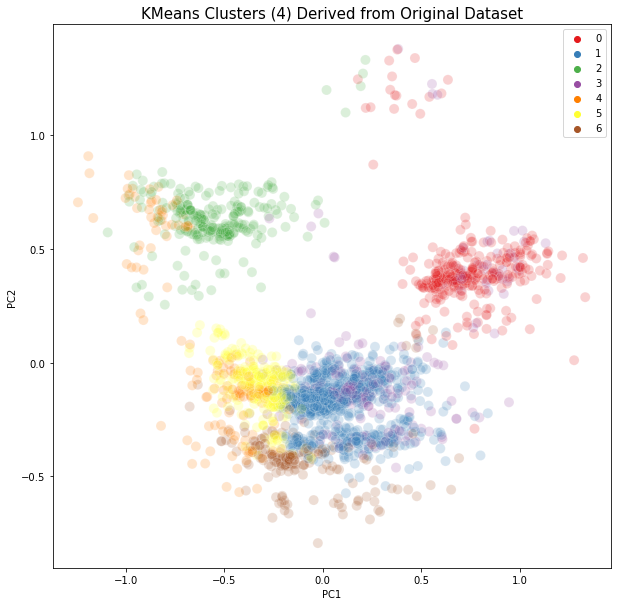

In [82]:
pca(dataset,7)

In [ ]:
# Silhouette analysis can be used to study the separation distance between the resulting clusters
def silhouette(dataset):
    kmeans_scale = KMeans(n_clusters=5, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(dataset)
    print('KMeans Scaled Silhouette Score: {}'
          .format(silhouette_score(dataset, kmeans_scale.labels_, metric='euclidean')))
    labels_scale = kmeans_scale.labels_

In [ ]:
silhouette(dataset)